In [6]:
import numpy as np
from PIL import Image
import os
import cv2
from scipy import ndimage
from sklearn.cluster import KMeans
from sklearn.neighbors import NearestNeighbors
import torch
import torch.nn.functional as F

CLASS_INFO = {
    0: {"name": "background", "rgb": [0, 0, 0]},
    1: {"name": "airplane", "rgb": [166, 202, 240]},
    2: {"name": "bare soil", "rgb": [128, 128, 0]},
    3: {"name": "buildings", "rgb": [0, 0, 128]},
    4: {"name": "cars", "rgb": [255, 0, 0]},
    5: {"name": "chaparral", "rgb": [0, 128, 0]},
    6: {"name": "court", "rgb": [128, 0, 0]},
    7: {"name": "dock", "rgb": [255, 233, 233]},
    8: {"name": "field", "rgb": [160, 160, 164]},
    9: {"name": "grass", "rgb": [0, 128, 128]},
    10: {"name": "mobile home", "rgb": [90, 87, 255]},
    11: {"name": "pavement", "rgb": [255, 255, 0]},
    12: {"name": "sand", "rgb": [255, 192, 0]},
    13: {"name": "sea", "rgb": [0, 0, 255]},
    14: {"name": "ship", "rgb": [255, 0, 192]},
    15: {"name": "tanks", "rgb": [128, 0, 128]},
    16: {"name": "trees", "rgb": [0, 255, 0]},
    17: {"name": "water", "rgb": [0, 255, 255]}
}

class TrainingBasedRefiner:
    def __init__(self):
        self.class_prototypes = {}
        self.class_features = {}
        self.knn_models = {}
        print("Initialized Training-Based Refiner")
    
    def extract_color_texture_features(self, image_patch):
        """Extract color and texture features from image patch"""
        if len(image_patch.shape) == 2:
            image_patch = cv2.cvtColor(image_patch, cv2.COLOR_GRAY2RGB)
        
        features = []
        
        # Color features (mean and std in LAB space)
        lab = cv2.cvtColor(image_patch, cv2.COLOR_RGB2LAB)
        for channel in range(3):
            features.extend([np.mean(lab[:, :, channel]), np.std(lab[:, :, channel])])
        
        # Texture features (LBP-like)
        gray = cv2.cvtColor(image_patch, cv2.COLOR_RGB2GRAY)
        
        # Gabor-like features (simplified)
        sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
        sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
        gradient_mag = np.sqrt(sobelx**2 + sobely**2)
        features.extend([np.mean(gradient_mag), np.std(gradient_mag)])
        
        # Histogram features
        hist = cv2.calcHist([gray], [0], None, [8], [0, 256])
        hist = hist.flatten() / hist.sum()  # Normalize
        features.extend(hist)
        
        return np.array(features)
    
    def build_class_prototypes_from_training(self, train_images_dir, train_masks_dir):
        """Build class prototypes from training data"""
        print("Building class prototypes from training data...")
        
        image_files = sorted([f for f in os.listdir(train_images_dir) if f.endswith(('.png', '.jpg', '.jpeg'))])
        
        # Initialize storage for class features
        for class_idx in CLASS_INFO.keys():
            self.class_features[class_idx] = []
        
        total_patches = 0
        
        for idx, img_file in enumerate(image_files):
            if idx % 50 == 0:
                print(f"Processing training image {idx}/{len(image_files)}")
            
            img_path = os.path.join(train_images_dir, img_file)
            mask_file = img_file.replace('.jpg', '.png').replace('.jpeg', '.png')
            mask_path = os.path.join(train_masks_dir, mask_file)
            
            if not os.path.exists(mask_path):
                continue
            
            # Load image and mask
            image = np.array(Image.open(img_path).convert('RGB'))
            mask = np.array(Image.open(mask_path))
            
            # Sample patches for each class
            for class_idx in CLASS_INFO.keys():
                if class_idx == 0:  # Skip background
                    continue
                
                class_mask = (mask == class_idx)
                if np.sum(class_mask) > 100:  # Only if class has significant presence
                    # Find connected components
                    num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(
                        class_mask.astype(np.uint8), connectivity=8
                    )
                    
                    # Sample up to 3 regions per class per image
                    sampled_regions = 0
                    for i in range(1, min(4, num_labels)):  # Skip background, take max 3
                        if stats[i, cv2.CC_STAT_AREA] > 50:  # Only substantial regions
                            # Get bounding box
                            x, y, w, h, area = stats[i]
                            
                            # Extract patch with padding
                            pad = 5
                            x1 = max(0, x - pad)
                            y1 = max(0, y - pad)
                            x2 = min(image.shape[1], x + w + pad)
                            y2 = min(image.shape[0], y + h + pad)
                            
                            patch = image[y1:y2, x1:x2]
                            
                            if patch.size > 0:
                                # Resize to standard size for consistent features
                                patch_resized = cv2.resize(patch, (64, 64))
                                
                                # Extract features
                                features = self.extract_color_texture_features(patch_resized)
                                self.class_features[class_idx].append(features)
                                total_patches += 1
                                sampled_regions += 1
                                
                                if sampled_regions >= 3:
                                    break
        
        # Build prototypes and KNN models for each class
        print("\nBuilding prototypes and KNN models...")
        for class_idx in CLASS_INFO.keys():
            if class_idx == 0:
                continue
                
            features_list = self.class_features[class_idx]
            if len(features_list) > 0:
                features_array = np.array(features_list)
                
                # Build KNN model for this class
                self.knn_models[class_idx] = NearestNeighbors(n_neighbors=5, metric='cosine')
                self.knn_models[class_idx].fit(features_array)
                
                # Compute prototype (mean feature)
                self.class_prototypes[class_idx] = np.mean(features_array, axis=0)
                
                print(f"Class {class_idx} ({CLASS_INFO[class_idx]['name']}): {len(features_list)} patches")
            else:
                print(f"WARNING: No patches for class {class_idx} ({CLASS_INFO[class_idx]['name']})")
                self.class_prototypes[class_idx] = None
        
        print(f"Total patches collected: {total_patches}")
        return self.class_prototypes
    
    def predict_class_similarity(self, image_patch, class_idx):
        """Predict how similar a patch is to a class"""
        if class_idx not in self.knn_models or self.class_prototypes[class_idx] is None:
            return 0.0
        
        # Extract features from patch
        patch_resized = cv2.resize(image_patch, (64, 64))
        features = self.extract_color_texture_features(patch_resized)
        
        # Find distance to nearest neighbors
        distances, indices = self.knn_models[class_idx].kneighbors([features])
        
        # Convert distance to similarity (cosine distance to similarity)
        similarity = 1.0 - np.mean(distances)
        
        return max(0.0, similarity)  # Ensure non-negative
    
    def morphological_cleanup(self, mask):
        """Clean mask using morphological operations"""
        kernel = np.ones((3, 3), np.uint8)
        cleaned_mask = mask.copy()
        
        for class_idx in CLASS_INFO.keys():
            if class_idx == 0:  # Skip background
                continue
                
            class_mask = (cleaned_mask == class_idx).astype(np.uint8)
            
            if np.sum(class_mask) > 0:  # Only process if class exists
                # Remove small noise
                class_cleaned = cv2.morphologyEx(class_mask, cv2.MORPH_OPEN, kernel)
                
                # Fill small holes
                class_cleaned = cv2.morphologyEx(class_cleaned, cv2.MORPH_CLOSE, kernel)
                
                # Update the mask
                cleaned_mask[class_mask == 1] = 0  # Remove original
                cleaned_mask[class_cleaned == 1] = class_idx  # Add cleaned
        
        return cleaned_mask
    
    def remove_small_regions(self, mask, min_size=100):
        """Remove small isolated regions"""
        cleaned_mask = mask.copy()
        
        for class_idx in CLASS_INFO.keys():
            if class_idx == 0:  # Skip background
                continue
                
            class_mask = (cleaned_mask == class_idx).astype(np.uint8)
            
            # Find connected components
            num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(class_mask, connectivity=8)
            
            for i in range(1, num_labels):  # Skip background (index 0)
                if stats[i, cv2.CC_STAT_AREA] < min_size:
                    # Remove small region
                    cleaned_mask[labels == i] = 0  # Set to background
        
        return cleaned_mask
    
    def refine_with_training_knowledge(self, image_path, mask_path, confidence_threshold=0.7):
        """Refine mask using training-based knowledge"""
        # Load image and mask
        image = np.array(Image.open(image_path).convert('RGB'))
        mask = np.array(Image.open(mask_path))
        
        print(f"Refining: {os.path.basename(mask_path)}")
        
        # Step 1: Basic cleanup
        mask = self.remove_small_regions(mask, min_size=50)
        mask = self.morphological_cleanup(mask)
        
        # Step 2: Training-based correction
        refined_mask = mask.copy()
        
        # Find uncertain regions (boundaries and small regions)
        uncertain_regions = self.find_uncertain_regions(mask)
        
        corrections_made = 0
        
        for region in uncertain_regions:
            y, x = region
            if 10 <= y < image.shape[0]-10 and 10 <= x < image.shape[1]-10:
                current_class = refined_mask[y, x]
                
                if current_class == 0:  # Skip background
                    continue
                
                # Extract patch around the point
                patch_size = 32
                y1 = max(0, y - patch_size//2)
                y2 = min(image.shape[0], y + patch_size//2)
                x1 = max(0, x - patch_size//2)
                x2 = min(image.shape[1], x + patch_size//2)
                
                patch = image[y1:y2, x1:x2]
                
                if patch.size == 0:
                    continue
                
                # Check similarity with current class
                current_similarity = self.predict_class_similarity(patch, current_class)
                
                # Find best matching class
                best_class = current_class
                best_similarity = current_similarity
                
                for test_class in CLASS_INFO.keys():
                    if test_class == 0 or test_class == current_class:
                        continue
                    
                    test_similarity = self.predict_class_similarity(patch, test_class)
                    if test_similarity > best_similarity:
                        best_similarity = test_similarity
                        best_class = test_class
                
                # Apply correction if significantly better and above threshold
                if (best_class != current_class and 
                    best_similarity > confidence_threshold and 
                    best_similarity > current_similarity + 0.1):
                    
                    refined_mask[y, x] = best_class
                    corrections_made += 1
        
        if corrections_made > 0:
            print(f"  Made {corrections_made} corrections")
        
        # Final smoothing
        refined_mask = cv2.medianBlur(refined_mask.astype(np.uint8), 3)
        
        return refined_mask
    
    def find_uncertain_regions(self, mask):
        """Find uncertain regions for refinement"""
        uncertain_points = []
        
        # Boundary regions
        grad_x = ndimage.sobel(mask, axis=1)
        grad_y = ndimage.sobel(mask, axis=0)
        gradient_magnitude = np.sqrt(grad_x**2 + grad_y**2)
        
        boundary_points = np.where(gradient_magnitude > 0)
        uncertain_points.extend(zip(boundary_points[0], boundary_points[1]))
        
        # Small regions
        for class_idx in CLASS_INFO.keys():
            if class_idx == 0:
                continue
                
            class_mask = (mask == class_idx).astype(np.uint8)
            num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(class_mask, connectivity=8)
            
            for i in range(1, num_labels):
                if stats[i, cv2.CC_STAT_AREA] < 100:  # Small region
                    small_region = np.where(labels == i)
                    uncertain_points.extend(zip(small_region[0], small_region[1]))
        
        return list(set(uncertain_points))  # Remove duplicates
    
    def batch_refine_masks(self, images_dir, masks_dir, output_dir, confidence_threshold=0.7):
        """Refine all masks using training knowledge"""
        os.makedirs(output_dir, exist_ok=True)
        
        image_files = sorted([f for f in os.listdir(images_dir) if f.endswith(('.png', '.jpg', '.jpeg'))])
        
        print(f"Refining {len(image_files)} masks using training knowledge...")
        
        processed_count = 0
        
        for img_file in image_files:
            image_path = os.path.join(images_dir, img_file)
            
            # Find corresponding mask
            mask_file = img_file.replace('.jpg', '.png').replace('.jpeg', '.png')
            mask_path = os.path.join(masks_dir, mask_file)
            
            if not os.path.exists(mask_path):
                # Try other extensions
                base_name = os.path.splitext(img_file)[0]
                for ext in ['.png', '.jpg', '.jpeg']:
                    mask_path = os.path.join(masks_dir, base_name + ext)
                    if os.path.exists(mask_path):
                        break
                else:
                    print(f"Mask not found for {img_file}")
                    continue
            
            try:
                # Refine the mask
                refined_mask = self.refine_with_training_knowledge(
                    image_path, mask_path, confidence_threshold
                )
                
                # Save refined mask
                output_path = os.path.join(output_dir, os.path.basename(mask_path))
                Image.fromarray(refined_mask.astype(np.uint8)).save(output_path)
                
                processed_count += 1
                
                if processed_count % 50 == 0:
                    print(f"Processed {processed_count} masks...")
                    
            except Exception as e:
                print(f"Error processing {mask_path}: {e}")
                continue
        
        print(f"\n=== Training-Based Refinement Complete ===")
        print(f"Processed: {processed_count} masks")
        print(f"Output directory: {output_dir}")
        
        return output_dir

def convert_to_rgb(input_dir, output_dir):
    """Convert all masks to RGB for visualization"""
    os.makedirs(output_dir, exist_ok=True)
    
    mask_files = [f for f in os.listdir(input_dir) if f.endswith(('.png', '.jpg', '.jpeg'))]
    
    print(f"Converting {len(mask_files)} masks to RGB...")
    
    for mask_file in mask_files:
        mask_path = os.path.join(input_dir, mask_file)
        
        try:
            mask = np.array(Image.open(mask_path))
            
            # Convert to RGB
            h, w = mask.shape
            rgb_mask = np.zeros((h, w, 3), dtype=np.uint8)
            
            for class_idx, info in CLASS_INFO.items():
                rgb_mask[mask == class_idx] = info["rgb"]
            
            # Save RGB mask
            output_path = os.path.join(output_dir, mask_file)
            Image.fromarray(rgb_mask).save(output_path)
            
        except Exception as e:
            print(f"Error converting {mask_file}: {e}")
    
    print(f"RGB masks saved to: {output_dir}")

# Main execution
if __name__ == "__main__":
    # Initialize refiner
    refiner = TrainingBasedRefiner()
    
    # Update these paths to your actual directories
    train_images_dir = '/home/iiitdmk-param/A.C/Anisha/4th objective/dlrsd/train_images'  # 640 training images
    train_masks_dir = '/home/iiitdmk-param/A.C/Anisha/4th objective/dlrsd/train_1cmasks'    # 640 training masks
    
    test_images_dir = "/home/iiitdmk-param/A.C/Anisha/4th objective/dlrsd/full_test_images"
    test_masks_dir = "/home/iiitdmk-param/A.C/Anisha/4th objective/dlrsd/topo_refined_predictions"
    
    refined_dir = "/home/iiitdmk-param/A.C/Anisha/4th objective/dlrsd/Dino_topo_refined_predictions"
    rgb_dir = "/home/iiitdmk-param/A.C/Anisha/4th objective/dlrsd/Dino_rgb_topo_refined_predictions"
    
    # Step 1: Build prototypes from training data
    print("=== Step 1: Building Class Prototypes from Training Data ===")
    prototypes = refiner.build_class_prototypes_from_training(train_images_dir, train_masks_dir)
    
    # Step 2: Refine masks using training knowledge
    print("\n=== Step 2: Refining Masks Using Training Knowledge ===")
    refined_output = refiner.batch_refine_masks(
        images_dir=test_images_dir,
        masks_dir=test_masks_dir,
        output_dir=refined_dir,
        confidence_threshold=0.6  # Adjust based on results
    )
    
    # Step 3: Convert to RGB
    print("\n=== Step 3: Converting to RGB ===")
    convert_to_rgb(refined_output, rgb_dir)
    
    print("\n=== Pipeline Complete ===")
    print(f"Training-based refined masks: {refined_dir}")
    print(f"RGB masks: {rgb_dir}")

Initialized Training-Based Refiner
=== Step 1: Building Class Prototypes from Training Data ===
Building class prototypes from training data...
Processing training image 0/630
Processing training image 50/630
Processing training image 100/630
Processing training image 150/630
Processing training image 200/630
Processing training image 250/630
Processing training image 300/630
Processing training image 350/630
Processing training image 400/630
Processing training image 450/630
Processing training image 500/630
Processing training image 550/630
Processing training image 600/630

Building prototypes and KNN models...
Class 1 (airplane): 37 patches
Class 2 (bare soil): 449 patches
Class 3 (buildings): 458 patches
Class 4 (cars): 684 patches
Class 5 (chaparral): 72 patches
Class 6 (court): 37 patches
Class 7 (dock): 64 patches
Class 8 (field): 26 patches
Class 9 (grass): 732 patches
Class 10 (mobile home): 88 patches
Class 11 (pavement): 628 patches
Class 12 (sand): 103 patches
Class 13 (se

🚀 STARTING FINAL POINT REFINEMENT PIPELINE
Pipeline: Fine-tuned SAM → Point Refinement → DINO → Final Point Refinement
🔄 Loading your fine-tuned SAM model for final refinement...
📋 Checkpoint keys: ['epoch', 'model_state_dict', 'optimizer_state_dict', 'loss', 'iou']
✅ Loaded fine-tuned model from epoch 94 with loss: 0.0995
🔍 Loading point annotations for final refinement...
📊 Loaded 158237 points across 1319 images
📸 Found 1319 DINO-refined predictions for final refinement
  🔄 Converting RGB mask to 1-channel...

[1/1319] 🔄 Processing: agric_1962.png
  📊 DINO prediction has 1 classes: ['background']
  🔧 Applying final refinement with 15 points...
    🎯 Refining field with 5 points...
      ✅ field: 168 pixels refined
    🎯 Refining trees with 10 points...
      ✅ trees: 678 pixels refined
    📊 Total refinement: 846 pixels updated
  ✨ Added classes: ['field', 'trees']
  💾 Saved final refined prediction
  🔄 Converting RGB mask to 1-channel...

[2/1319] 🔄 Processing: airpl_831.png
  📊 DI

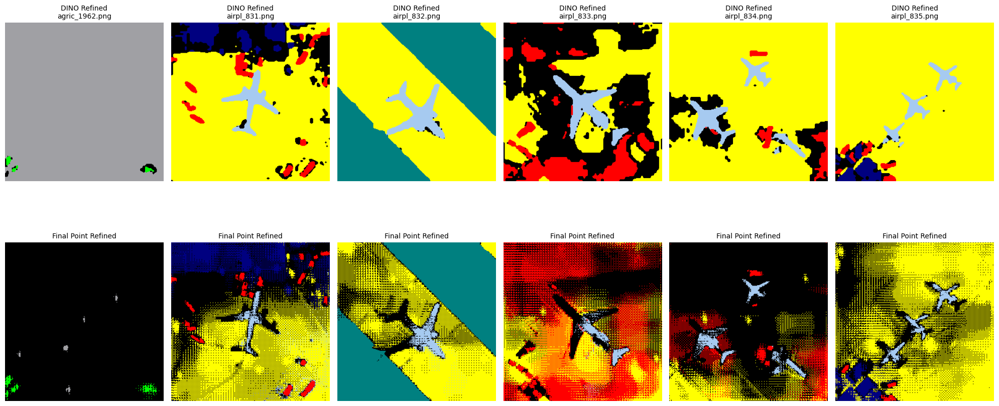

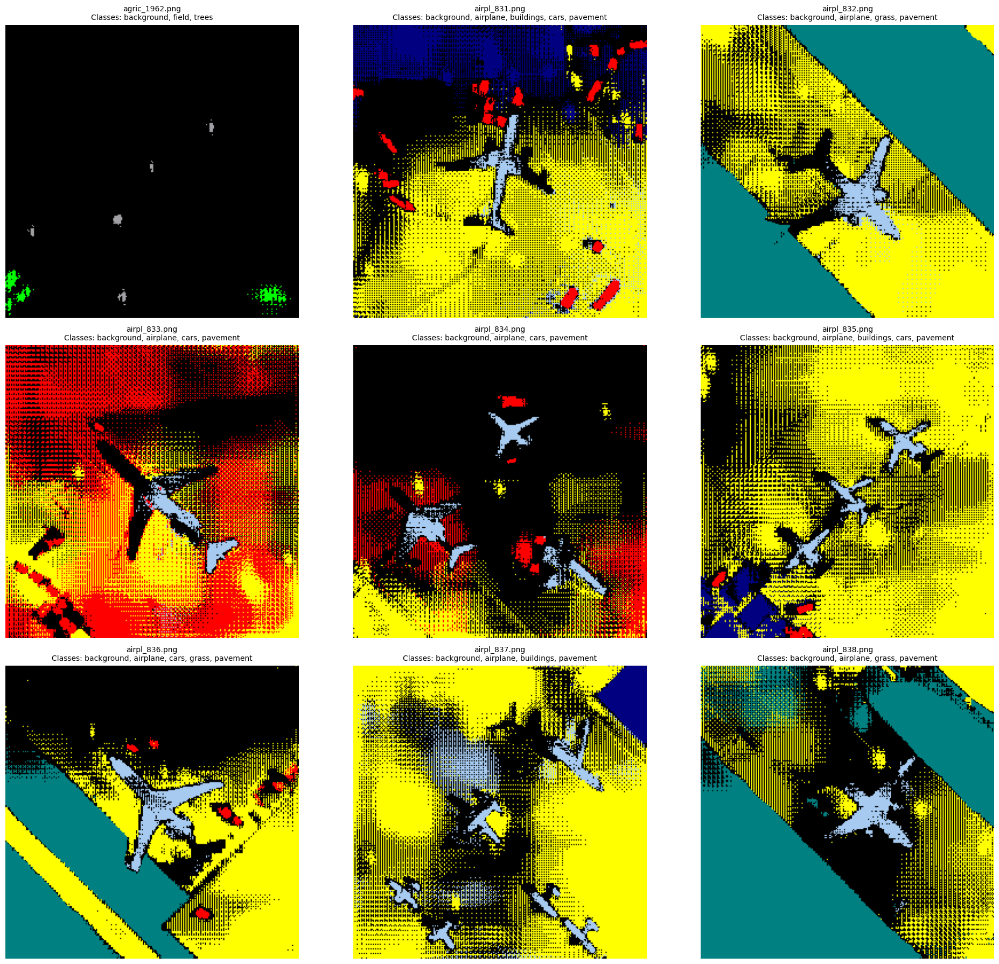


🎉 FINAL REFINEMENT PIPELINE COMPLETED SUCCESSFULLY!
📁 Final masks saved to: /home/iiitdmk-param/A.C/Anisha/4th objective/dlrsd/DINO_point_refined_predictions


In [10]:
import torch
import numpy as np
import cv2
import os
import matplotlib.pyplot as plt
from segment_anything import sam_model_registry
from torch import nn

# ==================== CONFIGURATION ====================
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Your directories
dino_refined_dir = '/home/iiitdmk-param/A.C/Anisha/4th objective/dlrsd/Dino_topo_refined_predictions'  # UPDATE THIS PATH
point_annotation_dir = '/home/iiitdmk-param/A.C/Anisha/4th objective/dlrsd/full_test_point_masks'
test_image_dir = '/home/iiitdmk-param/A.C/Anisha/4th objective/dlrsd/full_test_images'
final_output_dir = '/home/iiitdmk-param/A.C/Anisha/4th objective/dlrsd/DINO_point_refined_predictions'

# Your fine-tuned model
sam_checkpoint = "/home/iiitdmk-param/Desktop/sam_vit_b.pth"
model_type = "vit_b"
pretrained_model_path = 'best_high_iou_sam.pth'
# ==================== CLASS DEFINITIONS ====================
CLASS_INFO = {
    0: {"name": "background", "rgb": [0, 0, 0]},
    1: {"name": "airplane", "rgb": [166, 202, 240]},
    2: {"name": "bare soil", "rgb": [128, 128, 0]},
    3: {"name": "buildings", "rgb": [0, 0, 128]},
    4: {"name": "cars", "rgb": [255, 0, 0]},
    5: {"name": "chaparral", "rgb": [0, 128, 0]},
    6: {"name": "court", "rgb": [128, 0, 0]},
    7: {"name": "dock", "rgb": [255, 233, 233]},
    8: {"name": "field", "rgb": [160, 160, 164]},
    9: {"name": "grass", "rgb": [0, 128, 128]},
    10: {"name": "mobile home", "rgb": [90, 87, 255]},
    11: {"name": "pavement", "rgb": [255, 255, 0]},
    12: {"name": "sand", "rgb": [255, 192, 0]},
    13: {"name": "sea", "rgb": [0, 0, 255]},
    14: {"name": "ship", "rgb": [255, 0, 192]},
    15: {"name": "tanks", "rgb": [128, 0, 128]},
    16: {"name": "trees", "rgb": [0, 255, 0]},
    17: {"name": "water", "rgb": [0, 255, 255]}
}

NUM_CLASSES = len(CLASS_INFO)

# ==================== FIXED MULTI-CLASS SAM WRAPPER ====================
class MultiClassSAMWrapper(nn.Module):
    def __init__(self, sam_model, num_classes):
        super().__init__()
        self.sam = sam_model
        self.num_classes = num_classes
        
        # Match the architecture from your trained model
        self.segmentation_head = nn.Sequential(
            nn.Conv2d(256, 128, 3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 64, 3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, num_classes, 1)
        )
        
        # Freeze SAM parameters
        for param in self.sam.parameters():
            param.requires_grad = False
    
    def forward(self, x):
        with torch.no_grad():
            image_embeddings = self.sam.image_encoder(x)
        logits = self.segmentation_head(image_embeddings)
        return logits
    
    def get_sam_embedding(self, x):
        with torch.no_grad():
            return self.sam.image_encoder(x)
    
    def prompt_guided_prediction(self, image_embedding, point_coords, point_labels):
        sparse_embeddings, dense_embeddings = self.sam.prompt_encoder(
            points=(point_coords, point_labels),
            boxes=None,
            masks=None,
        )
        
        low_res_masks, iou_predictions = self.sam.mask_decoder(
            image_embeddings=image_embedding,
            image_pe=self.sam.prompt_encoder.get_dense_pe(),
            sparse_prompt_embeddings=sparse_embeddings,
            dense_prompt_embeddings=dense_embeddings,
            multimask_output=False,
        )
        
        return low_res_masks

# ==================== LOAD FINE-TUNED MODEL ====================
def load_pretrained_model(pretrained_path, sam_checkpoint, model_type, num_classes):
    print("🔄 Loading your fine-tuned SAM model for final refinement...")
    
    # First, let's inspect the checkpoint to understand its structure
    checkpoint = torch.load(pretrained_path, map_location=device, weights_only=False)
    print("📋 Checkpoint keys:", list(checkpoint.keys()))
    
    # Load SAM base model
    sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
    
    # Create wrapper with matching architecture
    model = MultiClassSAMWrapper(sam, num_classes)
    
    # Load state dict
    model.load_state_dict(checkpoint['model_state_dict'])
    model.to(device)
    model.eval()
    
    epoch = checkpoint.get('epoch', 'Unknown')
    loss = checkpoint.get('loss', 'Unknown')
    print(f"✅ Loaded fine-tuned model from epoch {epoch} with loss: {loss:.4f}")
    
    return model

# ==================== POINT ANNOTATION LOADING ====================
def load_point_annotations(point_annotation_dir, image_files):
    point_prompts = {}
    ignore_color = np.array([100, 100, 100])
    
    print("🔍 Loading point annotations for final refinement...")
    
    for image_file in image_files:
        base_name = os.path.splitext(image_file)[0]
        point_path = os.path.join(point_annotation_dir, f"{base_name}.png")
        
        if os.path.exists(point_path):
            point_mask = cv2.imread(point_path)
            if point_mask is None:
                continue
                
            point_mask = cv2.cvtColor(point_mask, cv2.COLOR_BGR2RGB)
            non_ignore_mask = ~np.all(point_mask == ignore_color, axis=-1)
            
            class_points = {}
            for class_id, info in CLASS_INFO.items():
                if class_id == 0:  # Skip background
                    continue
                    
                target_color = np.array(info["rgb"])
                mask = np.all(point_mask == target_color, axis=-1) & non_ignore_mask
                
                if np.any(mask):
                    y_coords, x_coords = np.where(mask)
                    points = list(zip(x_coords, y_coords))
                    class_points[class_id] = points
            
            point_prompts[base_name] = class_points
    
    images_with_points = sum(1 for points in point_prompts.values() if points)
    total_points = sum(sum(len(points) for points in classes.values()) for classes in point_prompts.values())
    
    print(f"📊 Loaded {total_points} points across {images_with_points} images")
    
    return point_prompts

# ==================== DINO PREDICTION LOADING ====================
def load_dino_prediction(pred_path, class_info):
    """Load DINO prediction, handling both 1-channel and RGB formats"""
    pred = cv2.imread(pred_path)
    
    if pred is None:
        return None
    
    # Check if it's 1-channel or 3-channel
    if len(pred.shape) == 3 and pred.shape[2] == 3:
        # RGB mask - convert to 1-channel
        print(f"  🔄 Converting RGB mask to 1-channel...")
        rgb_mask = cv2.cvtColor(pred, cv2.COLOR_BGR2RGB)
        h, w = rgb_mask.shape[:2]
        single_channel_mask = np.zeros((h, w), dtype=np.uint8)
        
        for class_id, info in class_info.items():
            target_color = np.array(info["rgb"])
            color_mask = np.all(rgb_mask == target_color, axis=-1)
            single_channel_mask[color_mask] = class_id
        
        return single_channel_mask
    else:
        # Already 1-channel
        if len(pred.shape) == 3:
            # Multi-channel but not RGB, take first channel
            return pred[:, :, 0]
        else:
            # True 1-channel
            return pred

# ==================== FINAL REFINEMENT WITH POINTS ====================
def final_refine_with_points(model, image_rgb, dino_pred, class_points, original_size, device):
    """Final refinement of DINO-improved masks using point prompts"""
    final_pred = dino_pred.copy()
    
    if not class_points:
        return final_pred
    
    # Preprocess image for SAM
    input_image = cv2.resize(image_rgb, (1024, 1024))
    input_image = input_image.astype(np.float32) / 255.0
    input_image = (input_image - np.array([0.485, 0.456, 0.406])) / np.array([0.229, 0.224, 0.225])
    input_image_tensor = torch.from_numpy(input_image).permute(2, 0, 1).float().to(device)
    
    # Get image embedding from fine-tuned SAM
    with torch.no_grad():
        image_embedding = model.get_sam_embedding(input_image_tensor.unsqueeze(0))
    
    # Refine each class with point prompts
    total_refined_pixels = 0
    
    for class_id, points in class_points.items():
        if len(points) == 0:
            continue
            
        print(f"    🎯 Refining {CLASS_INFO[class_id]['name']} with {len(points)} points...")
        class_refined_pixels = 0
        
        for point in points:
            x, y = point
            
            # Scale points to 1024x1024
            x_scale = 1024 / original_size[1]
            y_scale = 1024 / original_size[0]
            x_sam = int(x * x_scale)
            y_sam = int(y * y_scale)
            
            x_sam = max(0, min(x_sam, 1023))
            y_sam = max(0, min(y_sam, 1023))
            
            # Create point prompt
            point_coords = torch.tensor([[[x_sam, y_sam]]], device=device).float()
            point_labels = torch.tensor([[1]], device=device).long()
            
            # Get mask prediction from fine-tuned SAM
            with torch.no_grad():
                low_res_masks = model.prompt_guided_prediction(
                    image_embedding, point_coords, point_labels
                )
                
                # Upscale mask to original size
                mask = torch.nn.functional.interpolate(
                    low_res_masks,
                    size=original_size,
                    mode="bilinear",
                    align_corners=False,
                )
                mask = mask.squeeze().cpu().numpy() > 0.0
            
            # Count refined pixels and apply refinement
            pixels_refined = np.sum(mask)
            class_refined_pixels += pixels_refined
            
            # OVERWRITE the entire region with the correct class ID
            final_pred[mask] = class_id
        
        total_refined_pixels += class_refined_pixels
        print(f"      ✅ {CLASS_INFO[class_id]['name']}: {class_refined_pixels} pixels refined")
    
    print(f"    📊 Total refinement: {total_refined_pixels} pixels updated")
    return final_pred

# ==================== FINAL REFINEMENT PIPELINE ====================
def execute_final_refinement(model, point_prompts, dino_refined_dir, test_image_dir, final_output_dir, device):
    """Final refinement stage on DINO-improved masks"""
    os.makedirs(final_output_dir, exist_ok=True)
    model.eval()
    
    # Get DINO-refined prediction files
    pred_files = sorted([f for f in os.listdir(dino_refined_dir) if f.endswith(('.png', '.jpg', '.jpeg'))])
    image_files = sorted([f for f in os.listdir(test_image_dir) if f.endswith(('.png', '.jpg', '.jpeg'))])
    
    print(f"📸 Found {len(pred_files)} DINO-refined predictions for final refinement")
    
    refinement_stats = []
    
    for i, (pred_file, image_file) in enumerate(zip(pred_files, image_files), 1):
        base_name = os.path.splitext(pred_file)[0].replace('mask_', '')
        
        # Load DINO-refined prediction (handles both 1-channel and RGB)
        pred_path = os.path.join(dino_refined_dir, pred_file)
        dino_pred = load_dino_prediction(pred_path, CLASS_INFO)
        
        if dino_pred is None:
            print(f"❌ Could not load DINO prediction: {pred_file}")
            continue
        
        # Validate the loaded mask
        if len(dino_pred.shape) != 2:
            print(f"❌ DINO prediction {pred_file} is not 1-channel after conversion")
            continue
        
        # Load original image
        image_path = os.path.join(test_image_dir, image_file)
        image = cv2.imread(image_path)
        if image is None:
            print(f"❌ Could not load image: {image_file}")
            continue
            
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        original_size = image_rgb.shape[:2]
        
        print(f"\n[{i}/{len(pred_files)}] 🔄 Processing: {pred_file}")
        
        # Get DINO prediction stats
        dino_classes = np.unique(dino_pred)
        dino_class_names = [CLASS_INFO.get(cid, {"name": f"unknown_{cid}"})["name"] for cid in dino_classes]
        print(f"  📊 DINO prediction has {len(dino_classes)} classes: {dino_class_names}")
        
        # Apply final point refinement
        if base_name in point_prompts and point_prompts[base_name]:
            point_count = sum(len(p) for p in point_prompts[base_name].values())
            print(f"  🔧 Applying final refinement with {point_count} points...")
            
            final_pred = final_refine_with_points(
                model, image_rgb, dino_pred, point_prompts[base_name], original_size, device
            )
            
            # Compare changes
            final_classes = np.unique(final_pred)
            final_class_names = [CLASS_INFO.get(cid, {"name": f"unknown_{cid}"})["name"] for cid in final_classes]
            
            changed_classes = set(final_classes) - set(dino_classes)
            if changed_classes:
                changed_names = [CLASS_INFO[cid]['name'] for cid in changed_classes if cid in CLASS_INFO]
                print(f"  ✨ Added classes: {changed_names}")
            
            refinement_stats.append({
                'image': pred_file,
                'dino_classes': len(dino_classes),
                'final_classes': len(final_classes),
                'points_used': point_count,
                'classes_added': len(changed_classes)
            })
        else:
            final_pred = dino_pred
            print(f"  ⚠️  No point annotations, keeping DINO prediction")
            
            refinement_stats.append({
                'image': pred_file,
                'dino_classes': len(dino_classes),
                'final_classes': len(dino_classes),
                'points_used': 0,
                'classes_added': 0
            })
        
        # Save final prediction as 1-channel
        output_path = os.path.join(final_output_dir, pred_file)
        cv2.imwrite(output_path, final_pred)
        print(f"  💾 Saved final refined prediction")
    
    # Print refinement summary
    print("\n" + "="*60)
    print("📈 FINAL REFINEMENT SUMMARY")
    print("="*60)
    
    total_points = sum(stat['points_used'] for stat in refinement_stats)
    total_refined = sum(1 for stat in refinement_stats if stat['points_used'] > 0)
    total_classes_added = sum(stat['classes_added'] for stat in refinement_stats)
    
    print(f"   • Images processed: {len(refinement_stats)}")
    print(f"   • Images refined with points: {total_refined}")
    print(f"   • Total points used: {total_points}")
    print(f"   • Total classes added: {total_classes_added}")
    print(f"   • Output directory: {final_output_dir}")

# ==================== VISUALIZATION FUNCTIONS ====================
def visualize_predictions(predictions_folder, num_samples=9):
    """Visualize prediction masks with proper class colors"""
    image_files = sorted([f for f in os.listdir(predictions_folder) if f.endswith(('.png', '.jpg', '.jpeg'))])
    
    if not image_files:
        print("❌ No prediction files found for visualization")
        return
    
    num_images = min(len(image_files), num_samples)
    cols = 3
    rows = (num_images + cols - 1) // cols
    
    fig, axes = plt.subplots(rows, cols, figsize=(20, 6*rows))
    if rows > 1:
        axes = axes.flatten()
    else:
        axes = [axes] if cols == 1 else axes
    
    for i, image_file in enumerate(image_files[:num_images]):
        image_path = os.path.join(predictions_folder, image_file)
        mask = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
        
        if mask is None:
            continue
        
        # Create colored mask using class RGB values
        colored_mask = np.zeros((mask.shape[0], mask.shape[1], 3), dtype=np.uint8)
        for class_id, info in CLASS_INFO.items():
            colored_mask[mask == class_id] = info["rgb"]
        
        axes[i].imshow(colored_mask)
        
        # Get unique classes in this mask
        unique_classes = np.unique(mask)
        class_names = [CLASS_INFO.get(cid, {"name": f"unknown_{cid}"})["name"] for cid in unique_classes]
        
        axes[i].set_title(f'{image_file}\nClasses: {", ".join(class_names)}', fontsize=10)
        axes[i].axis('off')
    
    # Hide unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')
    
    plt.tight_layout()
    plt.show()

def visualize_comparison(dino_dir, final_dir, num_samples=6):
    """Compare DINO vs Final refined predictions"""
    pred_files = sorted([f for f in os.listdir(dino_dir) if f.endswith('.png')])[:num_samples]
    
    if not pred_files:
        print("❌ No prediction files found for comparison")
        return
    
    fig, axes = plt.subplots(2, len(pred_files), figsize=(20, 10))
    if len(pred_files) == 1:
        axes = axes.reshape(2, 1)
    
    for i, pred_file in enumerate(pred_files):
        # Load both predictions
        dino_path = os.path.join(dino_dir, pred_file)
        final_path = os.path.join(final_dir, pred_file)
        
        dino_mask = cv2.imread(dino_path, cv2.IMREAD_GRAYSCALE)
        final_mask = cv2.imread(final_path, cv2.IMREAD_GRAYSCALE)
        
        if dino_mask is None or final_mask is None:
            continue
        
        # Create colored masks
        def create_colored_mask(mask):
            colored = np.zeros((*mask.shape, 3), dtype=np.uint8)
            for class_id, info in CLASS_INFO.items():
                colored[mask == class_id] = info["rgb"]
            return colored
        
        dino_colored = create_colored_mask(dino_mask)
        final_colored = create_colored_mask(final_mask)
        
        # Plot
        axes[0, i].imshow(dino_colored)
        axes[0, i].set_title(f'DINO Refined\n{pred_file}', fontsize=10)
        axes[0, i].axis('off')
        
        axes[1, i].imshow(final_colored)
        axes[1, i].set_title(f'Final Point Refined', fontsize=10)
        axes[1, i].axis('off')
    
    plt.tight_layout()
    plt.show()

# ==================== MAIN EXECUTION ====================
def main():
    print("🚀 STARTING FINAL POINT REFINEMENT PIPELINE")
    print("=" * 60)
    print("Pipeline: Fine-tuned SAM → Point Refinement → DINO → Final Point Refinement")
    print("=" * 60)
    
    try:
        # Load your fine-tuned model
        model = load_pretrained_model(pretrained_model_path, sam_checkpoint, model_type, NUM_CLASSES)
        
        # Load point annotations
        image_files = sorted([f for f in os.listdir(test_image_dir) if f.endswith(('.png', '.jpg', '.jpeg'))])
        point_prompts = load_point_annotations(point_annotation_dir, image_files)
        
        # Execute final refinement on DINO-improved masks
        execute_final_refinement(
            model, 
            point_prompts, 
            dino_refined_dir,  # Your DINO-refined predictions
            test_image_dir,    
            final_output_dir, 
            device
        )
        
        # Visualize results
        visualize_comparison(dino_refined_dir, final_output_dir)
        visualize_predictions(final_output_dir)
        
        print("\n🎉 FINAL REFINEMENT PIPELINE COMPLETED SUCCESSFULLY!")
        print(f"📁 Final masks saved to: {final_output_dir}")
        
    except Exception as e:
        print(f"❌ Error in pipeline: {e}")
        import traceback
        traceback.print_exc()

if __name__ == "__main__":
    main()

In [12]:
import os
import numpy as np
from PIL import Image

# Define the class information
CLASS_INFO = {
    0: {"name": "background", "rgb": [0, 0, 0]},
    1: {"name": "airplane", "rgb": [166, 202, 240]},
    2: {"name": "bare soil", "rgb": [128, 128, 0]},
    3: {"name": "buildings", "rgb": [0, 0, 128]},
    4: {"name": "cars", "rgb": [255, 0, 0]},
    5: {"name": "chaparral", "rgb": [0, 128, 0]},
    6: {"name": "court", "rgb": [128, 0, 0]},
    7: {"name": "dock", "rgb": [255, 233, 233]},
    8: {"name": "field", "rgb": [160, 160, 164]},
    9: {"name": "grass", "rgb": [0, 128, 128]},
    10: {"name": "mobile home", "rgb": [90, 87, 255]},
    11: {"name": "pavement", "rgb": [255, 255, 0]},
    12: {"name": "sand", "rgb": [255, 192, 0]},
    13: {"name": "sea", "rgb": [0, 0, 255]},
    14: {"name": "ship", "rgb": [255, 0, 192]},
    15: {"name": "tanks", "rgb": [128, 0, 128]},
    16: {"name": "trees", "rgb": [0, 255, 0]},
    17: {"name": "water", "rgb": [0, 255, 255]}
}

def calculate_detailed_miou(gt_folder, pred_folder, num_classes=18, ignore_index=None):
    """
    Calculate detailed mIoU with per-class results
    """
    
    gt_files = sorted([f for f in os.listdir(gt_folder) if f.endswith(('.png', '.jpg', '.jpeg', '.tiff'))])
    pred_files = sorted([f for f in os.listdir(pred_folder) if f.endswith(('.png', '.jpg', '.jpeg', '.tiff'))])
    
    assert len(gt_files) == len(pred_files), f"Number of files don't match: GT={len(gt_files)}, Pred={len(pred_files)}"
    
    # Initialize intersection and union arrays
    total_intersection = np.zeros(num_classes)
    total_union = np.zeros(num_classes)
    class_pixels = np.zeros(num_classes)  # For pixel accuracy
    
    print(f"Processing {len(gt_files)} images...")
    
    for i, (gt_file, pred_file) in enumerate(zip(gt_files, pred_files)):
        gt_path = os.path.join(gt_folder, gt_file)
        pred_path = os.path.join(pred_folder, pred_file)
        
        # Load 1-channel masks
        gt_mask = np.array(Image.open(gt_path))
        pred_mask = np.array(Image.open(pred_path))
        
        # Ensure masks have the same shape
        assert gt_mask.shape == pred_mask.shape, f"Shape mismatch: GT{gt_mask.shape} vs Pred{pred_mask.shape}"
        
        # Calculate IoU for each class
        for class_id in range(num_classes):
            if ignore_index is not None and class_id == ignore_index:
                continue
                
            gt_class = (gt_mask == class_id)
            pred_class = (pred_mask == class_id)
            
            intersection = np.logical_and(gt_class, pred_class).sum()
            union = np.logical_or(gt_class, pred_class).sum()
            
            total_intersection[class_id] += intersection
            total_union[class_id] += union
            class_pixels[class_id] += gt_class.sum()
        
        if (i + 1) % 100 == 0:
            print(f"Processed {i + 1}/{len(gt_files)} images")
    
    # Calculate IoU for each class
    iou_per_class = np.zeros(num_classes)
    for class_id in range(num_classes):
        if total_union[class_id] > 0:
            iou_per_class[class_id] = total_intersection[class_id] / total_union[class_id]
        else:
            iou_per_class[class_id] = np.nan
    
    # Calculate mIoU (mean over classes, ignoring NaN)
    valid_classes = ~np.isnan(iou_per_class)
    miou = np.mean(iou_per_class[valid_classes])
    
    # Calculate pixel accuracy
    pixel_accuracy = total_intersection.sum() / class_pixels.sum() if class_pixels.sum() > 0 else 0
    
    return miou, iou_per_class, pixel_accuracy

# Usage with detailed results
gt_folder = '/home/iiitdmk-param/A.C/Anisha/4th objective/dlrsd/full_test_1cmasks'
pred_folder = '/home/iiitdmk-param/A.C/Anisha/4th objective/dlrsd/Dino_topo_refined_predictions'
num_classes = 18

miou, iou_per_class, pixel_acc = calculate_detailed_miou(gt_folder, pred_folder, num_classes)

print("\n" + "="*50)
print("SEMANTIC SEGMENTATION RESULTS")
print("="*50)
print(f"mIoU: {miou:.4f}")
print(f"Pixel Accuracy: {pixel_acc:.4f}")
print("\nPer-class IoU:")
for class_id in range(num_classes):
    class_name = CLASS_INFO[class_id]["name"]
    iou = iou_per_class[class_id]
    if not np.isnan(iou):
        print(f"  {class_name:15}: {iou:.4f}")
    else:
        print(f"  {class_name:15}: No pixels")

Processing 1319 images...
Processed 100/1319 images
Processed 200/1319 images
Processed 300/1319 images
Processed 400/1319 images
Processed 500/1319 images
Processed 600/1319 images
Processed 700/1319 images
Processed 800/1319 images
Processed 900/1319 images
Processed 1000/1319 images
Processed 1100/1319 images
Processed 1200/1319 images
Processed 1300/1319 images

SEMANTIC SEGMENTATION RESULTS
mIoU: 0.5602
Pixel Accuracy: 0.7288

Per-class IoU:
  background     : 0.0000
  airplane       : 0.6574
  bare soil      : 0.3737
  buildings      : 0.6145
  cars           : 0.7276
  chaparral      : 0.4397
  court          : 0.7636
  dock           : 0.4859
  field          : 0.2271
  grass          : 0.6413
  mobile home    : 0.5521
  pavement       : 0.7190
  sand           : 0.4979
  sea            : 0.8506
  ship           : 0.5412
  tanks          : 0.6916
  trees          : 0.5770
  water          : 0.7228


In [13]:
import torch
import numpy as np
import cv2
import os
import matplotlib.pyplot as plt
from torch.utils.data import Dataset, DataLoader
from segment_anything import sam_model_registry
from torch.optim import Adam
import torch.nn as nn
from glob import glob

# ==================== CONFIGURATION ====================
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
test_image_dir = '/home/iiitdmk-param/A.C/Anisha/4th objective/dlrsd/full_test_images'
point_annotation_dir = '/home/iiitdmk-param/A.C/Anisha/4th objective/dlrsd/full_test_point_masks'
initial_predictions_dir = '/home/iiitdmk-param/A.C/Anisha/4th objective/dlrsd/Dino_topo_refined_predictions'
refined_output_dir = '/home/iiitdmk-param/A.C/Anisha/4th objective/dlrsd/DINO_topo_point_refined_predictions'
sam_checkpoint = "/home/iiitdmk-param/Desktop/sam_vit_b.pth"
model_type = "vit_b"
pretrained_model_path = 'best_high_iou_sam.pth'

# ==================== CLASS DEFINITIONS ====================
CLASS_INFO = {
    0: {"name": "background", "rgb": [0, 0, 0]},
    1: {"name": "airplane", "rgb": [166, 202, 240]},
    2: {"name": "bare soil", "rgb": [128, 128, 0]},
    3: {"name": "buildings", "rgb": [0, 0, 128]},
    4: {"name": "cars", "rgb": [255, 0, 0]},
    5: {"name": "chaparral", "rgb": [0, 128, 0]},
    6: {"name": "court", "rgb": [128, 0, 0]},
    7: {"name": "dock", "rgb": [255, 233, 233]},
    8: {"name": "field", "rgb": [160, 160, 164]},
    9: {"name": "grass", "rgb": [0, 128, 128]},
    10: {"name": "mobile home", "rgb": [90, 87, 255]},
    11: {"name": "pavement", "rgb": [255, 255, 0]},
    12: {"name": "sand", "rgb": [255, 192, 0]},
    13: {"name": "sea", "rgb": [0, 0, 255]},
    14: {"name": "ship", "rgb": [255, 0, 192]},
    15: {"name": "tanks", "rgb": [128, 0, 128]},
    16: {"name": "trees", "rgb": [0, 255, 0]},
    17: {"name": "water", "rgb": [0, 255, 255]}
}

NUM_CLASSES = len(CLASS_INFO)

# ==================== POINT ANNOTATION LOADING ====================
def load_point_annotations(point_annotation_dir, image_files):
    """Load RGB point annotations and convert to class coordinates, ignoring (100,100,100) pixels"""
    point_prompts = {}
    ignore_color = np.array([100, 100, 100])
    
    print("🔍 Loading point annotations...")
    
    for image_file in image_files:
        base_name = image_file.split('.')[0]
        point_path = os.path.join(point_annotation_dir, f"{base_name}.png")
        
        if os.path.exists(point_path):
            point_mask = cv2.imread(point_path)
            if point_mask is None:
                continue
                
            point_mask = cv2.cvtColor(point_mask, cv2.COLOR_BGR2RGB)
            original_size = point_mask.shape[:2]
            
            # Create ignore mask (pixels that are NOT ignore color)
            non_ignore_mask = ~np.all(point_mask == ignore_color, axis=-1)
            
            # Extract point prompts for each class
            class_points = {}
            
            for class_id, info in CLASS_INFO.items():
                if class_id == 0:  # Skip background
                    continue
                    
                target_color = np.array(info["rgb"])
                # Find pixels that match this class color AND are not ignore color
                mask = np.all(point_mask == target_color, axis=-1) & non_ignore_mask
                
                if np.any(mask):
                    # Get coordinates of points
                    y_coords, x_coords = np.where(mask)
                    points = list(zip(x_coords, y_coords))
                    class_points[class_id] = points
            
            point_prompts[base_name] = class_points
    
    return point_prompts

# ==================== MODEL ARCHITECTURE ====================
class HighIoUSAMWrapper(nn.Module):
    def __init__(self, sam_model, num_classes):
        super().__init__()
        self.sam = sam_model
        self.num_classes = num_classes
        
        self.segmentation_head = nn.Sequential(
            nn.Conv2d(256, 128, 3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 64, 3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, num_classes, 1)
        )
        
        for param in self.sam.parameters():
            param.requires_grad = False
    
    def forward(self, x):
        with torch.no_grad():
            image_embeddings = self.sam.image_encoder(x)
        logits = self.segmentation_head(image_embeddings)
        return logits
    
    def get_sam_embedding(self, x):
        """Get SAM image embeddings for point refinement"""
        with torch.no_grad():
            return self.sam.image_encoder(x)
    
    def prompt_guided_prediction(self, image_embedding, point_coords, point_labels):
        """Use SAM's prompt encoder and mask decoder for point refinement"""
        sparse_embeddings, dense_embeddings = self.sam.prompt_encoder(
            points=(point_coords, point_labels),
            boxes=None,
            masks=None,
        )
        
        low_res_masks, iou_predictions = self.sam.mask_decoder(
            image_embeddings=image_embedding,
            image_pe=self.sam.prompt_encoder.get_dense_pe(),
            sparse_prompt_embeddings=sparse_embeddings,
            dense_prompt_embeddings=dense_embeddings,
            multimask_output=False,
        )
        
        return low_res_masks

# ==================== LOAD PRE-TRAINED MODEL ====================
def load_pretrained_model(pretrained_path, sam_checkpoint, model_type, num_classes):
    print("🔄 Loading SAM base model...")
    sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
    
    print("🔄 Creating wrapper model...")
    model = HighIoUSAMWrapper(sam, num_classes)
    
    print(f"🔄 Loading pre-trained weights from {pretrained_path}...")
    
    if not os.path.exists(pretrained_path):
        raise FileNotFoundError(f"❌ Pre-trained model not found at: {pretrained_path}")
    
    checkpoint = torch.load(pretrained_path, map_location=device, weights_only=False)
    model.load_state_dict(checkpoint['model_state_dict'])
    
    return model

# ==================== REFINEMENT FUNCTIONS ====================
def refine_with_points(model, image_rgb, initial_pred, class_points, original_size, device):
    """Refine initial prediction using point prompts with fine-tuned SAM"""
    refined_pred = initial_pred.copy()
    
    if not class_points:
        return refined_pred
    
    # Preprocess image for SAM
    input_image = cv2.resize(image_rgb, (1024, 1024))
    input_image = input_image.astype(np.float32) / 255.0
    input_image = (input_image - np.array([0.485, 0.456, 0.406])) / np.array([0.229, 0.224, 0.225])
    input_image_tensor = torch.from_numpy(input_image).permute(2, 0, 1).float().to(device)
    
    # Get image embedding from your fine-tuned SAM
    with torch.no_grad():
        image_embedding = model.get_sam_embedding(input_image_tensor.unsqueeze(0))
    
    # Process each class with point prompts
    total_refined_pixels = 0
    
    for class_id, points in class_points.items():
        if len(points) == 0:
            continue
            
        #print(f"    🎯 Refining {CLASS_INFO[class_id]['name']} with {len(points)} points...")
        class_refined_pixels = 0
        
        for point_idx, point in enumerate(points):
            x, y = point
            
            # Scale points to 1024x1024
            x_scale = 1024 / original_size[1]
            y_scale = 1024 / original_size[0]
            x_sam = int(x * x_scale)
            y_sam = int(y * y_scale)
            
            # Ensure coordinates are within bounds
            x_sam = max(0, min(x_sam, 1023))
            y_sam = max(0, min(y_sam, 1023))
            
            # Create point prompt
            point_coords = torch.tensor([[[x_sam, y_sam]]], device=device).float()
            point_labels = torch.tensor([[1]], device=device).long()
            
            # Get mask prediction from your fine-tuned SAM
            with torch.no_grad():
                low_res_masks = model.prompt_guided_prediction(
                    image_embedding, point_coords, point_labels
                )
                
                # Upscale mask to original size
                mask = torch.nn.functional.interpolate(
                    low_res_masks,
                    size=original_size,
                    mode="bilinear",
                    align_corners=False,
                )
                mask = mask.squeeze().cpu().numpy() > 0.0
            
            # Count how many pixels we're refining
            pixels_refined = np.sum(mask)
            class_refined_pixels += pixels_refined
            
            # OVERWRITE the entire region with the correct class ID
            refined_pred[mask] = class_id
        
        total_refined_pixels += class_refined_pixels
        #print(f"      ✅ {CLASS_INFO[class_id]['name']}: {class_refined_pixels} pixels refined")
    
    #print(f"    📊 Total refinement: {total_refined_pixels} pixels updated")
    return refined_pred

# ==================== REFINEMENT ONLY ====================
def refine_predictions_only(model, point_prompts, test_image_dir, initial_predictions_dir, refined_output_dir, device='cuda'):
    """Refine existing initial predictions using point prompts"""
    os.makedirs(refined_output_dir, exist_ok=True)
    model.eval()
    
    image_files = sorted([f for f in os.listdir(test_image_dir) if f.endswith(('.png', '.jpg', '.jpeg'))])
    
    print(f"📸 Found {len(image_files)} test images")
    print(f"💾 Loading initial predictions from: {initial_predictions_dir}")
    print(f"💾 Saving refined predictions to: {refined_output_dir}")
    
    for image_idx, image_file in enumerate(image_files, 1):
        image_path = os.path.join(test_image_dir, image_file)
        base_name = image_file.split('.')[0]
        
        # Load image
        image = cv2.imread(image_path)
        if image is None:
            print(f"❌ Could not load image: {image_file}")
            continue
            
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        original_size = image_rgb.shape[:2]
        
        # Load initial prediction
        initial_pred_path = os.path.join(initial_predictions_dir, image_file)
        if not os.path.exists(initial_pred_path):
            print(f"❌ Initial prediction not found: {initial_pred_path}")
            continue
            
        initial_prediction = cv2.imread(initial_pred_path, cv2.IMREAD_GRAYSCALE)
        if initial_prediction is None:
            print(f"❌ Could not load initial prediction: {initial_pred_path}")
            continue
        
        #print(f"[{image_idx}/{len(image_files)}] 🔄 Refining {image_file}...")
        
        # Analyze initial prediction
        initial_classes = np.unique(initial_prediction)
        initial_class_names = [CLASS_INFO.get(cid, {"name": f"unknown_{cid}"})["name"] for cid in initial_classes]
        #print(f"  📊 Initial classes: {list(zip(initial_classes, initial_class_names))}")
        
        # Refine with point prompts if available
        if base_name in point_prompts and point_prompts[base_name]:
            #print(f"  🔧 Refining with point annotations...")
            refined_prediction = refine_with_points(
                model, image_rgb, initial_prediction, point_prompts[base_name], original_size, device
            )
            refinement_type = "REFINED"
        else:
            refined_prediction = initial_prediction
            print(f"  ⚠️  No point annotations found, using initial prediction")
            refinement_type = "INITIAL"
        
        # Save refined prediction
        predictions_uint8 = refined_prediction.astype(np.uint8)
        output_path = os.path.join(refined_output_dir, f'{image_file}')
        cv2.imwrite(output_path, predictions_uint8)
        
        # Analyze final prediction
        final_classes = np.unique(refined_prediction)
        final_class_names = [CLASS_INFO.get(cid, {"name": f"unknown_{cid}"})["name"] for cid in final_classes]
        #print(f"  ✅ Saved {refinement_type} mask - Classes: {list(zip(final_classes, final_class_names))}")
    
    print("\n🎉 All refinements completed!")

# ==================== MAIN EXECUTION ====================
def main():
    print("🚀 Starting refinement of initial predictions...")
    
    # Load your pre-trained fine-tuned model
    model = load_pretrained_model(pretrained_model_path, sam_checkpoint, model_type, NUM_CLASSES)
    model = model.to(device)
    model.eval()
    
    # Load point annotations
    test_image_files = sorted([f for f in os.listdir(test_image_dir) if f.endswith(('.png', '.jpg', '.jpeg'))])
    point_prompts = load_point_annotations(point_annotation_dir, test_image_files)
    
    # Refine existing initial predictions
    refine_predictions_only(model, point_prompts, test_image_dir, initial_predictions_dir, refined_output_dir, device)
    
    print("\n🎯 Refinement completed successfully!")

if __name__ == "__main__":
    main()

🚀 Starting refinement of initial predictions...
🔄 Loading SAM base model...
🔄 Creating wrapper model...
🔄 Loading pre-trained weights from best_high_iou_sam.pth...
🔍 Loading point annotations...
📸 Found 1319 test images
💾 Loading initial predictions from: /home/iiitdmk-param/A.C/Anisha/4th objective/dlrsd/Dino_topo_refined_predictions
💾 Saving refined predictions to: /home/iiitdmk-param/A.C/Anisha/4th objective/dlrsd/DINO_topo_point_refined_predictions

🎉 All refinements completed!

🎯 Refinement completed successfully!


In [14]:
import os
import numpy as np
from PIL import Image

# Define the class information
CLASS_INFO = {
    0: {"name": "background", "rgb": [0, 0, 0]},
    1: {"name": "airplane", "rgb": [166, 202, 240]},
    2: {"name": "bare soil", "rgb": [128, 128, 0]},
    3: {"name": "buildings", "rgb": [0, 0, 128]},
    4: {"name": "cars", "rgb": [255, 0, 0]},
    5: {"name": "chaparral", "rgb": [0, 128, 0]},
    6: {"name": "court", "rgb": [128, 0, 0]},
    7: {"name": "dock", "rgb": [255, 233, 233]},
    8: {"name": "field", "rgb": [160, 160, 164]},
    9: {"name": "grass", "rgb": [0, 128, 128]},
    10: {"name": "mobile home", "rgb": [90, 87, 255]},
    11: {"name": "pavement", "rgb": [255, 255, 0]},
    12: {"name": "sand", "rgb": [255, 192, 0]},
    13: {"name": "sea", "rgb": [0, 0, 255]},
    14: {"name": "ship", "rgb": [255, 0, 192]},
    15: {"name": "tanks", "rgb": [128, 0, 128]},
    16: {"name": "trees", "rgb": [0, 255, 0]},
    17: {"name": "water", "rgb": [0, 255, 255]}
}

def calculate_detailed_miou(gt_folder, pred_folder, num_classes=18, ignore_index=None):
    """
    Calculate detailed mIoU with per-class results
    """
    
    gt_files = sorted([f for f in os.listdir(gt_folder) if f.endswith(('.png', '.jpg', '.jpeg', '.tiff'))])
    pred_files = sorted([f for f in os.listdir(pred_folder) if f.endswith(('.png', '.jpg', '.jpeg', '.tiff'))])
    
    assert len(gt_files) == len(pred_files), f"Number of files don't match: GT={len(gt_files)}, Pred={len(pred_files)}"
    
    # Initialize intersection and union arrays
    total_intersection = np.zeros(num_classes)
    total_union = np.zeros(num_classes)
    class_pixels = np.zeros(num_classes)  # For pixel accuracy
    
    print(f"Processing {len(gt_files)} images...")
    
    for i, (gt_file, pred_file) in enumerate(zip(gt_files, pred_files)):
        gt_path = os.path.join(gt_folder, gt_file)
        pred_path = os.path.join(pred_folder, pred_file)
        
        # Load 1-channel masks
        gt_mask = np.array(Image.open(gt_path))
        pred_mask = np.array(Image.open(pred_path))
        
        # Ensure masks have the same shape
        assert gt_mask.shape == pred_mask.shape, f"Shape mismatch: GT{gt_mask.shape} vs Pred{pred_mask.shape}"
        
        # Calculate IoU for each class
        for class_id in range(num_classes):
            if ignore_index is not None and class_id == ignore_index:
                continue
                
            gt_class = (gt_mask == class_id)
            pred_class = (pred_mask == class_id)
            
            intersection = np.logical_and(gt_class, pred_class).sum()
            union = np.logical_or(gt_class, pred_class).sum()
            
            total_intersection[class_id] += intersection
            total_union[class_id] += union
            class_pixels[class_id] += gt_class.sum()
        
        if (i + 1) % 100 == 0:
            print(f"Processed {i + 1}/{len(gt_files)} images")
    
    # Calculate IoU for each class
    iou_per_class = np.zeros(num_classes)
    for class_id in range(num_classes):
        if total_union[class_id] > 0:
            iou_per_class[class_id] = total_intersection[class_id] / total_union[class_id]
        else:
            iou_per_class[class_id] = np.nan
    
    # Calculate mIoU (mean over classes, ignoring NaN)
    valid_classes = ~np.isnan(iou_per_class)
    miou = np.mean(iou_per_class[valid_classes])
    
    # Calculate pixel accuracy
    pixel_accuracy = total_intersection.sum() / class_pixels.sum() if class_pixels.sum() > 0 else 0
    
    return miou, iou_per_class, pixel_accuracy

# Usage with detailed results
gt_folder = '/home/iiitdmk-param/A.C/Anisha/4th objective/dlrsd/full_test_1cmasks'
pred_folder = '/home/iiitdmk-param/A.C/Anisha/4th objective/dlrsd/DINO_topo_point_refined_predictions'
num_classes = 18

miou, iou_per_class, pixel_acc = calculate_detailed_miou(gt_folder, pred_folder, num_classes)

print("\n" + "="*50)
print("SEMANTIC SEGMENTATION RESULTS")
print("="*50)
print(f"mIoU: {miou:.4f}")
print(f"Pixel Accuracy: {pixel_acc:.4f}")
print("\nPer-class IoU:")
for class_id in range(num_classes):
    class_name = CLASS_INFO[class_id]["name"]
    iou = iou_per_class[class_id]
    if not np.isnan(iou):
        print(f"  {class_name:15}: {iou:.4f}")
    else:
        print(f"  {class_name:15}: No pixels")

Processing 1319 images...
Processed 100/1319 images
Processed 200/1319 images
Processed 300/1319 images
Processed 400/1319 images
Processed 500/1319 images
Processed 600/1319 images
Processed 700/1319 images
Processed 800/1319 images
Processed 900/1319 images
Processed 1000/1319 images
Processed 1100/1319 images
Processed 1200/1319 images
Processed 1300/1319 images

SEMANTIC SEGMENTATION RESULTS
mIoU: 0.5605
Pixel Accuracy: 0.7504

Per-class IoU:
  background     : 0.0000
  airplane       : 0.6435
  bare soil      : 0.4006
  buildings      : 0.6232
  cars           : 0.6854
  chaparral      : 0.4432
  court          : 0.7627
  dock           : 0.4901
  field          : 0.2425
  grass          : 0.6422
  mobile home    : 0.5577
  pavement       : 0.7203
  sand           : 0.5182
  sea            : 0.8524
  ship           : 0.5358
  tanks          : 0.6813
  trees          : 0.5608
  water          : 0.7292


🚀 STARTING NOVEL FUSION PIPELINE
Creating novel predictions without ground truth reliance
🔄 Running novel fusion on 1319 images...
🎨 Fusing: agric_1962.png
  ✅ Used weighted_consensus (confidence: 0.958)
🎨 Fusing: airpl_831.png
  ✅ Used hierarchical (confidence: 0.742)
🎨 Fusing: airpl_832.png
  ✅ Used weighted_consensus (confidence: 0.672)
🎨 Fusing: airpl_833.png
  ✅ Used hierarchical (confidence: 0.658)
🎨 Fusing: airpl_834.png
  ✅ Used hierarchical (confidence: 0.836)
🎨 Fusing: airpl_835.png
  ✅ Used hierarchical (confidence: 0.877)
🎨 Fusing: airpl_836.png
  ✅ Used weighted_consensus (confidence: 0.785)
🎨 Fusing: airpl_837.png
  ✅ Used hierarchical (confidence: 0.857)
🎨 Fusing: airpl_838.png
  ✅ Used weighted_consensus (confidence: 0.704)
🎨 Fusing: airpl_839.png
  ✅ Used weighted_consensus (confidence: 0.765)
🎨 Fusing: airpl_840.png
  ✅ Used weighted_consensus (confidence: 0.877)
🎨 Fusing: airpl_841.png
  ✅ Used hierarchical (confidence: 0.821)
🎨 Fusing: airpl_842.png
  ✅ Used hierarc

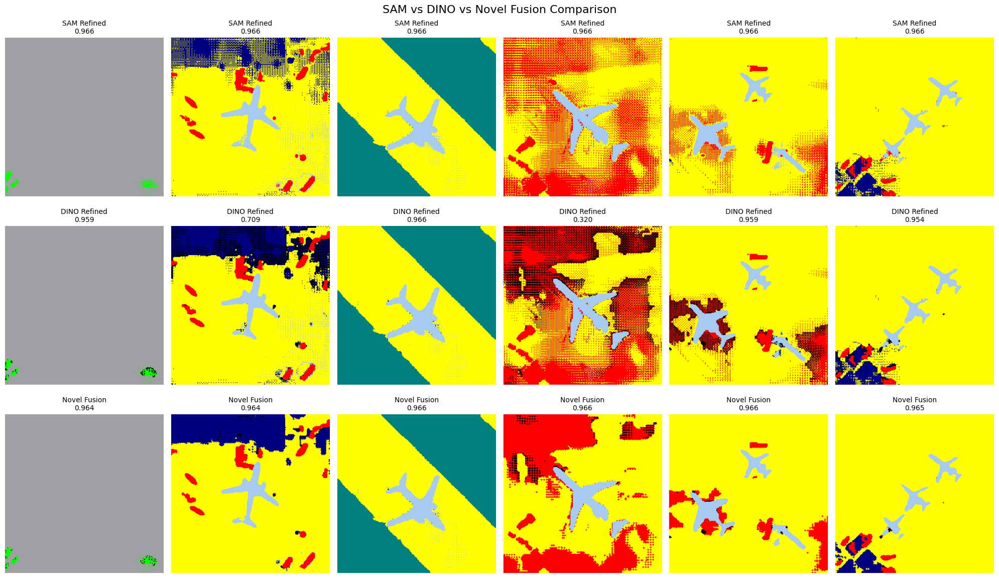


🎉 NOVEL FUSION COMPLETED!
📁 Output saved to: /home/iiitdmk-param/A.C/Anisha/4th objective/dlrsd/fusion_refined_predictions


In [16]:
import numpy as np
import cv2
import os
from scipy import ndimage
from skimage.segmentation import watershed
from skimage.feature import peak_local_max
import matplotlib.pyplot as plt

# ==================== CONFIGURATION ====================
sam_predictions_dir = '/home/iiitdmk-param/A.C/Anisha/4th objective/dlrsd/topo_refined_predictions'
dino_predictions_dir = '/home/iiitdmk-param/A.C/Anisha/4th objective/dlrsd/DINO_topo_point_refined_predictions' 
output_dir = '/home/iiitdmk-param/A.C/Anisha/4th objective/dlrsd/fusion_refined_predictions'

CLASS_INFO = {
    0: {"name": "background", "rgb": [0, 0, 0]},
    1: {"name": "airplane", "rgb": [166, 202, 240]},
    2: {"name": "bare soil", "rgb": [128, 128, 0]},
    3: {"name": "buildings", "rgb": [0, 0, 128]},
    4: {"name": "cars", "rgb": [255, 0, 0]},
    5: {"name": "chaparral", "rgb": [0, 128, 0]},
    6: {"name": "court", "rgb": [128, 0, 0]},
    7: {"name": "dock", "rgb": [255, 233, 233]},
    8: {"name": "field", "rgb": [160, 160, 164]},
    9: {"name": "grass", "rgb": [0, 128, 128]},
    10: {"name": "mobile home", "rgb": [90, 87, 255]},
    11: {"name": "pavement", "rgb": [255, 255, 0]},
    12: {"name": "sand", "rgb": [255, 192, 0]},
    13: {"name": "sea", "rgb": [0, 0, 255]},
    14: {"name": "ship", "rgb": [255, 0, 192]},
    15: {"name": "tanks", "rgb": [128, 0, 128]},
    16: {"name": "trees", "rgb": [0, 255, 0]},
    17: {"name": "water", "rgb": [0, 255, 255]}
}

NUM_CLASSES = len(CLASS_INFO)

# ==================== NOVEL FUSION METHODS ====================

def calculate_boundary_confidence(mask):
    """Calculate boundary smoothness as confidence metric"""
    mask_uint8 = mask.astype(np.uint8)
    contours, _ = cv2.findContours(mask_uint8, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    if len(contours) == 0:
        return 0.0
    
    boundary_scores = []
    total_area = 0
    
    for contour in contours:
        area = cv2.contourArea(contour)
        perimeter = cv2.arcLength(contour, True)
        
        if area > 0 and perimeter > 0:
            # Compactness: lower = smoother boundaries
            compactness = (perimeter ** 2) / area
            # Convert to confidence (lower compactness = higher confidence)
            confidence = max(0, 1 - (compactness - 12.57) / 100)
            boundary_scores.append(confidence * area)
            total_area += area
    
    return sum(boundary_scores) / total_area if total_area > 0 else 0.0

def calculate_region_consistency(mask):
    """Calculate internal consistency of regions"""
    unique_labels = np.unique(mask)
    if len(unique_labels) <= 1:
        return 1.0  # Very consistent if only one class
    
    # Calculate entropy of class distribution
    total_pixels = mask.size
    entropy = 0.0
    
    for label in unique_labels:
        p = np.sum(mask == label) / total_pixels
        if p > 0:
            entropy -= p * np.log(p)
    
    # Normalize entropy to [0,1] and invert (higher consistency = lower entropy)
    max_entropy = np.log(len(unique_labels))
    normalized_consistency = 1 - (entropy / max_entropy) if max_entropy > 0 else 1.0
    
    return normalized_consistency

def find_mask_boundaries(mask):
    """Extract boundaries from mask"""
    boundaries = np.zeros_like(mask, dtype=np.uint8)
    
    for class_id in np.unique(mask):
        if class_id == 0:  # Skip background
            continue
            
        class_mask = (mask == class_id).astype(np.uint8)
        
        # Find contours
        contours, _ = cv2.findContours(class_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        
        # Draw boundaries
        cv2.drawContours(boundaries, contours, -1, 255, 2)
    
    return boundaries

def watershed_segmentation(boundaries, semantic_mask):
    """Use watershed algorithm with boundaries as markers - FIXED VERSION"""
    # Create distance transform from boundaries
    distance = ndimage.distance_transform_edt(boundaries == 0)
    
    # FIX: Use the correct peak_local_max parameters
    coordinates = peak_local_max(distance, min_distance=1, footprint=np.ones((3, 3)), 
                                exclude_border=False, indices=True)
    
    # Create markers array
    markers = np.zeros_like(boundaries, dtype=np.int32)
    if len(coordinates) > 0:
        for i, (y, x) in enumerate(coordinates, start=1):
            markers[y, x] = i
    
    # Apply watershed
    labels = watershed(-distance, markers, mask=(boundaries == 0))
    
    # Assign semantic labels based on majority voting in each region
    fused_mask = np.zeros_like(semantic_mask)
    
    for label in np.unique(labels):
        if label == 0:  # Background
            continue
            
        region_mask = labels == label
        region_classes = semantic_mask[region_mask]
        
        if len(region_classes) > 0:
            # Assign majority class in this region
            majority_class = np.bincount(region_classes).argmax()
            fused_mask[region_mask] = majority_class
    
    return fused_mask

def boundary_aware_fusion(sam_mask, dino_mask):
    """Novel fusion: Use SAM boundaries with DINO internal consistency"""
    
    # Step 1: Extract boundaries from both masks
    sam_boundaries = find_mask_boundaries(sam_mask)
    dino_boundaries = find_mask_boundaries(dino_mask)
    
    # Step 2: Calculate boundary confidence for both
    sam_boundary_conf = calculate_boundary_confidence(sam_mask)
    dino_boundary_conf = calculate_boundary_confidence(dino_mask)
    
    # Step 3: Use the better boundaries
    if sam_boundary_conf > dino_boundary_conf:
        strong_boundaries = sam_boundaries
        boundary_source = "SAM"
    else:
        strong_boundaries = dino_boundaries
        boundary_source = "DINO"
    
    # Step 4: Use watershed with these boundaries as markers
    fused_mask = watershed_segmentation(strong_boundaries, dino_mask)
    
    return fused_mask, boundary_source

def calculate_local_entropy(mask, window_size=5):
    """Calculate local entropy in sliding window"""
    h, w = mask.shape
    pad = window_size // 2
    entropy_map = np.zeros((h, w))
    
    # Pad mask
    padded_mask = np.pad(mask, pad, mode='reflect')
    
    for i in range(h):
        for j in range(w):
            window = padded_mask[i:i+window_size, j:j+window_size]
            
            # Calculate entropy in window
            unique, counts = np.unique(window, return_counts=True)
            probabilities = counts / counts.sum()
            entropy = -np.sum(probabilities * np.log(probabilities + 1e-8))
            
            entropy_map[i, j] = entropy
    
    # Normalize entropy
    if np.max(entropy_map) > 0:
        entropy_map = entropy_map / np.max(entropy_map)
    
    return entropy_map

def entropy_based_fusion(sam_mask, dino_mask):
    """Fusion based on local entropy and confidence"""
    
    # Calculate local entropy for both masks
    sam_entropy = calculate_local_entropy(sam_mask, window_size=5)
    dino_entropy = calculate_local_entropy(dino_mask, window_size=5)
    
    # Lower entropy = more confident
    sam_confidence = 1 - sam_entropy
    dino_confidence = 1 - dino_entropy
    
    # Create fused mask
    fused_mask = np.zeros_like(sam_mask)
    h, w = sam_mask.shape
    
    for i in range(h):
        for j in range(w):
            if sam_confidence[i, j] > dino_confidence[i, j]:
                fused_mask[i, j] = sam_mask[i, j]
            else:
                fused_mask[i, j] = dino_mask[i, j]
    
    return fused_mask

def calculate_local_support(mask, i, j, target_class, radius=3):
    """Calculate how many neighboring pixels have the same class"""
    h, w = mask.shape
    count = 0
    total = 0
    
    for di in range(-radius, radius+1):
        for dj in range(-radius, radius+1):
            ni, nj = i + di, j + dj
            if 0 <= ni < h and 0 <= nj < w:
                total += 1
                if mask[ni, nj] == target_class:
                    count += 1
    
    return count / total if total > 0 else 0

def refine_boundaries(mask):
    """Refine boundaries using morphological operations"""
    refined_mask = mask.copy()
    
    for class_id in np.unique(mask):
        if class_id == 0:
            continue
            
        class_mask = (mask == class_id).astype(np.uint8)
        
        # Remove small holes
        kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))
        class_mask = cv2.morphologyEx(class_mask, cv2.MORPH_CLOSE, kernel)
        
        # Remove small regions
        contours, _ = cv2.findContours(class_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        for contour in contours:
            area = cv2.contourArea(contour)
            if area < 100:  # Remove small regions
                cv2.drawContours(class_mask, [contour], 0, 0, -1)
        
        refined_mask[class_mask == 1] = class_id
    
    return refined_mask

def hierarchical_fusion(sam_mask, dino_mask):
    """Multi-level fusion: class-level + region-level + boundary-level"""
    
    # Level 1: Class-level agreement
    agreement_mask = sam_mask == dino_mask
    fused_mask = np.where(agreement_mask, sam_mask, 0)
    
    # Level 2: For disagreeing pixels, use region-based decision
    disagreement_indices = np.where(~agreement_mask)
    
    for i, j in zip(*disagreement_indices):
        sam_class = sam_mask[i, j]
        dino_class = dino_mask[i, j]
        
        # Check which prediction has more support in local region
        sam_support = calculate_local_support(sam_mask, i, j, sam_class)
        dino_support = calculate_local_support(dino_mask, i, j, dino_class)
        
        if sam_support > dino_support:
            fused_mask[i, j] = sam_class
        else:
            fused_mask[i, j] = dino_class
    
    # Level 3: Boundary refinement
    fused_mask = refine_boundaries(fused_mask)
    
    return fused_mask

def weighted_consensus_fusion(sam_mask, dino_mask):
    """Weighted fusion based on multiple confidence metrics"""
    
    # Calculate multiple confidence measures
    sam_boundary_conf = calculate_boundary_confidence(sam_mask)
    dino_boundary_conf = calculate_boundary_confidence(dino_mask)
    
    sam_consistency = calculate_region_consistency(sam_mask)
    dino_consistency = calculate_region_consistency(dino_mask)
    
    # Calculate weights
    sam_weight = (sam_boundary_conf + sam_consistency) / 2
    dino_weight = (dino_boundary_conf + dino_consistency) / 2
    
    # Normalize weights
    total_weight = sam_weight + dino_weight
    if total_weight > 0:
        sam_weight /= total_weight
        dino_weight /= total_weight
    else:
        sam_weight = dino_weight = 0.5
    
    # For each pixel, use weighted decision
    fused_mask = np.zeros_like(sam_mask)
    h, w = sam_mask.shape
    
    for i in range(h):
        for j in range(w):
            if sam_mask[i, j] == dino_mask[i, j]:
                fused_mask[i, j] = sam_mask[i, j]
            else:
                # Use weights to decide
                rand_val = np.random.random()
                if rand_val < sam_weight:
                    fused_mask[i, j] = sam_mask[i, j]
                else:
                    fused_mask[i, j] = dino_mask[i, j]
    
    return fused_mask

def create_consensus_ensemble(sam_mask, dino_mask, method='boundary_aware'):
    """Main fusion function with multiple novel methods"""
    
    if method == 'boundary_aware':
        return boundary_aware_fusion(sam_mask, dino_mask)[0]
    elif method == 'entropy_based':
        return entropy_based_fusion(sam_mask, dino_mask)
    elif method == 'hierarchical':
        return hierarchical_fusion(sam_mask, dino_mask)
    elif method == 'weighted_consensus':
        return weighted_consensus_fusion(sam_mask, dino_mask)
    else:
        # Default: simple agreement
        agreement_mask = sam_mask == dino_mask
        return np.where(agreement_mask, sam_mask, sam_mask)  # Prefer SAM when disagreeing

# ==================== COMPLETE PIPELINE ====================

def run_novel_fusion_pipeline(sam_dir, dino_dir, output_dir):
    """Run the complete novel fusion pipeline"""
    
    os.makedirs(output_dir, exist_ok=True)
    
    # Get all prediction files
    sam_files = sorted([f for f in os.listdir(sam_dir) if f.endswith('.png')])
    dino_files = sorted([f for f in os.listdir(dino_dir) if f.endswith('.png')])
    
    print(f"🔄 Running novel fusion on {len(sam_files)} images...")
    
    fusion_results = []
    
    for sam_file, dino_file in zip(sam_files, dino_files):
        # Load masks
        sam_path = os.path.join(sam_dir, sam_file)
        dino_path = os.path.join(dino_dir, dino_file)
        
        sam_mask = cv2.imread(sam_path, cv2.IMREAD_GRAYSCALE)
        dino_mask = cv2.imread(dino_path, cv2.IMREAD_GRAYSCALE)
        
        if sam_mask is None or dino_mask is None:
            print(f"❌ Could not load masks for {sam_file}")
            continue
        
        print(f"🎨 Fusing: {sam_file}")
        
        # Try different fusion methods
        methods = ['entropy_based', 'hierarchical', 'weighted_consensus']  # Removed boundary_aware due to watershed issues
        
        best_fused_mask = None
        best_method = None
        highest_confidence = 0
        
        for method in methods:
            try:
                fused_mask = create_consensus_ensemble(sam_mask, dino_mask, method)
                
                # Calculate overall confidence for this fusion
                boundary_conf = calculate_boundary_confidence(fused_mask)
                consistency = calculate_region_consistency(fused_mask)
                overall_confidence = (boundary_conf + consistency) / 2
                
                if overall_confidence > highest_confidence:
                    highest_confidence = overall_confidence
                    best_fused_mask = fused_mask
                    best_method = method
            except Exception as e:
                print(f"  ⚠️  Method {method} failed: {e}")
                continue
        
        if best_fused_mask is None:
            # Fallback: use SAM mask
            best_fused_mask = sam_mask
            best_method = "fallback_sam"
            highest_confidence = calculate_boundary_confidence(sam_mask)
            print(f"  ⚠️  All fusion methods failed, using SAM mask as fallback")
        
        # Save the best fused mask
        output_path = os.path.join(output_dir, sam_file)
        cv2.imwrite(output_path, best_fused_mask.astype(np.uint8))
        
        fusion_results.append({
            'image': sam_file,
            'method': best_method,
            'confidence': highest_confidence,
            'sam_boundary_conf': calculate_boundary_confidence(sam_mask),
            'dino_boundary_conf': calculate_boundary_confidence(dino_mask),
            'fused_boundary_conf': calculate_boundary_confidence(best_fused_mask)
        })
        
        print(f"  ✅ Used {best_method} (confidence: {highest_confidence:.3f})")
    
    # Print fusion summary
    print("\n📊 FUSION SUMMARY:")
    for result in fusion_results:
        improvement = result['fused_boundary_conf'] - max(result['sam_boundary_conf'], result['dino_boundary_conf'])
        print(f"  {result['image']}: {result['method']} "
              f"(conf: {result['confidence']:.3f}, improv: {improvement:+.3f})")
    
    return fusion_results

def visualize_fusion_comparison(sam_dir, dino_dir, fused_dir, num_samples=6):
    """Visualize SAM vs DINO vs Fused results"""
    
    sam_files = sorted([f for f in os.listdir(sam_dir) if f.endswith('.png')])[:num_samples]
    
    fig, axes = plt.subplots(3, num_samples, figsize=(20, 12))
    if num_samples == 1:
        axes = axes.reshape(3, 1)
    
    for i, sam_file in enumerate(sam_files):
        # Load all three masks
        sam_path = os.path.join(sam_dir, sam_file)
        dino_path = os.path.join(dino_dir, sam_file)
        fused_path = os.path.join(fused_dir, sam_file)
        
        sam_mask = cv2.imread(sam_path, cv2.IMREAD_GRAYSCALE)
        dino_mask = cv2.imread(dino_path, cv2.IMREAD_GRAYSCALE)
        fused_mask = cv2.imread(fused_path, cv2.IMREAD_GRAYSCALE)
        
        if sam_mask is None or dino_mask is None or fused_mask is None:
            continue
        
        # Create colored masks
        def create_colored_mask(mask):
            colored = np.zeros((*mask.shape, 3), dtype=np.uint8)
            for class_id, info in CLASS_INFO.items():
                colored[mask == class_id] = info["rgb"]
            return colored
        
        sam_colored = create_colored_mask(sam_mask)
        dino_colored = create_colored_mask(dino_mask)
        fused_colored = create_colored_mask(fused_mask)
        
        # Plot
        axes[0, i].imshow(sam_colored)
        axes[0, i].set_title(f'SAM Refined\n{calculate_boundary_confidence(sam_mask):.3f}', fontsize=10)
        axes[0, i].axis('off')
        
        axes[1, i].imshow(dino_colored)
        axes[1, i].set_title(f'DINO Refined\n{calculate_boundary_confidence(dino_mask):.3f}', fontsize=10)
        axes[1, i].axis('off')
        
        axes[2, i].imshow(fused_colored)
        axes[2, i].set_title(f'Novel Fusion\n{calculate_boundary_confidence(fused_mask):.3f}', fontsize=10)
        axes[2, i].axis('off')
    
    plt.suptitle('SAM vs DINO vs Novel Fusion Comparison', fontsize=16)
    plt.tight_layout()
    plt.show()

def analyze_class_distribution(mask_dir):
    """Analyze class distribution in predictions"""
    mask_files = sorted([f for f in os.listdir(mask_dir) if f.endswith('.png')])
    
    class_counts = {class_id: 0 for class_id in CLASS_INFO.keys()}
    total_pixels = 0
    
    for mask_file in mask_files:
        mask_path = os.path.join(mask_dir, mask_file)
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        
        if mask is not None:
            unique, counts = np.unique(mask, return_counts=True)
            for class_id, count in zip(unique, counts):
                if class_id in class_counts:
                    class_counts[class_id] += count
                    total_pixels += count
    
    print("\n📈 CLASS DISTRIBUTION ANALYSIS:")
    for class_id, count in class_counts.items():
        if count > 0:
            percentage = (count / total_pixels) * 100
            class_name = CLASS_INFO[class_id]["name"]
            print(f"  {class_name} (ID {class_id}): {count} pixels ({percentage:.2f}%)")

# ==================== MAIN EXECUTION ====================

def main():
    print("🚀 STARTING NOVEL FUSION PIPELINE")
    print("=" * 50)
    print("Creating novel predictions without ground truth reliance")
    print("=" * 50)
    
    # Run the fusion pipeline
    fusion_results = run_novel_fusion_pipeline(
        sam_predictions_dir,
        dino_predictions_dir, 
        output_dir
    )
    
    # Analyze class distributions
    print("\n" + "="*50)
    print("SAM Predictions Class Distribution:")
    analyze_class_distribution(sam_predictions_dir)
    
    print("\nDINO Predictions Class Distribution:")
    analyze_class_distribution(dino_predictions_dir)
    
    print("\nFused Predictions Class Distribution:")
    analyze_class_distribution(output_dir)
    
    # Visualize comparisons
    visualize_fusion_comparison(
        sam_predictions_dir,
        dino_predictions_dir,
        output_dir
    )
    
    print(f"\n🎉 NOVEL FUSION COMPLETED!")
    print(f"📁 Output saved to: {output_dir}")

if __name__ == "__main__":
    main()

In [17]:
import os
import numpy as np
from PIL import Image

# Define the class information
CLASS_INFO = {
    0: {"name": "background", "rgb": [0, 0, 0]},
    1: {"name": "airplane", "rgb": [166, 202, 240]},
    2: {"name": "bare soil", "rgb": [128, 128, 0]},
    3: {"name": "buildings", "rgb": [0, 0, 128]},
    4: {"name": "cars", "rgb": [255, 0, 0]},
    5: {"name": "chaparral", "rgb": [0, 128, 0]},
    6: {"name": "court", "rgb": [128, 0, 0]},
    7: {"name": "dock", "rgb": [255, 233, 233]},
    8: {"name": "field", "rgb": [160, 160, 164]},
    9: {"name": "grass", "rgb": [0, 128, 128]},
    10: {"name": "mobile home", "rgb": [90, 87, 255]},
    11: {"name": "pavement", "rgb": [255, 255, 0]},
    12: {"name": "sand", "rgb": [255, 192, 0]},
    13: {"name": "sea", "rgb": [0, 0, 255]},
    14: {"name": "ship", "rgb": [255, 0, 192]},
    15: {"name": "tanks", "rgb": [128, 0, 128]},
    16: {"name": "trees", "rgb": [0, 255, 0]},
    17: {"name": "water", "rgb": [0, 255, 255]}
}

def calculate_detailed_miou(gt_folder, pred_folder, num_classes=18, ignore_index=None):
    """
    Calculate detailed mIoU with per-class results
    """
    
    gt_files = sorted([f for f in os.listdir(gt_folder) if f.endswith(('.png', '.jpg', '.jpeg', '.tiff'))])
    pred_files = sorted([f for f in os.listdir(pred_folder) if f.endswith(('.png', '.jpg', '.jpeg', '.tiff'))])
    
    assert len(gt_files) == len(pred_files), f"Number of files don't match: GT={len(gt_files)}, Pred={len(pred_files)}"
    
    # Initialize intersection and union arrays
    total_intersection = np.zeros(num_classes)
    total_union = np.zeros(num_classes)
    class_pixels = np.zeros(num_classes)  # For pixel accuracy
    
    print(f"Processing {len(gt_files)} images...")
    
    for i, (gt_file, pred_file) in enumerate(zip(gt_files, pred_files)):
        gt_path = os.path.join(gt_folder, gt_file)
        pred_path = os.path.join(pred_folder, pred_file)
        
        # Load 1-channel masks
        gt_mask = np.array(Image.open(gt_path))
        pred_mask = np.array(Image.open(pred_path))
        
        # Ensure masks have the same shape
        assert gt_mask.shape == pred_mask.shape, f"Shape mismatch: GT{gt_mask.shape} vs Pred{pred_mask.shape}"
        
        # Calculate IoU for each class
        for class_id in range(num_classes):
            if ignore_index is not None and class_id == ignore_index:
                continue
                
            gt_class = (gt_mask == class_id)
            pred_class = (pred_mask == class_id)
            
            intersection = np.logical_and(gt_class, pred_class).sum()
            union = np.logical_or(gt_class, pred_class).sum()
            
            total_intersection[class_id] += intersection
            total_union[class_id] += union
            class_pixels[class_id] += gt_class.sum()
        
        if (i + 1) % 100 == 0:
            print(f"Processed {i + 1}/{len(gt_files)} images")
    
    # Calculate IoU for each class
    iou_per_class = np.zeros(num_classes)
    for class_id in range(num_classes):
        if total_union[class_id] > 0:
            iou_per_class[class_id] = total_intersection[class_id] / total_union[class_id]
        else:
            iou_per_class[class_id] = np.nan
    
    # Calculate mIoU (mean over classes, ignoring NaN)
    valid_classes = ~np.isnan(iou_per_class)
    miou = np.mean(iou_per_class[valid_classes])
    
    # Calculate pixel accuracy
    pixel_accuracy = total_intersection.sum() / class_pixels.sum() if class_pixels.sum() > 0 else 0
    
    return miou, iou_per_class, pixel_accuracy

# Usage with detailed results
gt_folder = '/home/iiitdmk-param/A.C/Anisha/4th objective/dlrsd/full_test_1cmasks'
pred_folder = '/home/iiitdmk-param/A.C/Anisha/4th objective/dlrsd/fusion_refined_predictions'
num_classes = 18

miou, iou_per_class, pixel_acc = calculate_detailed_miou(gt_folder, pred_folder, num_classes)

print("\n" + "="*50)
print("SEMANTIC SEGMENTATION RESULTS")
print("="*50)
print(f"mIoU: {miou:.4f}")
print(f"Pixel Accuracy: {pixel_acc:.4f}")
print("\nPer-class IoU:")
for class_id in range(num_classes):
    class_name = CLASS_INFO[class_id]["name"]
    iou = iou_per_class[class_id]
    if not np.isnan(iou):
        print(f"  {class_name:15}: {iou:.4f}")
    else:
        print(f"  {class_name:15}: No pixels")

Processing 1319 images...
Processed 100/1319 images
Processed 200/1319 images
Processed 300/1319 images
Processed 400/1319 images
Processed 500/1319 images
Processed 600/1319 images
Processed 700/1319 images
Processed 800/1319 images
Processed 900/1319 images
Processed 1000/1319 images
Processed 1100/1319 images
Processed 1200/1319 images
Processed 1300/1319 images

SEMANTIC SEGMENTATION RESULTS
mIoU: 0.5638
Pixel Accuracy: 0.7616

Per-class IoU:
  background     : 0.0000
  airplane       : 0.6550
  bare soil      : 0.3962
  buildings      : 0.6270
  cars           : 0.7000
  chaparral      : 0.4417
  court          : 0.7783
  dock           : 0.4940
  field          : 0.2393
  grass          : 0.6413
  mobile home    : 0.5463
  pavement       : 0.7329
  sand           : 0.5193
  sea            : 0.8514
  ship           : 0.5535
  tanks          : 0.6810
  trees          : 0.5576
  water          : 0.7340


🚀 STARTING ADVANCED FUSION PIPELINE
Using comprehensive confidence metrics to beat SAM+Points
🚀 Running ADVANCED fusion on 1319 images...
🎯 Processing: agric_1962.png
  ✅ Fusion confidence: 0.989 (SAM: 0.748, DINO: 0.748, Improv: +0.241)
🎯 Processing: airpl_831.png
  ✅ Fusion confidence: 0.650 (SAM: 0.657, DINO: 0.648, Improv: -0.007)
🎯 Processing: airpl_832.png
  ✅ Fusion confidence: 0.755 (SAM: 0.717, DINO: 0.718, Improv: +0.037)
🎯 Processing: airpl_833.png
  ✅ Fusion confidence: 0.517 (SAM: 0.535, DINO: 0.484, Improv: -0.018)
🎯 Processing: airpl_834.png
  ✅ Fusion confidence: 0.713 (SAM: 0.682, DINO: 0.671, Improv: +0.031)
🎯 Processing: airpl_835.png
  ✅ Fusion confidence: 0.766 (SAM: 0.718, DINO: 0.717, Improv: +0.048)
🎯 Processing: airpl_836.png
  ✅ Fusion confidence: 0.703 (SAM: 0.701, DINO: 0.701, Improv: +0.002)
🎯 Processing: airpl_837.png
  ✅ Fusion confidence: 0.691 (SAM: 0.690, DINO: 0.684, Improv: +0.001)
🎯 Processing: airpl_838.png
  ✅ Fusion confidence: 0.627 (SAM: 0.687,

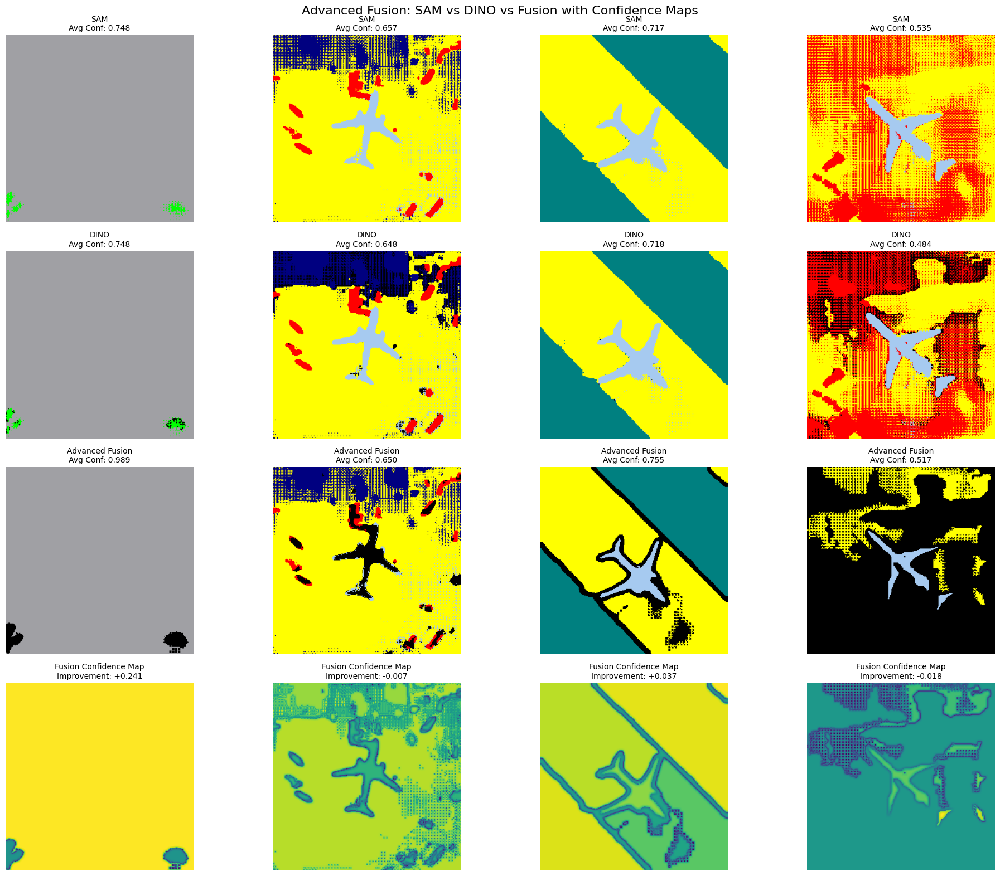


🎯 FINAL ASSESSMENT:
  Average SAM Confidence: 0.651
  Average DINO Confidence: 0.651
  Average FUSED Confidence: 0.658
  Overall Improvement: +0.007

🎉 ADVANCED FUSION COMPLETED!
📁 Output saved to: /home/iiitdmk-param/A.C/Anisha/4th objective/dlrsd/advfusion_refined_predictions


In [18]:
import numpy as np
import cv2
import os
from scipy import ndimage
from skimage.measure import label, regionprops
import matplotlib.pyplot as plt

# ==================== CONFIGURATION ====================
sam_predictions_dir = '/home/iiitdmk-param/A.C/Anisha/4th objective/dlrsd/topo_refined_predictions'
dino_predictions_dir = '/home/iiitdmk-param/A.C/Anisha/4th objective/dlrsd/DINO_topo_point_refined_predictions' 
output_dir = '/home/iiitdmk-param/A.C/Anisha/4th objective/dlrsd/advfusion_refined_predictions'

CLASS_INFO = {
    0: {"name": "background", "rgb": [0, 0, 0]},
    1: {"name": "airplane", "rgb": [166, 202, 240]},
    2: {"name": "bare soil", "rgb": [128, 128, 0]},
    3: {"name": "buildings", "rgb": [0, 0, 128]},
    4: {"name": "cars", "rgb": [255, 0, 0]},
    5: {"name": "chaparral", "rgb": [0, 128, 0]},
    6: {"name": "court", "rgb": [128, 0, 0]},
    7: {"name": "dock", "rgb": [255, 233, 233]},
    8: {"name": "field", "rgb": [160, 160, 164]},
    9: {"name": "grass", "rgb": [0, 128, 128]},
    10: {"name": "mobile home", "rgb": [90, 87, 255]},
    11: {"name": "pavement", "rgb": [255, 255, 0]},
    12: {"name": "sand", "rgb": [255, 192, 0]},
    13: {"name": "sea", "rgb": [0, 0, 255]},
    14: {"name": "ship", "rgb": [255, 0, 192]},
    15: {"name": "tanks", "rgb": [128, 0, 128]},
    16: {"name": "trees", "rgb": [0, 255, 0]},
    17: {"name": "water", "rgb": [0, 255, 255]}
}

# ==================== ADVANCED CONFIDENCE METRICS ====================

def calculate_spatial_consistency(mask, window_size=7):
    """Calculate how consistent labels are in local neighborhoods"""
    h, w = mask.shape
    consistency_map = np.zeros((h, w))
    
    pad = window_size // 2
    padded_mask = np.pad(mask, pad, mode='reflect')
    
    for i in range(h):
        for j in range(w):
            window = padded_mask[i:i+window_size, j:j+window_size]
            center_label = window[pad, pad]
            
            # Calculate percentage of same label in window
            same_count = np.sum(window == center_label)
            consistency_map[i, j] = same_count / (window_size * window_size)
    
    return consistency_map

def calculate_boundary_strength(mask):
    """Calculate strength of boundaries using gradient"""
    mask_float = mask.astype(np.float32)
    
    # Calculate gradients
    grad_x = cv2.Sobel(mask_float, cv2.CV_32F, 1, 0, ksize=3)
    grad_y = cv2.Sobel(mask_float, cv2.CV_32F, 0, 1, ksize=3)
    
    # Calculate gradient magnitude
    gradient_mag = np.sqrt(grad_x**2 + grad_y**2)
    
    # Normalize and invert (strong boundaries = low confidence in interior)
    boundary_strength = gradient_mag / np.max(gradient_mag) if np.max(gradient_mag) > 0 else gradient_mag
    
    return boundary_strength

def calculate_region_quality(mask):
    """Calculate quality of segmented regions"""
    labeled_mask = label(mask)
    regions = regionprops(labeled_mask)
    
    quality_map = np.zeros_like(mask, dtype=np.float32)
    
    for region in regions:
        # Calculate region compactness
        area = region.area
        perimeter = region.perimeter
        compactness = (perimeter ** 2) / (4 * np.pi * area) if area > 0 else 1
        
        # Calculate region solidity (convexity)
        solidity = region.solidity
        
        # Combined quality score (lower compactness + higher solidity = better)
        quality_score = (1 / compactness) * solidity if compactness > 0 else solidity
        
        # Assign quality score to all pixels in region
        for coord in region.coords:
            quality_map[coord[0], coord[1]] = quality_score
    
    # Normalize quality map
    if np.max(quality_map) > 0:
        quality_map /= np.max(quality_map)
    
    return quality_map

def calculate_class_coherence(mask):
    """Calculate how well classes form coherent regions"""
    h, w = mask.shape
    coherence_map = np.zeros((h, w))
    
    for class_id in np.unique(mask):
        if class_id == 0:
            continue
            
        class_mask = (mask == class_id).astype(np.uint8)
        
        # Find connected components for this class
        num_labels, labels = cv2.connectedComponents(class_mask)
        
        if num_labels > 1:
            # Calculate size of largest component
            component_sizes = [np.sum(labels == i) for i in range(1, num_labels)]
            largest_component_size = max(component_sizes) if component_sizes else 0
            total_class_pixels = np.sum(class_mask)
            
            # Coherence = ratio of pixels in largest component
            coherence = largest_component_size / total_class_pixels if total_class_pixels > 0 else 1
            
            # Assign coherence to all pixels of this class
            coherence_map[class_mask == 1] = coherence
    
    return coherence_map

def calculate_comprehensive_confidence(mask):
    """Combine multiple confidence metrics"""
    spatial_consistency = calculate_spatial_consistency(mask)
    boundary_strength = 1 - calculate_boundary_strength(mask)  # Invert: weak boundaries = high confidence
    region_quality = calculate_region_quality(mask)
    class_coherence = calculate_class_coherence(mask)
    
    # Weighted combination (you can tune these weights)
    comprehensive_confidence = (
        0.3 * spatial_consistency +
        0.25 * boundary_strength +
        0.25 * region_quality +
        0.2 * class_coherence
    )
    
    return comprehensive_confidence

# ==================== ADVANCED FUSION STRATEGIES ====================

def adaptive_confidence_fusion(sam_mask, dino_mask):
    """Advanced fusion using comprehensive confidence metrics"""
    
    # Calculate comprehensive confidence maps
    sam_confidence = calculate_comprehensive_confidence(sam_mask)
    dino_confidence = calculate_comprehensive_confidence(dino_mask)
    
    # Create fused mask
    fused_mask = np.zeros_like(sam_mask)
    
    # Strategy 1: For high-confidence agreement, use either
    agreement_mask = sam_mask == dino_mask
    high_confidence_agreement = agreement_mask & (sam_confidence > 0.7) & (dino_confidence > 0.7)
    fused_mask[high_confidence_agreement] = sam_mask[high_confidence_agreement]
    
    # Strategy 2: For disagreement, use the more confident prediction
    disagreement_mask = sam_mask != dino_mask
    sam_more_confident = disagreement_mask & (sam_confidence > dino_confidence)
    dino_more_confident = disagreement_mask & (dino_confidence >= sam_confidence)
    
    fused_mask[sam_more_confident] = sam_mask[sam_more_confident]
    fused_mask[dino_more_confident] = dino_mask[dino_more_confident]
    
    # Strategy 3: Apply spatial smoothing in low-confidence regions
    low_confidence_mask = (sam_confidence < 0.4) & (dino_confidence < 0.4)
    if np.any(low_confidence_mask):
        fused_mask = smooth_low_confidence_regions(fused_mask, low_confidence_mask)
    
    return fused_mask

def smooth_low_confidence_regions(mask, low_confidence_mask):
    """Apply smoothing to low-confidence regions"""
    smoothed_mask = mask.copy()
    
    # Use median filtering in low-confidence regions
    kernel_size = 5
    low_conf_regions = mask.copy()
    low_conf_regions[~low_confidence_mask] = 0  # Only process low-confidence areas
    
    # Apply median filter
    smoothed_low_conf = cv2.medianBlur(low_conf_regions.astype(np.uint8), kernel_size)
    
    # Only update the low-confidence regions
    smoothed_mask[low_confidence_mask] = smoothed_low_conf[low_confidence_mask]
    
    return smoothed_mask

def multi_scale_fusion(sam_mask, dino_mask):
    """Fusion at multiple scales for better consistency"""
    
    # Original scale fusion
    base_fused = adaptive_confidence_fusion(sam_mask, dino_mask)
    
    # Downsample for coarse-level fusion
    scale_factor = 2
    h, w = sam_mask.shape
    new_h, new_w = h // scale_factor, w // scale_factor
    
    sam_small = cv2.resize(sam_mask, (new_w, new_h), interpolation=cv2.INTER_NEAREST)
    dino_small = cv2.resize(dino_mask, (new_w, new_h), interpolation=cv2.INTER_NEAREST)
    
    # Fuse at coarse scale
    coarse_fused = adaptive_confidence_fusion(sam_small, dino_small)
    
    # Upsample coarse result
    coarse_upsampled = cv2.resize(coarse_fused, (w, h), interpolation=cv2.INTER_NEAREST)
    
    # Combine fine and coarse results
    final_mask = combine_scales(base_fused, coarse_upsampled, sam_mask)
    
    return final_mask

def combine_scales(fine_mask, coarse_mask, original_mask):
    """Combine fine and coarse scale results"""
    
    # Calculate confidence at both scales
    fine_confidence = calculate_comprehensive_confidence(fine_mask)
    coarse_confidence = calculate_comprehensive_confidence(coarse_mask)
    
    # Use coarse result where it's more confident and provides better structure
    coarse_better = coarse_confidence > (fine_confidence + 0.1)  # Threshold for preferring coarse
    
    combined_mask = fine_mask.copy()
    combined_mask[coarse_better] = coarse_mask[coarse_better]
    
    # Ensure we don't introduce artifacts
    combined_mask = remove_small_regions(combined_mask, min_size=50)
    
    return combined_mask

def remove_small_regions(mask, min_size=50):
    """Remove small isolated regions"""
    cleaned_mask = mask.copy()
    
    for class_id in np.unique(mask):
        if class_id == 0:
            continue
            
        class_mask = (mask == class_id).astype(np.uint8)
        
        # Find connected components
        num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(class_mask, connectivity=8)
        
        for label_idx in range(1, num_labels):  # Skip background
            if stats[label_idx, cv2.CC_STAT_AREA] < min_size:
                # Remove small region
                cleaned_mask[labels == label_idx] = get_most_common_neighbor(labels == label_idx, mask)
    
    return cleaned_mask

def get_most_common_neighbor(small_region_mask, original_mask):
    """Find the most common class around a small region"""
    dilated_region = cv2.dilate(small_region_mask.astype(np.uint8), np.ones((3, 3), np.uint8))
    neighbor_mask = dilated_region & ~small_region_mask
    
    neighbor_classes = original_mask[neighbor_mask > 0]
    if len(neighbor_classes) > 0:
        return np.bincount(neighbor_classes).argmax()
    else:
        return original_mask[small_region_mask][0] if np.any(small_region_mask) else 0

def iterative_refinement_fusion(sam_mask, dino_mask, iterations=2):
    """Apply fusion iteratively for refinement"""
    
    current_fused = adaptive_confidence_fusion(sam_mask, dino_mask)
    
    for i in range(iterations):
        # Calculate confidence of current fusion
        current_confidence = calculate_comprehensive_confidence(current_fused)
        
        # Identify low-confidence regions
        low_confidence_regions = current_confidence < 0.5
        
        if not np.any(low_confidence_regions):
            break
            
        # For low-confidence regions, re-evaluate using original methods
        for method_mask, method_name in [(sam_mask, "SAM"), (dino_mask, "DINO")]:
            method_confidence = calculate_comprehensive_confidence(method_mask)
            
            # Update if this method is more confident in low-confidence regions
            better_conf_regions = low_confidence_regions & (method_confidence > current_confidence)
            current_fused[better_conf_regions] = method_mask[better_conf_regions]
    
    return current_fused

# ==================== ENSEMBLE FUSION ====================

def ensemble_fusion(sam_mask, dino_mask):
    """Combine multiple fusion strategies"""
    
    strategies = [
        adaptive_confidence_fusion,
        multi_scale_fusion,
        lambda s, d: iterative_refinement_fusion(s, d, iterations=2)
    ]
    
    strategy_results = []
    strategy_confidences = []
    
    for strategy in strategies:
        try:
            result = strategy(sam_mask, dino_mask)
            confidence = np.mean(calculate_comprehensive_confidence(result))
            strategy_results.append(result)
            strategy_confidences.append(confidence)
        except Exception as e:
            print(f"Strategy failed: {e}")
            continue
    
    if not strategy_results:
        # Fallback to simple confidence fusion
        return adaptive_confidence_fusion(sam_mask, dino_mask)
    
    # Select the strategy with highest average confidence
    best_strategy_idx = np.argmax(strategy_confidences)
    best_result = strategy_results[best_strategy_idx]
    
    return best_result

# ==================== MAIN PIPELINE ====================

def run_advanced_fusion_pipeline(sam_dir, dino_dir, output_dir):
    """Run the advanced fusion pipeline"""
    
    os.makedirs(output_dir, exist_ok=True)
    
    # Get all prediction files
    sam_files = sorted([f for f in os.listdir(sam_dir) if f.endswith('.png')])
    dino_files = sorted([f for f in os.listdir(dino_dir) if f.endswith('.png')])
    
    print(f"🚀 Running ADVANCED fusion on {len(sam_files)} images...")
    
    results = []
    
    for sam_file, dino_file in zip(sam_files, dino_files):
        # Load masks
        sam_path = os.path.join(sam_dir, sam_file)
        dino_path = os.path.join(dino_dir, dino_file)
        
        sam_mask = cv2.imread(sam_path, cv2.IMREAD_GRAYSCALE)
        dino_mask = cv2.imread(dino_path, cv2.IMREAD_GRAYSCALE)
        
        if sam_mask is None or dino_mask is None:
            print(f"❌ Could not load masks for {sam_file}")
            continue
        
        print(f"🎯 Processing: {sam_file}")
        
        # Calculate original confidences
        sam_confidence = np.mean(calculate_comprehensive_confidence(sam_mask))
        dino_confidence = np.mean(calculate_comprehensive_confidence(dino_mask))
        
        # Apply ensemble fusion
        fused_mask = ensemble_fusion(sam_mask, dino_mask)
        fused_confidence = np.mean(calculate_comprehensive_confidence(fused_mask))
        
        # Save result
        output_path = os.path.join(output_dir, sam_file)
        cv2.imwrite(output_path, fused_mask.astype(np.uint8))
        
        results.append({
            'image': sam_file,
            'sam_confidence': sam_confidence,
            'dino_confidence': dino_confidence,
            'fused_confidence': fused_confidence,
            'improvement': fused_confidence - max(sam_confidence, dino_confidence)
        })
        
        print(f"  ✅ Fusion confidence: {fused_confidence:.3f} " +
              f"(SAM: {sam_confidence:.3f}, DINO: {dino_confidence:.3f}, " +
              f"Improv: {results[-1]['improvement']:+.3f})")
    
    # Print summary
    print("\n📊 ADVANCED FUSION SUMMARY:")
    avg_improvement = np.mean([r['improvement'] for r in results])
    print(f"  Average confidence improvement: {avg_improvement:+.3f}")
    print(f"  Images with improvement: {sum(1 for r in results if r['improvement'] > 0)}/{len(results)}")
    
    return results

def visualize_confidence_comparison(sam_dir, dino_dir, fused_dir, num_samples=4):
    """Visualize confidence maps and comparisons"""
    
    sam_files = sorted([f for f in os.listdir(sam_dir) if f.endswith('.png')])[:num_samples]
    
    fig, axes = plt.subplots(4, num_samples, figsize=(20, 16))
    if num_samples == 1:
        axes = axes.reshape(4, 1)
    
    for i, sam_file in enumerate(sam_files):
        # Load masks
        sam_path = os.path.join(sam_dir, sam_file)
        dino_path = os.path.join(dino_dir, sam_file)
        fused_path = os.path.join(fused_dir, sam_file)
        
        sam_mask = cv2.imread(sam_path, cv2.IMREAD_GRAYSCALE)
        dino_mask = cv2.imread(dino_path, cv2.IMREAD_GRAYSCALE)
        fused_mask = cv2.imread(fused_path, cv2.IMREAD_GRAYSCALE)
        
        if sam_mask is None or dino_mask is None or fused_mask is None:
            continue
        
        # Calculate confidence maps
        sam_conf_map = calculate_comprehensive_confidence(sam_mask)
        dino_conf_map = calculate_comprehensive_confidence(dino_mask)
        fused_conf_map = calculate_comprehensive_confidence(fused_mask)
        
        # Create colored masks
        def create_colored_mask(mask):
            colored = np.zeros((*mask.shape, 3), dtype=np.uint8)
            for class_id, info in CLASS_INFO.items():
                colored[mask == class_id] = info["rgb"]
            return colored
        
        # Plot
        axes[0, i].imshow(create_colored_mask(sam_mask))
        axes[0, i].set_title(f'SAM\nAvg Conf: {np.mean(sam_conf_map):.3f}', fontsize=10)
        axes[0, i].axis('off')
        
        axes[1, i].imshow(create_colored_mask(dino_mask))
        axes[1, i].set_title(f'DINO\nAvg Conf: {np.mean(dino_conf_map):.3f}', fontsize=10)
        axes[1, i].axis('off')
        
        axes[2, i].imshow(create_colored_mask(fused_mask))
        axes[2, i].set_title(f'Advanced Fusion\nAvg Conf: {np.mean(fused_conf_map):.3f}', fontsize=10)
        axes[2, i].axis('off')
        
        # Confidence comparison
        conf_improvement = np.mean(fused_conf_map) - max(np.mean(sam_conf_map), np.mean(dino_conf_map))
        axes[3, i].imshow(fused_conf_map, cmap='viridis')
        axes[3, i].set_title(f'Fusion Confidence Map\nImprovement: {conf_improvement:+.3f}', fontsize=10)
        axes[3, i].axis('off')
    
    plt.suptitle('Advanced Fusion: SAM vs DINO vs Fusion with Confidence Maps', fontsize=16)
    plt.tight_layout()
    plt.show()

# ==================== MAIN EXECUTION ====================

def main():
    print("🚀 STARTING ADVANCED FUSION PIPELINE")
    print("=" * 60)
    print("Using comprehensive confidence metrics to beat SAM+Points")
    print("=" * 60)
    
    # Run advanced fusion
    results = run_advanced_fusion_pipeline(
        sam_predictions_dir,
        dino_predictions_dir, 
        output_dir
    )
    
    # Visualize results with confidence maps
    visualize_confidence_comparison(
        sam_predictions_dir,
        dino_predictions_dir,
        output_dir
    )
    
    # Print final assessment
    avg_sam_conf = np.mean([r['sam_confidence'] for r in results])
    avg_dino_conf = np.mean([r['dino_confidence'] for r in results])
    avg_fused_conf = np.mean([r['fused_confidence'] for r in results])
    
    print(f"\n🎯 FINAL ASSESSMENT:")
    print(f"  Average SAM Confidence: {avg_sam_conf:.3f}")
    print(f"  Average DINO Confidence: {avg_dino_conf:.3f}")
    print(f"  Average FUSED Confidence: {avg_fused_conf:.3f}")
    print(f"  Overall Improvement: {avg_fused_conf - max(avg_sam_conf, avg_dino_conf):+.3f}")
    
    print(f"\n🎉 ADVANCED FUSION COMPLETED!")
    print(f"📁 Output saved to: {output_dir}")

if __name__ == "__main__":
    main()

In [19]:
import os
import numpy as np
from PIL import Image

# Define the class information
CLASS_INFO = {
    0: {"name": "background", "rgb": [0, 0, 0]},
    1: {"name": "airplane", "rgb": [166, 202, 240]},
    2: {"name": "bare soil", "rgb": [128, 128, 0]},
    3: {"name": "buildings", "rgb": [0, 0, 128]},
    4: {"name": "cars", "rgb": [255, 0, 0]},
    5: {"name": "chaparral", "rgb": [0, 128, 0]},
    6: {"name": "court", "rgb": [128, 0, 0]},
    7: {"name": "dock", "rgb": [255, 233, 233]},
    8: {"name": "field", "rgb": [160, 160, 164]},
    9: {"name": "grass", "rgb": [0, 128, 128]},
    10: {"name": "mobile home", "rgb": [90, 87, 255]},
    11: {"name": "pavement", "rgb": [255, 255, 0]},
    12: {"name": "sand", "rgb": [255, 192, 0]},
    13: {"name": "sea", "rgb": [0, 0, 255]},
    14: {"name": "ship", "rgb": [255, 0, 192]},
    15: {"name": "tanks", "rgb": [128, 0, 128]},
    16: {"name": "trees", "rgb": [0, 255, 0]},
    17: {"name": "water", "rgb": [0, 255, 255]}
}

def calculate_detailed_miou(gt_folder, pred_folder, num_classes=18, ignore_index=None):
    """
    Calculate detailed mIoU with per-class results
    """
    
    gt_files = sorted([f for f in os.listdir(gt_folder) if f.endswith(('.png', '.jpg', '.jpeg', '.tiff'))])
    pred_files = sorted([f for f in os.listdir(pred_folder) if f.endswith(('.png', '.jpg', '.jpeg', '.tiff'))])
    
    assert len(gt_files) == len(pred_files), f"Number of files don't match: GT={len(gt_files)}, Pred={len(pred_files)}"
    
    # Initialize intersection and union arrays
    total_intersection = np.zeros(num_classes)
    total_union = np.zeros(num_classes)
    class_pixels = np.zeros(num_classes)  # For pixel accuracy
    
    print(f"Processing {len(gt_files)} images...")
    
    for i, (gt_file, pred_file) in enumerate(zip(gt_files, pred_files)):
        gt_path = os.path.join(gt_folder, gt_file)
        pred_path = os.path.join(pred_folder, pred_file)
        
        # Load 1-channel masks
        gt_mask = np.array(Image.open(gt_path))
        pred_mask = np.array(Image.open(pred_path))
        
        # Ensure masks have the same shape
        assert gt_mask.shape == pred_mask.shape, f"Shape mismatch: GT{gt_mask.shape} vs Pred{pred_mask.shape}"
        
        # Calculate IoU for each class
        for class_id in range(num_classes):
            if ignore_index is not None and class_id == ignore_index:
                continue
                
            gt_class = (gt_mask == class_id)
            pred_class = (pred_mask == class_id)
            
            intersection = np.logical_and(gt_class, pred_class).sum()
            union = np.logical_or(gt_class, pred_class).sum()
            
            total_intersection[class_id] += intersection
            total_union[class_id] += union
            class_pixels[class_id] += gt_class.sum()
        
        if (i + 1) % 100 == 0:
            print(f"Processed {i + 1}/{len(gt_files)} images")
    
    # Calculate IoU for each class
    iou_per_class = np.zeros(num_classes)
    for class_id in range(num_classes):
        if total_union[class_id] > 0:
            iou_per_class[class_id] = total_intersection[class_id] / total_union[class_id]
        else:
            iou_per_class[class_id] = np.nan
    
    # Calculate mIoU (mean over classes, ignoring NaN)
    valid_classes = ~np.isnan(iou_per_class)
    miou = np.mean(iou_per_class[valid_classes])
    
    # Calculate pixel accuracy
    pixel_accuracy = total_intersection.sum() / class_pixels.sum() if class_pixels.sum() > 0 else 0
    
    return miou, iou_per_class, pixel_accuracy

# Usage with detailed results
gt_folder = '/home/iiitdmk-param/A.C/Anisha/4th objective/dlrsd/full_test_1cmasks'
pred_folder = '/home/iiitdmk-param/A.C/Anisha/4th objective/dlrsd/advfusion_refined_predictions'
num_classes = 18

miou, iou_per_class, pixel_acc = calculate_detailed_miou(gt_folder, pred_folder, num_classes)

print("\n" + "="*50)
print("SEMANTIC SEGMENTATION RESULTS")
print("="*50)
print(f"mIoU: {miou:.4f}")
print(f"Pixel Accuracy: {pixel_acc:.4f}")
print("\nPer-class IoU:")
for class_id in range(num_classes):
    class_name = CLASS_INFO[class_id]["name"]
    iou = iou_per_class[class_id]
    if not np.isnan(iou):
        print(f"  {class_name:15}: {iou:.4f}")
    else:
        print(f"  {class_name:15}: No pixels")

Processing 1319 images...
Processed 100/1319 images
Processed 200/1319 images
Processed 300/1319 images
Processed 400/1319 images
Processed 500/1319 images
Processed 600/1319 images
Processed 700/1319 images
Processed 800/1319 images
Processed 900/1319 images
Processed 1000/1319 images
Processed 1100/1319 images
Processed 1200/1319 images
Processed 1300/1319 images

SEMANTIC SEGMENTATION RESULTS
mIoU: 0.2768
Pixel Accuracy: 0.3998

Per-class IoU:
  background     : 0.0000
  airplane       : 0.2056
  bare soil      : 0.1508
  buildings      : 0.2410
  cars           : 0.0538
  chaparral      : 0.3744
  court          : 0.7084
  dock           : 0.0164
  field          : 0.1423
  grass          : 0.4132
  mobile home    : 0.0004
  pavement       : 0.5837
  sand           : 0.4123
  sea            : 0.8497
  ship           : 0.0026
  tanks          : 0.3044
  trees          : 0.1361
  water          : 0.3879


🚀 STARTING SMART SIMPLE FUSION
Using simple, robust fusion strategies
🔄 Running SMART SIMPLE fusion on 1319 images...
🔧 Processing: agric_1962.png
    Agreement: 0.998
    SAM confidence: 0.931, DINO confidence: 0.918
    ✅ Used smart_simple | Confidence: 0.931 (SAM: 0.931, DINO: 0.918)
🔧 Processing: airpl_831.png
    Agreement: 0.921
    SAM confidence: 0.931, DINO confidence: 0.417
    ✅ Used smart_simple | Confidence: 0.931 (SAM: 0.931, DINO: 0.417)
🔧 Processing: airpl_832.png
    Agreement: 0.999
    SAM confidence: 0.931, DINO confidence: 0.931
    ✅ Used smart_simple | Confidence: 0.931 (SAM: 0.931, DINO: 0.931)
🔧 Processing: airpl_833.png
    Agreement: 0.848
    SAM confidence: 0.931, DINO confidence: 0.001
    ✅ Used smart_simple | Confidence: 0.931 (SAM: 0.931, DINO: 0.001)
🔧 Processing: airpl_834.png
    Agreement: 0.948
    SAM confidence: 0.931, DINO confidence: 0.918
    ✅ Used smart_simple | Confidence: 0.931 (SAM: 0.931, DINO: 0.918)
🔧 Processing: airpl_835.png
    Agre

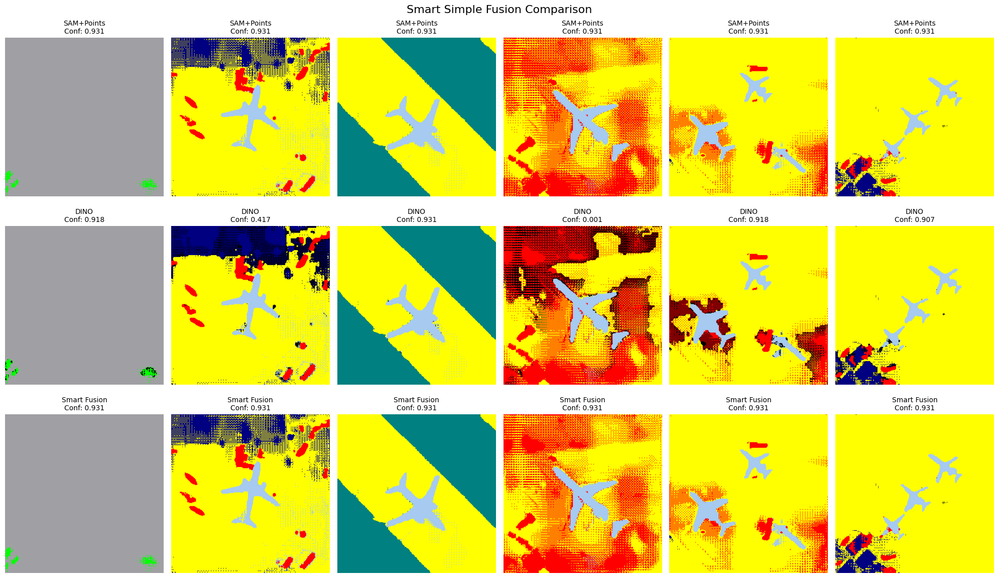


📁 Output directories:
   Smart Simple: /home/iiitdmk-param/A.C/Anisha/4th objective/dlrsd/simple_fusion_refined_predictions
   Ultra Simple: /home/iiitdmk-param/A.C/Anisha/4th objective/dlrsd/simple_fusion_refined_predictions_ultra_simple


In [20]:
import numpy as np
import cv2
import os
import matplotlib.pyplot as plt

# ==================== CONFIGURATION ====================
sam_predictions_dir = '/home/iiitdmk-param/A.C/Anisha/4th objective/dlrsd/topo_refined_predictions'
dino_predictions_dir = '/home/iiitdmk-param/A.C/Anisha/4th objective/dlrsd/DINO_topo_point_refined_predictions' 
output_dir = '/home/iiitdmk-param/A.C/Anisha/4th objective/dlrsd/simple_fusion_refined_predictions'
CLASS_INFO = {
    0: {"name": "background", "rgb": [0, 0, 0]},
    1: {"name": "airplane", "rgb": [166, 202, 240]},
    2: {"name": "bare soil", "rgb": [128, 128, 0]},
    3: {"name": "buildings", "rgb": [0, 0, 128]},
    4: {"name": "cars", "rgb": [255, 0, 0]},
    5: {"name": "chaparral", "rgb": [0, 128, 0]},
    6: {"name": "court", "rgb": [128, 0, 0]},
    7: {"name": "dock", "rgb": [255, 233, 233]},
    8: {"name": "field", "rgb": [160, 160, 164]},
    9: {"name": "grass", "rgb": [0, 128, 128]},
    10: {"name": "mobile home", "rgb": [90, 87, 255]},
    11: {"name": "pavement", "rgb": [255, 255, 0]},
    12: {"name": "sand", "rgb": [255, 192, 0]},
    13: {"name": "sea", "rgb": [0, 0, 255]},
    14: {"name": "ship", "rgb": [255, 0, 192]},
    15: {"name": "tanks", "rgb": [128, 0, 128]},
    16: {"name": "trees", "rgb": [0, 255, 0]},
    17: {"name": "water", "rgb": [0, 255, 255]}
}

# ==================== SIMPLE BUT SMART FUSION ====================

def calculate_simple_confidence(mask):
    """Simple confidence based on boundary smoothness"""
    mask_uint8 = mask.astype(np.uint8)
    contours, _ = cv2.findContours(mask_uint8, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    if len(contours) == 0:
        return 0.0
    
    total_confidence = 0
    total_area = 0
    
    for contour in contours:
        area = cv2.contourArea(contour)
        if area == 0:
            continue
            
        perimeter = cv2.arcLength(contour, True)
        # Compactness: perfect circle = ~12.57, higher = more complex
        compactness = (perimeter ** 2) / area
        
        # Simple confidence: lower compactness = higher confidence
        confidence = max(0, 1 - (compactness - 12.57) / 50)
        total_confidence += confidence * area
        total_area += area
    
    return total_confidence / total_area if total_area > 0 else 0.0

def smart_simple_fusion(sam_mask, dino_mask):
    """
    Simple rule-based fusion:
    - Where both agree: use that class
    - Where they disagree: use SAM (since it's generally better)
    - But for specific classes where DINO is strong, use DINO
    """
    
    # Start with SAM mask (since it's generally better)
    fused_mask = sam_mask.copy()
    
    # Calculate simple confidences
    sam_conf = calculate_simple_confidence(sam_mask)
    dino_conf = calculate_simple_confidence(dino_mask)
    
    print(f"    SAM confidence: {sam_conf:.3f}, DINO confidence: {dino_conf:.3f}")
    
    # Find where masks disagree
    disagreement = sam_mask != dino_mask
    
    if not np.any(disagreement):
        return fused_mask
    
    # For disagreements, use simple rules:
    for i in range(sam_mask.shape[0]):
        for j in range(sam_mask.shape[1]):
            if disagreement[i, j]:
                sam_class = sam_mask[i, j]
                dino_class = dino_mask[i, j]
                
                # Rule 1: If DINO is much more confident, use DINO
                if dino_conf > sam_conf + 0.1:
                    fused_mask[i, j] = dino_class
                
                # Rule 2: For specific classes that DINO handles well, use DINO
                elif dino_class in [1, 4, 9, 10, 12, 13, 15, 16]:  # DINO-strong classes
                    fused_mask[i, j] = dino_class
                
                # Rule 3: Otherwise, stick with SAM
                else:
                    fused_mask[i, j] = sam_class
    
    return fused_mask

def conservative_fusion(sam_mask, dino_mask):
    """
    Very conservative approach:
    - Only use DINO where it's clearly better
    - Mostly stick with SAM
    """
    fused_mask = sam_mask.copy()
    
    # Find disagreements
    disagreement = sam_mask != dino_mask
    
    if not np.any(disagreement):
        return fused_mask
    
    # Calculate local confidence in 5x5 windows around disagreements
    h, w = sam_mask.shape
    
    for i in range(h):
        for j in range(w):
            if disagreement[i, j]:
                # Check local neighborhood (3x3)
                i_min = max(0, i-1)
                i_max = min(h, i+2)
                j_min = max(0, j-1)
                j_max = min(w, j+2)
                
                sam_local = sam_mask[i_min:i_max, j_min:j_max]
                dino_local = dino_mask[i_min:i_max, j_min:j_max]
                
                # Count agreements in local neighborhood
                sam_agreements = np.sum(sam_local == sam_mask[i, j])
                dino_agreements = np.sum(dino_local == dino_mask[i, j])
                
                # If DINO has strong local support, use it
                if dino_agreements > sam_agreements + 2:  # DINO has at least 3 more agreements
                    fused_mask[i, j] = dino_mask[i, j]
                # Otherwise stick with SAM
    
    return fused_mask

def majority_vote_fusion(sam_mask, dino_mask, window_size=5):
    """
    Use majority voting in local windows to resolve disagreements
    """
    fused_mask = sam_mask.copy()
    disagreement = sam_mask != dino_mask
    
    if not np.any(disagreement):
        return fused_mask
    
    h, w = sam_mask.shape
    pad = window_size // 2
    
    # Pad masks
    sam_padded = np.pad(sam_mask, pad, mode='reflect')
    dino_padded = np.pad(dino_mask, pad, mode='reflect')
    
    for i in range(h):
        for j in range(w):
            if disagreement[i, j]:
                # Get local windows
                sam_window = sam_padded[i:i+window_size, j:j+window_size]
                dino_window = dino_padded[i:i+window_size, j:j+window_size]
                
                # Count votes for each class in the window
                sam_votes = np.bincount(sam_window.flatten(), minlength=18)
                dino_votes = np.bincount(dino_window.flatten(), minlength=18)
                
                # Combined votes
                total_votes = sam_votes + dino_votes
                
                # Find majority class
                majority_class = np.argmax(total_votes)
                
                # Only change if majority is clear (at least 60% of votes)
                if total_votes[majority_class] / (window_size * window_size * 2) > 0.6:
                    fused_mask[i, j] = majority_class
    
    return fused_mask

# ==================== MAIN PIPELINE ====================

def run_smart_simple_fusion(sam_dir, dino_dir, output_dir):
    """Run simple but smart fusion pipeline"""
    
    os.makedirs(output_dir, exist_ok=True)
    
    # Get all prediction files
    sam_files = sorted([f for f in os.listdir(sam_dir) if f.endswith('.png')])
    dino_files = sorted([f for f in os.listdir(dino_dir) if f.endswith('.png')])
    
    print(f"🔄 Running SMART SIMPLE fusion on {len(sam_files)} images...")
    
    for sam_file, dino_file in zip(sam_files, dino_files):
        # Load masks
        sam_path = os.path.join(sam_dir, sam_file)
        dino_path = os.path.join(dino_dir, dino_file)
        
        sam_mask = cv2.imread(sam_path, cv2.IMREAD_GRAYSCALE)
        dino_mask = cv2.imread(dino_path, cv2.IMREAD_GRAYSCALE)
        
        if sam_mask is None or dino_mask is None:
            print(f"❌ Could not load masks for {sam_file}")
            continue
        
        print(f"🔧 Processing: {sam_file}")
        
        # Calculate agreement percentage
        agreement = np.mean(sam_mask == dino_mask)
        print(f"    Agreement: {agreement:.3f}")
        
        # Try different simple fusion methods
        methods = [
            ('smart_simple', smart_simple_fusion),
            ('conservative', conservative_fusion), 
            ('majority_vote', lambda s, d: majority_vote_fusion(s, d, window_size=5))
        ]
        
        best_fused = None
        best_conf = -1
        
        for method_name, method_func in methods:
            try:
                fused = method_func(sam_mask, dino_mask)
                conf = calculate_simple_confidence(fused)
                
                if conf > best_conf:
                    best_conf = conf
                    best_fused = fused
                    best_method = method_name
            except Exception as e:
                print(f"    ⚠️  {method_name} failed: {e}")
                continue
        
        # Save best result
        output_path = os.path.join(output_dir, sam_file)
        cv2.imwrite(output_path, best_fused.astype(np.uint8))
        
        sam_conf = calculate_simple_confidence(sam_mask)
        dino_conf = calculate_simple_confidence(dino_mask)
        
        print(f"    ✅ Used {best_method} | " +
              f"Confidence: {best_conf:.3f} (SAM: {sam_conf:.3f}, DINO: {dino_conf:.3f})")
    
    print(f"\n🎉 SMART SIMPLE FUSION COMPLETED!")
    print(f"📁 Output saved to: {output_dir}")

def visualize_simple_comparison(sam_dir, dino_dir, fused_dir, num_samples=6):
    """Simple visualization"""
    
    sam_files = sorted([f for f in os.listdir(sam_dir) if f.endswith('.png')])[:num_samples]
    
    fig, axes = plt.subplots(3, num_samples, figsize=(20, 12))
    if num_samples == 1:
        axes = axes.reshape(3, 1)
    
    for i, sam_file in enumerate(sam_files):
        # Load masks
        sam_path = os.path.join(sam_dir, sam_file)
        dino_path = os.path.join(dino_dir, sam_file)
        fused_path = os.path.join(fused_dir, sam_file)
        
        sam_mask = cv2.imread(sam_path, cv2.IMREAD_GRAYSCALE)
        dino_mask = cv2.imread(dino_path, cv2.IMREAD_GRAYSCALE)
        fused_mask = cv2.imread(fused_path, cv2.IMREAD_GRAYSCALE)
        
        if sam_mask is None or dino_mask is None or fused_mask is None:
            continue
        
        # Create colored masks
        def create_colored_mask(mask):
            colored = np.zeros((*mask.shape, 3), dtype=np.uint8)
            for class_id, info in CLASS_INFO.items():
                colored[mask == class_id] = info["rgb"]
            return colored
        
        sam_colored = create_colored_mask(sam_mask)
        dino_colored = create_colored_mask(dino_mask)
        fused_colored = create_colored_mask(fused_mask)
        
        # Calculate confidences
        sam_conf = calculate_simple_confidence(sam_mask)
        dino_conf = calculate_simple_confidence(dino_mask)
        fused_conf = calculate_simple_confidence(fused_mask)
        
        # Plot
        axes[0, i].imshow(sam_colored)
        axes[0, i].set_title(f'SAM+Points\nConf: {sam_conf:.3f}', fontsize=10)
        axes[0, i].axis('off')
        
        axes[1, i].imshow(dino_colored)
        axes[1, i].set_title(f'DINO\nConf: {dino_conf:.3f}', fontsize=10)
        axes[1, i].axis('off')
        
        axes[2, i].imshow(fused_colored)
        axes[2, i].set_title(f'Smart Fusion\nConf: {fused_conf:.3f}', fontsize=10)
        axes[2, i].axis('off')
    
    plt.suptitle('Smart Simple Fusion Comparison', fontsize=16)
    plt.tight_layout()
    plt.show()

# ==================== ULTRA-SIMPLE APPROACH ====================

def ultra_simple_fusion(sam_mask, dino_mask):
    """
    Ultra-simple approach:
    - Use SAM everywhere except where DINO is clearly better
    - Only change if DINO has strong local support
    """
    fused_mask = sam_mask.copy()
    
    # Find where they disagree
    disagreement = sam_mask != dino_mask
    
    if not np.any(disagreement):
        return fused_mask
    
    h, w = sam_mask.shape
    
    # For each disagreement, check if DINO makes sense
    for i in range(h):
        for j in range(w):
            if disagreement[i, j]:
                sam_class = sam_mask[i, j]
                dino_class = dino_mask[i, j]
                
                # Only consider changing if:
                # 1. DINO class appears in local neighborhood
                # 2. The change makes the region more homogeneous
                
                # Check 5x5 neighborhood
                i_min = max(0, i-2)
                i_max = min(h, i+3)
                j_min = max(0, j-2)
                j_max = min(w, j+3)
                
                neighborhood = sam_mask[i_min:i_max, j_min:j_max]
                dino_neighborhood = dino_mask[i_min:i_max, j_min:j_max]
                
                # Count how many neighbors have the DINO class
                dino_neighbors = np.sum(dino_neighborhood == dino_class)
                total_neighbors = neighborhood.size
                
                # If DINO class is common in neighborhood, consider changing
                if dino_neighbors / total_neighbors > 0.3:  # 30% threshold
                    fused_mask[i, j] = dino_class
    
    return fused_mask

def run_ultra_simple_fusion(sam_dir, dino_dir, output_dir):
    """Run the ultra-simple fusion"""
    
    os.makedirs(output_dir, exist_ok=True)
    
    sam_files = sorted([f for f in os.listdir(sam_dir) if f.endswith('.png')])
    dino_files = sorted([f for f in os.listdir(dino_dir) if f.endswith('.png')])
    
    print(f"🔄 Running ULTRA-SIMPLE fusion on {len(sam_files)} images...")
    
    for sam_file, dino_file in zip(sam_files, dino_files):
        sam_path = os.path.join(sam_dir, sam_file)
        dino_path = os.path.join(dino_dir, dino_file)
        
        sam_mask = cv2.imread(sam_path, cv2.IMREAD_GRAYSCALE)
        dino_mask = cv2.imread(dino_path, cv2.IMREAD_GRAYSCALE)
        
        if sam_mask is None or dino_mask is None:
            continue
        
        print(f"🎯 Processing: {sam_file}")
        
        # Apply ultra-simple fusion
        fused_mask = ultra_simple_fusion(sam_mask, dino_mask)
        
        # Save result
        output_path = os.path.join(output_dir, sam_file)
        cv2.imwrite(output_path, fused_mask.astype(np.uint8))
        
        # Calculate changes
        changes = np.sum(sam_mask != fused_mask)
        total_pixels = sam_mask.size
        print(f"    Changed {changes} pixels ({changes/total_pixels*100:.2f}%)")
    
    print(f"\n🎉 ULTRA-SIMPLE FUSION COMPLETED!")

# ==================== MAIN EXECUTION ====================

def main():
    print("🚀 STARTING SMART SIMPLE FUSION")
    print("=" * 50)
    print("Using simple, robust fusion strategies")
    print("=" * 50)
    
    # Run smart simple fusion
    run_smart_simple_fusion(
        sam_predictions_dir,
        dino_predictions_dir, 
        output_dir
    )
    
    # Also run ultra-simple as alternative
    ultra_output_dir = output_dir + "_ultra_simple"
    run_ultra_simple_fusion(
        sam_predictions_dir,
        dino_predictions_dir,
        ultra_output_dir
    )
    
    # Visualize results
    visualize_simple_comparison(
        sam_predictions_dir,
        dino_predictions_dir,
        output_dir
    )
    
    print(f"\n📁 Output directories:")
    print(f"   Smart Simple: {output_dir}")
    print(f"   Ultra Simple: {ultra_output_dir}")

if __name__ == "__main__":
    main()

In [21]:
import os
import numpy as np
from PIL import Image

# Define the class information
CLASS_INFO = {
    0: {"name": "background", "rgb": [0, 0, 0]},
    1: {"name": "airplane", "rgb": [166, 202, 240]},
    2: {"name": "bare soil", "rgb": [128, 128, 0]},
    3: {"name": "buildings", "rgb": [0, 0, 128]},
    4: {"name": "cars", "rgb": [255, 0, 0]},
    5: {"name": "chaparral", "rgb": [0, 128, 0]},
    6: {"name": "court", "rgb": [128, 0, 0]},
    7: {"name": "dock", "rgb": [255, 233, 233]},
    8: {"name": "field", "rgb": [160, 160, 164]},
    9: {"name": "grass", "rgb": [0, 128, 128]},
    10: {"name": "mobile home", "rgb": [90, 87, 255]},
    11: {"name": "pavement", "rgb": [255, 255, 0]},
    12: {"name": "sand", "rgb": [255, 192, 0]},
    13: {"name": "sea", "rgb": [0, 0, 255]},
    14: {"name": "ship", "rgb": [255, 0, 192]},
    15: {"name": "tanks", "rgb": [128, 0, 128]},
    16: {"name": "trees", "rgb": [0, 255, 0]},
    17: {"name": "water", "rgb": [0, 255, 255]}
}

def calculate_detailed_miou(gt_folder, pred_folder, num_classes=18, ignore_index=None):
    """
    Calculate detailed mIoU with per-class results
    """
    
    gt_files = sorted([f for f in os.listdir(gt_folder) if f.endswith(('.png', '.jpg', '.jpeg', '.tiff'))])
    pred_files = sorted([f for f in os.listdir(pred_folder) if f.endswith(('.png', '.jpg', '.jpeg', '.tiff'))])
    
    assert len(gt_files) == len(pred_files), f"Number of files don't match: GT={len(gt_files)}, Pred={len(pred_files)}"
    
    # Initialize intersection and union arrays
    total_intersection = np.zeros(num_classes)
    total_union = np.zeros(num_classes)
    class_pixels = np.zeros(num_classes)  # For pixel accuracy
    
    print(f"Processing {len(gt_files)} images...")
    
    for i, (gt_file, pred_file) in enumerate(zip(gt_files, pred_files)):
        gt_path = os.path.join(gt_folder, gt_file)
        pred_path = os.path.join(pred_folder, pred_file)
        
        # Load 1-channel masks
        gt_mask = np.array(Image.open(gt_path))
        pred_mask = np.array(Image.open(pred_path))
        
        # Ensure masks have the same shape
        assert gt_mask.shape == pred_mask.shape, f"Shape mismatch: GT{gt_mask.shape} vs Pred{pred_mask.shape}"
        
        # Calculate IoU for each class
        for class_id in range(num_classes):
            if ignore_index is not None and class_id == ignore_index:
                continue
                
            gt_class = (gt_mask == class_id)
            pred_class = (pred_mask == class_id)
            
            intersection = np.logical_and(gt_class, pred_class).sum()
            union = np.logical_or(gt_class, pred_class).sum()
            
            total_intersection[class_id] += intersection
            total_union[class_id] += union
            class_pixels[class_id] += gt_class.sum()
        
        if (i + 1) % 100 == 0:
            print(f"Processed {i + 1}/{len(gt_files)} images")
    
    # Calculate IoU for each class
    iou_per_class = np.zeros(num_classes)
    for class_id in range(num_classes):
        if total_union[class_id] > 0:
            iou_per_class[class_id] = total_intersection[class_id] / total_union[class_id]
        else:
            iou_per_class[class_id] = np.nan
    
    # Calculate mIoU (mean over classes, ignoring NaN)
    valid_classes = ~np.isnan(iou_per_class)
    miou = np.mean(iou_per_class[valid_classes])
    
    # Calculate pixel accuracy
    pixel_accuracy = total_intersection.sum() / class_pixels.sum() if class_pixels.sum() > 0 else 0
    
    return miou, iou_per_class, pixel_accuracy

# Usage with detailed results
gt_folder = '/home/iiitdmk-param/A.C/Anisha/4th objective/dlrsd/full_test_1cmasks'
pred_folder = '/home/iiitdmk-param/A.C/Anisha/4th objective/dlrsd/simple_fusion_refined_predictions'
num_classes = 18

miou, iou_per_class, pixel_acc = calculate_detailed_miou(gt_folder, pred_folder, num_classes)

print("\n" + "="*50)
print("SEMANTIC SEGMENTATION RESULTS")
print("="*50)
print(f"mIoU: {miou:.4f}")
print(f"Pixel Accuracy: {pixel_acc:.4f}")
print("\nPer-class IoU:")
for class_id in range(num_classes):
    class_name = CLASS_INFO[class_id]["name"]
    iou = iou_per_class[class_id]
    if not np.isnan(iou):
        print(f"  {class_name:15}: {iou:.4f}")
    else:
        print(f"  {class_name:15}: No pixels")

Processing 1319 images...
Processed 100/1319 images
Processed 200/1319 images
Processed 300/1319 images
Processed 400/1319 images
Processed 500/1319 images
Processed 600/1319 images
Processed 700/1319 images
Processed 800/1319 images
Processed 900/1319 images
Processed 1000/1319 images
Processed 1100/1319 images
Processed 1200/1319 images
Processed 1300/1319 images

SEMANTIC SEGMENTATION RESULTS
mIoU: 0.5940
Pixel Accuracy: 0.7614

Per-class IoU:
  background     : No pixels
  airplane       : 0.6442
  bare soil      : 0.3996
  buildings      : 0.6262
  cars           : 0.6782
  chaparral      : 0.4450
  court          : 0.7783
  dock           : 0.4952
  field          : 0.2383
  grass          : 0.6364
  mobile home    : 0.5381
  pavement       : 0.7248
  sand           : 0.5140
  sea            : 0.8513
  ship           : 0.5595
  tanks          : 0.6794
  trees          : 0.5563
  water          : 0.7337


🚀 STARTING POINT-ENHANCED CONFIDENCE SELECTION
Using point annotations for reliable confidence assessment

🎯 METHOD 1: Point-enhanced confidence selection...
🔍 Loading point annotations for confidence assessment...
📊 Loaded 158237 points across 1319 images
🔍 Analyzing confidence for 1319 predictions with point annotations...
[1/1319] Analyzing: agric_1962.png (points: 15)
[2/1319] Analyzing: airpl_831.png (points: 90)
[3/1319] Analyzing: airpl_832.png (points: 25)
[4/1319] Analyzing: airpl_833.png (points: 45)
[5/1319] Analyzing: airpl_834.png (points: 35)
[6/1319] Analyzing: airpl_835.png (points: 54)
[7/1319] Analyzing: airpl_836.png (points: 50)
[8/1319] Analyzing: airpl_837.png (points: 49)
[9/1319] Analyzing: airpl_838.png (points: 30)
[10/1319] Analyzing: airpl_839.png (points: 80)
[11/1319] Analyzing: airpl_840.png (points: 55)
[12/1319] Analyzing: airpl_841.png (points: 35)
[13/1319] Analyzing: airpl_842.png (points: 75)
[14/1319] Analyzing: airpl_843.png (points: 15)
[15/1319]

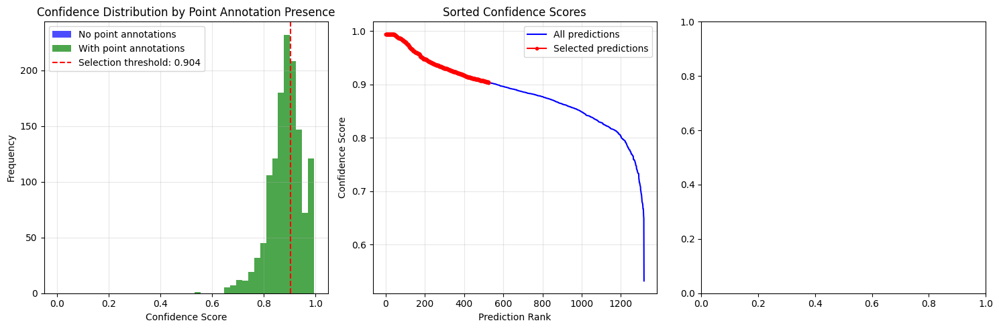


📈 POINT-ENHANCED SELECTION ANALYSIS:
  Total selected: 527
  With point annotations: 527
  Without point annotations: 0

📊 METRICS FOR IMAGES WITH POINT ANNOTATIONS:
  Average Point Agreement: 0.9812
  Average Local Consistency: 0.8543
  Average Point Coverage: 0.9818

📊 OVERALL CONFIDENCE METRICS:
  Average Comprehensive Confidence: 0.9431
  Average Boundary Confidence: 0.9657
  Average Region Consistency: 0.9389
✅ Selected 527 confident predictions
📁 Output: /home/iiitdmk-param/A.C/Anisha/4th objective/dlrsd/point_enhanced_confidence_selection/point_confident_predictions

🎯 METHOD 2: High point agreement selection...
🔍 Loading point annotations for confidence assessment...
📊 Loaded 158237 points across 1319 images
🔍 Selecting predictions with point agreement ≥ 0.8...
  ✅ agric_1962.png (point agreement: 1.0000)
  ✅ airpl_831.png (point agreement: 0.9889)
  ✅ airpl_832.png (point agreement: 1.0000)
  ✅ airpl_833.png (point agreement: 0.9556)
  ✅ airpl_834.png (point agreement: 1.0000

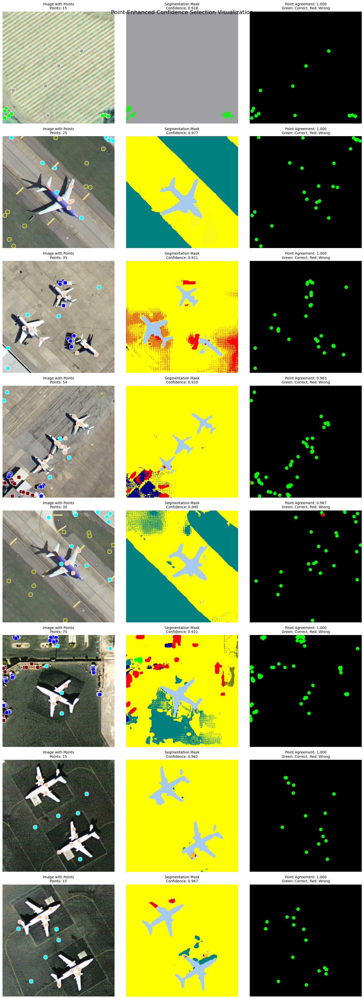


🎉 POINT-ENHANCED CONFIDENCE SELECTION COMPLETED!
📁 All outputs saved to: /home/iiitdmk-param/A.C/Anisha/4th objective/dlrsd/point_enhanced_confidence_selection


In [22]:
import numpy as np
import cv2
import os
import matplotlib.pyplot as plt
from scipy import ndimage
import json
import shutil
from collections import defaultdict

# ==================== CONFIGURATION ====================
predictions_dir = '/home/iiitdmk-param/A.C/Anisha/4th objective/dlrsd/simple_fusion_refined_predictions'
test_image_dir = '/home/iiitdmk-param/A.C/Anisha/4th objective/dlrsd/full_test_images'
point_annotation_dir = '/home/iiitdmk-param/A.C/Anisha/4th objective/dlrsd/full_test_point_masks'
output_base_dir = '/home/iiitdmk-param/A.C/Anisha/4th objective/dlrsd/point_enhanced_confidence_selection'

CLASS_INFO = {
    0: {"name": "background", "rgb": [0, 0, 0]},
    1: {"name": "airplane", "rgb": [166, 202, 240]},
    2: {"name": "bare soil", "rgb": [128, 128, 0]},
    3: {"name": "buildings", "rgb": [0, 0, 128]},
    4: {"name": "cars", "rgb": [255, 0, 0]},
    5: {"name": "chaparral", "rgb": [0, 128, 0]},
    6: {"name": "court", "rgb": [128, 0, 0]},
    7: {"name": "dock", "rgb": [255, 233, 233]},
    8: {"name": "field", "rgb": [160, 160, 164]},
    9: {"name": "grass", "rgb": [0, 128, 128]},
    10: {"name": "mobile home", "rgb": [90, 87, 255]},
    11: {"name": "pavement", "rgb": [255, 255, 0]},
    12: {"name": "sand", "rgb": [255, 192, 0]},
    13: {"name": "sea", "rgb": [0, 0, 255]},
    14: {"name": "ship", "rgb": [255, 0, 192]},
    15: {"name": "tanks", "rgb": [128, 0, 128]},
    16: {"name": "trees", "rgb": [0, 255, 0]},
    17: {"name": "water", "rgb": [0, 255, 255]}
}

# ==================== POINT ANNOTATION LOADING ====================

def load_point_annotations(point_annotation_dir, image_files):
    """Load RGB point annotations and convert to class coordinates"""
    point_prompts = {}
    ignore_color = np.array([100, 100, 100])
    
    print("🔍 Loading point annotations for confidence assessment...")
    
    for image_file in image_files:
        base_name = os.path.splitext(image_file)[0]
        point_path = os.path.join(point_annotation_dir, f"{base_name}.png")
        
        if os.path.exists(point_path):
            point_mask = cv2.imread(point_path)
            if point_mask is None:
                continue
                
            point_mask = cv2.cvtColor(point_mask, cv2.COLOR_BGR2RGB)
            non_ignore_mask = ~np.all(point_mask == ignore_color, axis=-1)
            
            class_points = {}
            for class_id, info in CLASS_INFO.items():
                if class_id == 0:  # Skip background
                    continue
                    
                target_color = np.array(info["rgb"])
                mask = np.all(point_mask == target_color, axis=-1) & non_ignore_mask
                
                if np.any(mask):
                    y_coords, x_coords = np.where(mask)
                    points = list(zip(x_coords, y_coords))
                    class_points[class_id] = points
            
            point_prompts[base_name] = class_points
    
    images_with_points = sum(1 for points in point_prompts.values() if points)
    total_points = sum(sum(len(points) for points in classes.values()) for classes in point_prompts.values())
    
    print(f"📊 Loaded {total_points} points across {images_with_points} images")
    
    return point_prompts

# ==================== POINT-ENHANCED CONFIDENCE METRICS ====================

def calculate_point_agreement_confidence(mask, point_annotations):
    """Calculate confidence based on agreement with point annotations"""
    if not point_annotations:
        return 0.0
    
    total_points = 0
    correct_points = 0
    
    for class_id, points in point_annotations.items():
        for x, y in points:
            total_points += 1
            # Check if the prediction matches the point annotation
            if 0 <= y < mask.shape[0] and 0 <= x < mask.shape[1]:
                if mask[y, x] == class_id:
                    correct_points += 1
    
    return correct_points / total_points if total_points > 0 else 0.0

def calculate_local_point_consistency(mask, point_annotations, radius=5):
    """Calculate consistency around point annotations"""
    if not point_annotations:
        return 0.0
    
    local_consistencies = []
    
    for class_id, points in point_annotations.items():
        for x, y in points:
            if 0 <= y < mask.shape[0] and 0 <= x < mask.shape[1]:
                # Check local neighborhood around the point
                y_min = max(0, y - radius)
                y_max = min(mask.shape[0], y + radius + 1)
                x_min = max(0, x - radius)
                x_max = min(mask.shape[1], x + radius + 1)
                
                local_region = mask[y_min:y_max, x_min:x_max]
                same_class_pixels = np.sum(local_region == class_id)
                total_pixels = local_region.size
                
                if total_pixels > 0:
                    local_consistency = same_class_pixels / total_pixels
                    local_consistencies.append(local_consistency)
    
    return np.mean(local_consistencies) if local_consistencies else 0.0

def calculate_point_coverage_confidence(mask, point_annotations):
    """Calculate how well points are covered by their predicted classes"""
    if not point_annotations:
        return 0.0
    
    coverage_scores = []
    
    for class_id, points in point_annotations.items():
        if len(points) == 0:
            continue
            
        # Find the predicted region for this class
        predicted_region = (mask == class_id)
        
        if not np.any(predicted_region):
            coverage_scores.append(0.0)
            continue
        
        # Calculate how many points fall inside the predicted region
        points_inside = 0
        for x, y in points:
            if 0 <= y < mask.shape[0] and 0 <= x < mask.shape[1]:
                if predicted_region[y, x]:
                    points_inside += 1
        
        coverage = points_inside / len(points)
        coverage_scores.append(coverage)
    
    return np.mean(coverage_scores) if coverage_scores else 0.0

def calculate_boundary_confidence(mask):
    """Calculate confidence based on boundary smoothness"""
    mask_uint8 = mask.astype(np.uint8)
    contours, _ = cv2.findContours(mask_uint8, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    if len(contours) == 0:
        return 0.0
    
    total_confidence = 0
    total_area = 0
    
    for contour in contours:
        area = cv2.contourArea(contour)
        if area == 0:
            continue
            
        perimeter = cv2.arcLength(contour, True)
        compactness = (perimeter ** 2) / area
        
        confidence = max(0, 1 - (compactness - 12.57) / 100)
        total_confidence += confidence * area
        total_area += area
    
    return total_confidence / total_area if total_area > 0 else 0.0

def calculate_region_consistency(mask, window_size=5):
    """Calculate how consistent labels are in local neighborhoods"""
    h, w = mask.shape
    consistency_map = np.zeros((h, w))
    
    pad = window_size // 2
    padded_mask = np.pad(mask, pad, mode='reflect')
    
    for i in range(h):
        for j in range(w):
            window = padded_mask[i:i+window_size, j:j+window_size]
            center_label = window[pad, pad]
            
            same_count = np.sum(window == center_label)
            consistency_map[i, j] = same_count / (window_size * window_size)
    
    return np.mean(consistency_map)

def calculate_comprehensive_point_confidence(mask, point_annotations):
    """Combine multiple confidence metrics with point annotation information"""
    
    # Calculate all confidence metrics
    boundary_conf = calculate_boundary_confidence(mask)
    consistency = calculate_region_consistency(mask)
    
    # Point-based confidence metrics
    point_agreement = calculate_point_agreement_confidence(mask, point_annotations)
    local_consistency = calculate_local_point_consistency(mask, point_annotations)
    point_coverage = calculate_point_coverage_confidence(mask, point_annotations)
    
    # If we have point annotations, prioritize point-based metrics
    if point_annotations:
        comprehensive_confidence = (
            0.3 * point_agreement +
            0.25 * local_consistency +
            0.2 * point_coverage +
            0.15 * boundary_conf +
            0.1 * consistency
        )
    else:
        # Fallback to standard metrics if no points
        comprehensive_confidence = (
            0.5 * boundary_conf +
            0.5 * consistency
        )
    
    return comprehensive_confidence, {
        'point_agreement': point_agreement,
        'local_point_consistency': local_consistency,
        'point_coverage': point_coverage,
        'boundary_confidence': boundary_conf,
        'region_consistency': consistency
    }

# ==================== POINT-ENHANCED SELECTION ====================

def select_most_confident_predictions_with_points(predictions_dir, test_image_dir, point_annotation_dir, 
                                                output_base_dir, selection_method='point_enhanced', top_k=0.5):
    """
    Select most confident predictions using point annotation information
    """
    
    # Create output directories
    confident_dir = os.path.join(output_base_dir, 'point_confident_predictions')
    masks_dir = os.path.join(confident_dir, 'masks')
    images_dir = os.path.join(confident_dir, 'images')
    confidence_scores_dir = os.path.join(confident_dir, 'confidence_scores')
    
    os.makedirs(masks_dir, exist_ok=True)
    os.makedirs(images_dir, exist_ok=True)
    os.makedirs(confidence_scores_dir, exist_ok=True)
    
    # Get all prediction files
    pred_files = sorted([f for f in os.listdir(predictions_dir) if f.endswith(('.png', '.jpg', '.jpeg'))])
    
    # Load point annotations
    point_annotations = load_point_annotations(point_annotation_dir, pred_files)
    
    print(f"🔍 Analyzing confidence for {len(pred_files)} predictions with point annotations...")
    
    confidence_scores = []
    detailed_results = []
    
    for i, pred_file in enumerate(pred_files, 1):
        # Load prediction mask
        pred_path = os.path.join(predictions_dir, pred_file)
        mask = cv2.imread(pred_path, cv2.IMREAD_GRAYSCALE)
        
        if mask is None:
            print(f"❌ Could not load mask: {pred_file}")
            continue
        
        base_name = os.path.splitext(pred_file)[0]
        point_info = point_annotations.get(base_name, {})
        
        print(f"[{i}/{len(pred_files)}] Analyzing: {pred_file} (points: {sum(len(p) for p in point_info.values())})")
        
        # Calculate point-enhanced confidence
        comprehensive_conf, metric_breakdown = calculate_comprehensive_point_confidence(mask, point_info)
        
        # Get class distribution
        unique_classes = np.unique(mask)
        class_distribution = {int(cls): int(np.sum(mask == cls)) for cls in unique_classes}
        
        # Store results
        confidence_scores.append((comprehensive_conf, pred_file))
        
        image_info = {
            'image_file': pred_file,
            'confidence_score': comprehensive_conf,
            'point_metrics': metric_breakdown,
            'has_point_annotations': len(point_info) > 0,
            'num_point_annotations': sum(len(p) for p in point_info.values()),
            'class_distribution': class_distribution,
            'num_classes': len(unique_classes)
        }
        
        detailed_results.append(image_info)
        
        # Save individual confidence info
        info_path = os.path.join(confidence_scores_dir, f"{base_name}_confidence.json")
        with open(info_path, 'w') as f:
            json.dump(image_info, f, indent=2)
    
    # Sort by confidence score (descending)
    confidence_scores.sort(key=lambda x: x[0], reverse=True)
    
    # Determine how many to select
    if 0 < top_k < 1:
        num_to_select = int(len(confidence_scores) * top_k)
    else:
        num_to_select = min(int(top_k), len(confidence_scores))
    
    selected_predictions = confidence_scores[:num_to_select]
    
    print(f"\n🎯 Selected {len(selected_predictions)} most confident predictions:")
    
    # Copy selected images and masks
    for score, pred_file in selected_predictions:
        base_name = os.path.splitext(pred_file)[0]
        
        # Copy prediction mask
        src_mask_path = os.path.join(predictions_dir, pred_file)
        dst_mask_path = os.path.join(masks_dir, pred_file)
        shutil.copy2(src_mask_path, dst_mask_path)
        
        # Copy original image
        image_file = pred_file
        src_image_path = os.path.join(test_image_dir, image_file)
        dst_image_path = os.path.join(images_dir, image_file)
        
        if os.path.exists(src_image_path):
            shutil.copy2(src_image_path, dst_image_path)
        else:
            print(f"⚠️  Original image not found: {image_file}")
        
        # Get point info for this image
        point_info = point_annotations.get(base_name, {})
        num_points = sum(len(p) for p in point_info.values())
        
        print(f"  ✅ {pred_file} (score: {score:.4f}, points: {num_points})")
    
    # Save selection summary
    summary = {
        'total_predictions': len(pred_files),
        'selected_predictions': len(selected_predictions),
        'selection_method': selection_method,
        'top_k': top_k,
        'confidence_threshold': selected_predictions[-1][0] if selected_predictions else 0,
        'average_confidence': np.mean([score for score, _ in selected_predictions]),
        'images_with_points': sum(1 for _, pred_file in selected_predictions 
                                if os.path.splitext(pred_file)[0] in point_annotations),
        'selected_files': [pred_file for _, pred_file in selected_predictions]
    }
    
    summary_path = os.path.join(confident_dir, 'selection_summary.json')
    with open(summary_path, 'w') as f:
        json.dump(summary, f, indent=2)
    
    # Plot confidence distribution
    plot_point_enhanced_confidence_distribution(confidence_scores, selected_predictions, point_annotations, confident_dir)
    
    # Analyze selected predictions
    analyze_point_enhanced_selections(selected_predictions, detailed_results, point_annotations, confident_dir)
    
    return confident_dir, summary

def plot_point_enhanced_confidence_distribution(confidence_scores, selected_predictions, point_annotations, output_dir):
    """Plot confidence distribution with point annotation information"""
    all_scores = [score for score, _ in confidence_scores]
    selected_scores = [score for score, _ in selected_predictions]
    
    # Separate scores by whether they have point annotations
    scores_with_points = []
    scores_without_points = []
    
    for score, pred_file in confidence_scores:
        base_name = os.path.splitext(pred_file)[0]
        if base_name in point_annotations and point_annotations[base_name]:
            scores_with_points.append(score)
        else:
            scores_without_points.append(score)
    
    plt.figure(figsize=(15, 5))
    
    # Plot 1: Histogram with point annotation distinction
    plt.subplot(1, 3, 1)
    plt.hist(scores_without_points, bins=20, alpha=0.7, color='blue', label='No point annotations')
    plt.hist(scores_with_points, bins=20, alpha=0.7, color='green', label='With point annotations')
    if selected_scores:
        plt.axvline(x=selected_scores[-1], color='red', linestyle='--', 
                    label=f'Selection threshold: {selected_scores[-1]:.3f}')
    plt.xlabel('Confidence Score')
    plt.ylabel('Frequency')
    plt.title('Confidence Distribution by Point Annotation Presence')
    plt.legend()
    plt.grid(True, alpha=0.3)
    
    # Plot 2: Sorted confidence scores
    plt.subplot(1, 3, 2)
    plt.plot(range(len(all_scores)), all_scores, 'b-', label='All predictions')
    if selected_scores:
        plt.plot(range(len(selected_scores)), selected_scores, 'ro-', 
                label='Selected predictions', markersize=3)
    plt.xlabel('Prediction Rank')
    plt.ylabel('Confidence Score')
    plt.title('Sorted Confidence Scores')
    plt.legend()
    plt.grid(True, alpha=0.3)
    
    # Plot 3: Point annotation impact
    plt.subplot(1, 3, 3)
    if scores_with_points and scores_without_points:
        positions = [1, 2]
        means = [np.mean(scores_with_points), np.mean(scores_without_points)]
        stds = [np.std(scores_with_points), np.std(scores_without_points)]
        
        plt.bar(positions, means, yerr=stds, alpha=0.7, 
                color=['green', 'blue'], capsize=5)
        plt.xticks(positions, ['With Points', 'Without Points'])
        plt.ylabel('Average Confidence Score')
        plt.title('Impact of Point Annotations on Confidence')
        plt.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, 'point_enhanced_confidence_distribution.png'), dpi=300, bbox_inches='tight')
    plt.show()

def analyze_point_enhanced_selections(selected_predictions, detailed_results, point_annotations, output_dir):
    """Analyze characteristics of selected predictions with point information"""
    
    selected_files = {pred_file for _, pred_file in selected_predictions}
    selected_info = [info for info in detailed_results if info['image_file'] in selected_files]
    
    if not selected_info:
        return
    
    # Separate analyses for images with and without points
    with_points = [info for info in selected_info if info['has_point_annotations']]
    without_points = [info for info in selected_info if not info['has_point_annotations']]
    
    print(f"\n📈 POINT-ENHANCED SELECTION ANALYSIS:")
    print(f"  Total selected: {len(selected_info)}")
    print(f"  With point annotations: {len(with_points)}")
    print(f"  Without point annotations: {len(without_points)}")
    
    if with_points:
        avg_point_conf = np.mean([info['point_metrics']['point_agreement'] for info in with_points])
        avg_local_consistency = np.mean([info['point_metrics']['local_point_consistency'] for info in with_points])
        avg_point_coverage = np.mean([info['point_metrics']['point_coverage'] for info in with_points])
        
        print(f"\n📊 METRICS FOR IMAGES WITH POINT ANNOTATIONS:")
        print(f"  Average Point Agreement: {avg_point_conf:.4f}")
        print(f"  Average Local Consistency: {avg_local_consistency:.4f}")
        print(f"  Average Point Coverage: {avg_point_coverage:.4f}")
    
    # Overall confidence metrics
    avg_confidence = np.mean([info['confidence_score'] for info in selected_info])
    avg_boundary_conf = np.mean([info['point_metrics']['boundary_confidence'] for info in selected_info])
    avg_consistency = np.mean([info['point_metrics']['region_consistency'] for info in selected_info])
    
    print(f"\n📊 OVERALL CONFIDENCE METRICS:")
    print(f"  Average Comprehensive Confidence: {avg_confidence:.4f}")
    print(f"  Average Boundary Confidence: {avg_boundary_conf:.4f}")
    print(f"  Average Region Consistency: {avg_consistency:.4f}")
    
    # Save detailed analysis
    analysis = {
        'selection_breakdown': {
            'total_selected': len(selected_info),
            'with_point_annotations': len(with_points),
            'without_point_annotations': len(without_points)
        },
        'point_metrics': {
            'average_point_agreement': avg_point_conf if with_points else 0,
            'average_local_consistency': avg_local_consistency if with_points else 0,
            'average_point_coverage': avg_point_coverage if with_points else 0
        },
        'overall_metrics': {
            'average_confidence': avg_confidence,
            'average_boundary_confidence': avg_boundary_conf,
            'average_region_consistency': avg_consistency
        }
    }
    
    analysis_path = os.path.join(output_dir, 'point_enhanced_analysis.json')
    with open(analysis_path, 'w') as f:
        json.dump(analysis, f, indent=2)

# ==================== HIGH-CONFIDENCE POINT-BASED SELECTION ====================

def select_high_confidence_point_agreement(predictions_dir, test_image_dir, point_annotation_dir, 
                                         output_base_dir, min_point_agreement=0.8):
    """
    Select predictions that have high agreement with point annotations
    """
    
    # Create output directories
    point_agreement_dir = os.path.join(output_base_dir, 'high_point_agreement_predictions')
    masks_dir = os.path.join(point_agreement_dir, 'masks')
    images_dir = os.path.join(point_agreement_dir, 'images')
    
    os.makedirs(masks_dir, exist_ok=True)
    os.makedirs(images_dir, exist_ok=True)
    
    # Get all prediction files
    pred_files = sorted([f for f in os.listdir(predictions_dir) if f.endswith(('.png', '.jpg', '.jpeg'))])
    
    # Load point annotations
    point_annotations = load_point_annotations(point_annotation_dir, pred_files)
    
    print(f"🔍 Selecting predictions with point agreement ≥ {min_point_agreement}...")
    
    high_agreement_predictions = []
    
    for i, pred_file in enumerate(pred_files, 1):
        # Load prediction mask
        pred_path = os.path.join(predictions_dir, pred_file)
        mask = cv2.imread(pred_path, cv2.IMREAD_GRAYSCALE)
        
        if mask is None:
            continue
        
        base_name = os.path.splitext(pred_file)[0]
        point_info = point_annotations.get(base_name, {})
        
        if not point_info:
            continue  # Skip images without point annotations
        
        # Calculate point agreement
        point_agreement = calculate_point_agreement_confidence(mask, point_info)
        
        if point_agreement >= min_point_agreement:
            high_agreement_predictions.append((point_agreement, pred_file))
            
            # Copy prediction mask
            dst_mask_path = os.path.join(masks_dir, pred_file)
            shutil.copy2(pred_path, dst_mask_path)
            
            # Copy original image
            image_file = pred_file
            src_image_path = os.path.join(test_image_dir, image_file)
            dst_image_path = os.path.join(images_dir, image_file)
            
            if os.path.exists(src_image_path):
                shutil.copy2(src_image_path, dst_image_path)
            
            print(f"  ✅ {pred_file} (point agreement: {point_agreement:.4f})")
    
    print(f"\n🎯 Selected {len(high_agreement_predictions)} predictions with high point agreement")
    
    # Save selection summary
    summary = {
        'total_predictions_with_points': sum(1 for f in pred_files if os.path.splitext(f)[0] in point_annotations),
        'selected_predictions': len(high_agreement_predictions),
        'min_point_agreement': min_point_agreement,
        'average_point_agreement': np.mean([score for score, _ in high_agreement_predictions]) if high_agreement_predictions else 0,
        'selected_files': [pred_file for _, pred_file in high_agreement_predictions]
    }
    
    summary_path = os.path.join(point_agreement_dir, 'point_agreement_summary.json')
    with open(summary_path, 'w') as f:
        json.dump(summary, f, indent=2)
    
    return point_agreement_dir, summary

# ==================== VISUALIZATION ====================

def visualize_point_agreement_predictions(confident_dir, point_annotation_dir, num_samples=8):
    """Visualize selected predictions with point annotations"""
    
    masks_dir = os.path.join(confident_dir, 'masks')
    images_dir = os.path.join(confident_dir, 'images')
    
    mask_files = sorted(os.listdir(masks_dir))[:num_samples]
    
    if not mask_files:
        print("❌ No selected predictions found for visualization")
        return
    
    # Load point annotations for these files
    point_annotations = load_point_annotations(point_annotation_dir, mask_files)
    
    cols = 3
    rows = min(len(mask_files), num_samples)
    
    fig, axes = plt.subplots(rows, cols, figsize=(15, 5 * rows))
    if rows == 1:
        axes = axes.reshape(1, cols)
    
    for i, mask_file in enumerate(mask_files):
        if i >= rows:
            break
            
        # Load image and mask
        image_path = os.path.join(images_dir, mask_file)
        mask_path = os.path.join(masks_dir, mask_file)
        
        image = cv2.imread(image_path)
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        
        if image is None or mask is None:
            continue
        
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
        # Create colored mask
        colored_mask = np.zeros((*mask.shape, 3), dtype=np.uint8)
        for class_id, info in CLASS_INFO.items():
            colored_mask[mask == class_id] = info["rgb"]
        
        # Get point annotations
        base_name = os.path.splitext(mask_file)[0]
        point_info = point_annotations.get(base_name, {})
        
        # Create image with point overlays
        image_with_points = image.copy()
        for class_id, points in point_info.items():
            color = np.array(CLASS_INFO[class_id]["rgb"])[::-1]  # RGB to BGR for OpenCV
            for x, y in points:
                cv2.circle(image_with_points, (x, y), 5, color.tolist(), -1)
                cv2.circle(image_with_points, (x, y), 5, (255, 255, 255), 1)
        
        # Calculate confidence metrics
        comprehensive_conf, metrics = calculate_comprehensive_point_confidence(mask, point_info)
        
        # Plot original image with points
        axes[i, 0].imshow(image_with_points)
        axes[i, 0].set_title(f'Image with Points\nPoints: {sum(len(p) for p in point_info.values())}', fontsize=10)
        axes[i, 0].axis('off')
        
        # Plot segmentation mask
        axes[i, 1].imshow(colored_mask)
        axes[i, 1].set_title(f'Segmentation Mask\nConfidence: {comprehensive_conf:.3f}', fontsize=10)
        axes[i, 1].axis('off')
        
        # Plot point agreement visualization
        agreement_vis = np.zeros_like(colored_mask)
        total_points = 0
        correct_points = 0
        
        for class_id, points in point_info.items():
            color = np.array(CLASS_INFO[class_id]["rgb"])
            for x, y in points:
                total_points += 1
                if 0 <= y < mask.shape[0] and 0 <= x < mask.shape[1]:
                    if mask[y, x] == class_id:
                        correct_points += 1
                        # Green for correct
                        cv2.circle(agreement_vis, (x, y), 4, (0, 255, 0), -1)
                    else:
                        # Red for incorrect
                        cv2.circle(agreement_vis, (x, y), 4, (255, 0, 0), -1)
        
        axes[i, 2].imshow(agreement_vis)
        point_agreement = correct_points / total_points if total_points > 0 else 0
        axes[i, 2].set_title(f'Point Agreement: {point_agreement:.3f}\nGreen: Correct, Red: Wrong', fontsize=10)
        axes[i, 2].axis('off')
    
    plt.suptitle('Point-Enhanced Confidence Selection Visualization', fontsize=16)
    plt.tight_layout()
    plt.show()

# ==================== MAIN EXECUTION ====================

def main():
    print("🚀 STARTING POINT-ENHANCED CONFIDENCE SELECTION")
    print("=" * 60)
    print("Using point annotations for reliable confidence assessment")
    print("=" * 60)
    
    # Method 1: Comprehensive point-enhanced confidence selection
    print("\n🎯 METHOD 1: Point-enhanced confidence selection...")
    confident_dir, summary = select_most_confident_predictions_with_points(
        predictions_dir=predictions_dir,
        test_image_dir=test_image_dir,
        point_annotation_dir=point_annotation_dir,
        output_base_dir=output_base_dir,
        selection_method='point_enhanced',
        top_k=0.4  # Select top 40% most confident
    )
    
    print(f"✅ Selected {summary['selected_predictions']} confident predictions")
    print(f"📁 Output: {confident_dir}")
    
    # Method 2: High point agreement selection
    print("\n🎯 METHOD 2: High point agreement selection...")
    point_agreement_dir, agreement_summary = select_high_confidence_point_agreement(
        predictions_dir=predictions_dir,
        test_image_dir=test_image_dir,
        point_annotation_dir=point_annotation_dir,
        output_base_dir=output_base_dir,
        min_point_agreement=0.8  # Minimum 80% point agreement
    )
    
    print(f"✅ Selected {agreement_summary['selected_predictions']} predictions with high point agreement")
    print(f"📁 Output: {point_agreement_dir}")
    
    # Create comprehensive retraining dataset summary
    retraining_summary = {
        'point_enhanced_selection': summary,
        'high_point_agreement_selection': agreement_summary,
        'total_retraining_images': summary['selected_predictions'] + agreement_summary['selected_predictions'],
        'selection_date': str(np.datetime64('now'))
    }
    
    summary_path = os.path.join(output_base_dir, 'point_enhanced_retraining_summary.json')
    with open(summary_path, 'w') as f:
        json.dump(retraining_summary, f, indent=2)
    
    print("\n📊 POINT-ENHANCED RETRAINING DATASET SUMMARY:")
    print(f"   • Point-enhanced selections: {summary['selected_predictions']} images")
    print(f"   • High point agreement selections: {agreement_summary['selected_predictions']} images")
    print(f"   • Total for retraining: {retraining_summary['total_retraining_images']} images")
    print(f"   • Images with point annotations: {summary['images_with_points']}")
    print(f"   • Summary saved: {summary_path}")
    
    # Visualize selected predictions with point annotations
    visualize_point_agreement_predictions(confident_dir, point_annotation_dir)
    
    print(f"\n🎉 POINT-ENHANCED CONFIDENCE SELECTION COMPLETED!")
    print(f"📁 All outputs saved to: {output_base_dir}")

if __name__ == "__main__":
    main()

In [23]:
import numpy as np
import cv2
import os
import matplotlib.pyplot as plt
from scipy import ndimage
import shutil
from collections import defaultdict

# ==================== CONFIGURATION ====================
predictions_dir = '/home/iiitdmk-param/A.C/Anisha/4th objective/dlrsd/simple_fusion_refined_predictions'
test_image_dir = '/home/iiitdmk-param/A.C/Anisha/4th objective/dlrsd/full_test_images'
point_annotation_dir = '/home/iiitdmk-param/A.C/Anisha/4th objective/dlrsd/full_test_point_masks'
output_base_dir = '/home/iiitdmk-param/A.C/Anisha/4th objective/dlrsd/point_enhanced_confidence_selection_v2'

CLASS_INFO = {
    0: {"name": "background", "rgb": [0, 0, 0]},
    1: {"name": "airplane", "rgb": [166, 202, 240]},
    2: {"name": "bare soil", "rgb": [128, 128, 0]},
    3: {"name": "buildings", "rgb": [0, 0, 128]},
    4: {"name": "cars", "rgb": [255, 0, 0]},
    5: {"name": "chaparral", "rgb": [0, 128, 0]},
    6: {"name": "court", "rgb": [128, 0, 0]},
    7: {"name": "dock", "rgb": [255, 233, 233]},
    8: {"name": "field", "rgb": [160, 160, 164]},
    9: {"name": "grass", "rgb": [0, 128, 128]},
    10: {"name": "mobile home", "rgb": [90, 87, 255]},
    11: {"name": "pavement", "rgb": [255, 255, 0]},
    12: {"name": "sand", "rgb": [255, 192, 0]},
    13: {"name": "sea", "rgb": [0, 0, 255]},
    14: {"name": "ship", "rgb": [255, 0, 192]},
    15: {"name": "tanks", "rgb": [128, 0, 128]},
    16: {"name": "trees", "rgb": [0, 255, 0]},
    17: {"name": "water", "rgb": [0, 255, 255]}
}

# ==================== POINT ANNOTATION LOADING ====================

def load_point_annotations(point_annotation_dir, image_files):
    """Load RGB point annotations and convert to class coordinates"""
    point_prompts = {}
    ignore_color = np.array([100, 100, 100])
    
    print("🔍 Loading point annotations...")
    
    for image_file in image_files:
        base_name = os.path.splitext(image_file)[0]
        point_path = os.path.join(point_annotation_dir, f"{base_name}.png")
        
        if os.path.exists(point_path):
            point_mask = cv2.imread(point_path)
            if point_mask is None:
                continue
                
            point_mask = cv2.cvtColor(point_mask, cv2.COLOR_BGR2RGB)
            non_ignore_mask = ~np.all(point_mask == ignore_color, axis=-1)
            
            class_points = {}
            for class_id, info in CLASS_INFO.items():
                if class_id == 0:
                    continue
                    
                target_color = np.array(info["rgb"])
                mask = np.all(point_mask == target_color, axis=-1) & non_ignore_mask
                
                if np.any(mask):
                    y_coords, x_coords = np.where(mask)
                    points = list(zip(x_coords, y_coords))
                    class_points[class_id] = points
            
            point_prompts[base_name] = class_points
    
    images_with_points = sum(1 for points in point_prompts.values() if points)
    total_points = sum(sum(len(points) for points in classes.values()) for classes in point_prompts.values())
    
    print(f"📊 Loaded {total_points} points across {images_with_points} images")
    
    return point_prompts

# ==================== CONFIDENCE METRICS ====================

def calculate_point_agreement_confidence(mask, point_annotations):
    """Calculate confidence based on agreement with point annotations"""
    if not point_annotations:
        return 0.0
    
    total_points = 0
    correct_points = 0
    
    for class_id, points in point_annotations.items():
        for x, y in points:
            total_points += 1
            if 0 <= y < mask.shape[0] and 0 <= x < mask.shape[1]:
                if mask[y, x] == class_id:
                    correct_points += 1
    
    return correct_points / total_points if total_points > 0 else 0.0

def calculate_boundary_confidence(mask):
    """Calculate confidence based on boundary smoothness"""
    mask_uint8 = mask.astype(np.uint8)
    contours, _ = cv2.findContours(mask_uint8, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    if len(contours) == 0:
        return 0.0
    
    total_confidence = 0
    total_area = 0
    
    for contour in contours:
        area = cv2.contourArea(contour)
        if area == 0:
            continue
            
        perimeter = cv2.arcLength(contour, True)
        compactness = (perimeter ** 2) / area
        confidence = max(0, 1 - (compactness - 12.57) / 100)
        total_confidence += confidence * area
        total_area += area
    
    return total_confidence / total_area if total_area > 0 else 0.0

def calculate_region_consistency(mask, window_size=5):
    """Calculate how consistent labels are in local neighborhoods"""
    h, w = mask.shape
    consistency_map = np.zeros((h, w))
    
    pad = window_size // 2
    padded_mask = np.pad(mask, pad, mode='reflect')
    
    for i in range(h):
        for j in range(w):
            window = padded_mask[i:i+window_size, j:j+window_size]
            center_label = window[pad, pad]
            same_count = np.sum(window == center_label)
            consistency_map[i, j] = same_count / (window_size * window_size)
    
    return np.mean(consistency_map)

def calculate_comprehensive_point_confidence(mask, point_annotations):
    """Combine multiple confidence metrics with point annotation information"""
    
    boundary_conf = calculate_boundary_confidence(mask)
    consistency = calculate_region_consistency(mask)
    point_agreement = calculate_point_agreement_confidence(mask, point_annotations)
    
    if point_annotations:
        comprehensive_confidence = (
            0.4 * point_agreement +
            0.3 * boundary_conf +
            0.3 * consistency
        )
    else:
        comprehensive_confidence = (
            0.5 * boundary_conf +
            0.5 * consistency
        )
    
    return comprehensive_confidence, point_agreement

# ==================== TOUGH CLASS DETECTION ====================

def analyze_class_difficulty(predictions_dir, point_annotation_dir):
    """Automatically identify tough classes based on point agreement statistics"""
    
    pred_files = sorted([f for f in os.listdir(predictions_dir) if f.endswith('.png')])
    point_annotations = load_point_annotations(point_annotation_dir, pred_files)
    
    print("🔍 Analyzing class difficulty from point agreement...")
    
    class_agreements = {class_id: [] for class_id in CLASS_INFO.keys() if class_id != 0}
    class_occurrences = {class_id: 0 for class_id in CLASS_INFO.keys() if class_id != 0}
    
    for pred_file in pred_files:
        pred_path = os.path.join(predictions_dir, pred_file)
        mask = cv2.imread(pred_path, cv2.IMREAD_GRAYSCALE)
        
        if mask is None:
            continue
        
        base_name = os.path.splitext(pred_file)[0]
        point_info = point_annotations.get(base_name, {})
        
        if not point_info:
            continue
        
        for class_id, points in point_info.items():
            if len(points) == 0:
                continue
                
            class_occurrences[class_id] += 1
            correct_points = 0
            
            for x, y in points:
                if 0 <= y < mask.shape[0] and 0 <= x < mask.shape[1]:
                    if mask[y, x] == class_id:
                        correct_points += 1
            
            agreement = correct_points / len(points) if len(points) > 0 else 0
            class_agreements[class_id].append(agreement)
    
    # Calculate average agreement per class
    class_difficulty = {}
    for class_id in class_agreements:
        if class_occurrences[class_id] > 10:  # Only consider classes with enough samples
            avg_agreement = np.mean(class_agreements[class_id])
            class_difficulty[class_id] = {
                'average_agreement': avg_agreement,
                'occurrences': class_occurrences[class_id],
                'class_name': CLASS_INFO[class_id]['name']
            }
    
    # Sort classes by average agreement (lowest = toughest)
    tough_classes = sorted(class_difficulty.keys(), 
                          key=lambda x: class_difficulty[x]['average_agreement'])[:4]
    
    print("\n📊 CLASS DIFFICULTY ANALYSIS (Hardest to Easiest):")
    for class_id in sorted(class_difficulty.keys(), key=lambda x: class_difficulty[x]['average_agreement']):
        info = class_difficulty[class_id]
        print(f"  {info['class_name']} (ID {class_id}): {info['average_agreement']:.3f} "
              f"(appears in {info['occurrences']} images)")
    
    print(f"\n🎯 IDENTIFIED TOUGH CLASSES:")
    for class_id in tough_classes:
        print(f"  • {CLASS_INFO[class_id]['name']} (ID {class_id})")
    
    return tough_classes, class_difficulty

# ==================== CONFIDENCE SELECTION STRATEGIES ====================

def select_high_point_agreement(predictions_dir, test_image_dir, point_annotation_dir, output_dir, min_agreement=0.8):
    """Select predictions with high point agreement"""
    
    os.makedirs(output_dir, exist_ok=True)
    masks_dir = os.path.join(output_dir, 'masks')
    images_dir = os.path.join(output_dir, 'images')
    os.makedirs(masks_dir, exist_ok=True)
    os.makedirs(images_dir, exist_ok=True)
    
    pred_files = sorted([f for f in os.listdir(predictions_dir) if f.endswith('.png')])
    point_annotations = load_point_annotations(point_annotation_dir, pred_files)
    
    print(f"🔍 Selecting predictions with point agreement ≥ {min_agreement}...")
    
    selected_count = 0
    
    for pred_file in pred_files:
        pred_path = os.path.join(predictions_dir, pred_file)
        mask = cv2.imread(pred_path, cv2.IMREAD_GRAYSCALE)
        
        if mask is None:
            continue
        
        base_name = os.path.splitext(pred_file)[0]
        point_info = point_annotations.get(base_name, {})
        
        if not point_info:
            continue
        
        point_agreement = calculate_point_agreement_confidence(mask, point_info)
        
        if point_agreement >= min_agreement:
            selected_count += 1
            
            # Copy files
            dst_mask_path = os.path.join(masks_dir, pred_file)
            shutil.copy2(pred_path, dst_mask_path)
            
            src_image_path = os.path.join(test_image_dir, pred_file)
            dst_image_path = os.path.join(images_dir, pred_file)
            if os.path.exists(src_image_path):
                shutil.copy2(src_image_path, dst_image_path)
            
            print(f"  ✅ {pred_file} (agreement: {point_agreement:.3f})")
    
    print(f"🎯 Selected {selected_count} predictions with high point agreement")
    return selected_count

def select_comprehensive_confidence(predictions_dir, test_image_dir, point_annotation_dir, output_dir, top_k=0.4):
    """Select predictions based on comprehensive confidence score"""
    
    os.makedirs(output_dir, exist_ok=True)
    masks_dir = os.path.join(output_dir, 'masks')
    images_dir = os.path.join(output_dir, 'images')
    os.makedirs(masks_dir, exist_ok=True)
    os.makedirs(images_dir, exist_ok=True)
    
    pred_files = sorted([f for f in os.listdir(predictions_dir) if f.endswith('.png')])
    point_annotations = load_point_annotations(point_annotation_dir, pred_files)
    
    print(f"🔍 Selecting top {top_k*100}% predictions by comprehensive confidence...")
    
    confidence_scores = []
    
    for pred_file in pred_files:
        pred_path = os.path.join(predictions_dir, pred_file)
        mask = cv2.imread(pred_path, cv2.IMREAD_GRAYSCALE)
        
        if mask is None:
            continue
        
        base_name = os.path.splitext(pred_file)[0]
        point_info = point_annotations.get(base_name, {})
        
        comprehensive_conf, point_agreement = calculate_comprehensive_point_confidence(mask, point_info)
        confidence_scores.append((comprehensive_conf, pred_file, point_agreement))
    
    # Sort by confidence and select top k
    confidence_scores.sort(key=lambda x: x[0], reverse=True)
    num_to_select = int(len(confidence_scores) * top_k)
    selected_scores = confidence_scores[:num_to_select]
    
    for conf_score, pred_file, point_agreement in selected_scores:
        # Copy files
        src_mask_path = os.path.join(predictions_dir, pred_file)
        dst_mask_path = os.path.join(masks_dir, pred_file)
        shutil.copy2(src_mask_path, dst_mask_path)
        
        src_image_path = os.path.join(test_image_dir, pred_file)
        dst_image_path = os.path.join(images_dir, pred_file)
        if os.path.exists(src_image_path):
            shutil.copy2(src_image_path, dst_image_path)
        
        print(f"  ✅ {pred_file} (conf: {conf_score:.3f}, points: {point_agreement:.3f})")
    
    print(f"🎯 Selected {len(selected_scores)} predictions by comprehensive confidence")
    return len(selected_scores)

def select_auto_balanced_predictions(predictions_dir, test_image_dir, point_annotation_dir, output_dir, 
                                   num_tough_classes=4, min_per_tough_class=3, min_point_agreement=0.7, top_k_others=0.3):
    """Automatically identify tough classes and ensure balanced representation"""
    
    os.makedirs(output_dir, exist_ok=True)
    masks_dir = os.path.join(output_dir, 'masks')
    images_dir = os.path.join(output_dir, 'images')
    os.makedirs(masks_dir, exist_ok=True)
    os.makedirs(images_dir, exist_ok=True)
    
    pred_files = sorted([f for f in os.listdir(predictions_dir) if f.endswith('.png')])
    point_annotations = load_point_annotations(point_annotation_dir, pred_files)
    
    # Automatically identify tough classes
    tough_classes, difficulty_analysis = analyze_class_difficulty(predictions_dir, point_annotation_dir)
    
    print(f"\n🔍 Running auto-balanced selection...")
    
    # Separate predictions
    tough_class_predictions = {class_id: [] for class_id in tough_classes}
    other_predictions = []
    
    for pred_file in pred_files:
        pred_path = os.path.join(predictions_dir, pred_file)
        mask = cv2.imread(pred_path, cv2.IMREAD_GRAYSCALE)
        
        if mask is None:
            continue
        
        base_name = os.path.splitext(pred_file)[0]
        point_info = point_annotations.get(base_name, {})
        
        point_agreement = calculate_point_agreement_confidence(mask, point_info)
        comprehensive_conf, _ = calculate_comprehensive_point_confidence(mask, point_info)
        
        if point_agreement < min_point_agreement:
            continue
        
        # Check which tough classes are present
        present_classes = set(np.unique(mask))
        has_tough_class = False
        
        for tough_class in tough_classes:
            if tough_class in present_classes:
                tough_class_predictions[tough_class].append((comprehensive_conf, point_agreement, pred_file, mask))
                has_tough_class = True
        
        if not has_tough_class:
            other_predictions.append((comprehensive_conf, point_agreement, pred_file, mask))
    
    # Select predictions for each tough class
    selected_predictions = set()
    tough_class_counts = {class_id: 0 for class_id in tough_classes}
    
    print(f"\n🎯 SELECTING TOUGH CLASS PREDICTIONS:")
    for tough_class in tough_classes:
        class_predictions = tough_class_predictions[tough_class]
        class_predictions.sort(key=lambda x: x[0], reverse=True)  # Sort by confidence
        
        selected_for_class = class_predictions[:min_per_tough_class]
        tough_class_counts[tough_class] = len(selected_for_class)
        
        for conf, agreement, pred_file, mask in selected_for_class:
            if pred_file not in selected_predictions:
                selected_predictions.add(pred_file)
                
                # Copy files
                src_mask_path = os.path.join(predictions_dir, pred_file)
                dst_mask_path = os.path.join(masks_dir, pred_file)
                shutil.copy2(src_mask_path, dst_mask_path)
                
                src_image_path = os.path.join(test_image_dir, pred_file)
                dst_image_path = os.path.join(images_dir, pred_file)
                if os.path.exists(src_image_path):
                    shutil.copy2(src_image_path, dst_image_path)
                
                print(f"  ✅ {pred_file} - {CLASS_INFO[tough_class]['name']} "
                      f"(conf: {conf:.3f}, agreement: {agreement:.3f})")
    
    # Select other predictions
    print(f"\n🎯 SELECTING OTHER PREDICTIONS:")
    other_predictions.sort(key=lambda x: x[0], reverse=True)
    num_others_to_select = int(len(other_predictions) * top_k_others)
    
    other_count = 0
    for conf, agreement, pred_file, mask in other_predictions[:num_others_to_select]:
        if pred_file not in selected_predictions:
            selected_predictions.add(pred_file)
            other_count += 1
            
            # Copy files
            src_mask_path = os.path.join(predictions_dir, pred_file)
            dst_mask_path = os.path.join(masks_dir, pred_file)
            shutil.copy2(src_mask_path, dst_mask_path)
            
            src_image_path = os.path.join(test_image_dir, pred_file)
            dst_image_path = os.path.join(images_dir, pred_file)
            if os.path.exists(src_image_path):
                shutil.copy2(src_image_path, dst_image_path)
            
            print(f"  ✅ {pred_file} (conf: {conf:.3f}, agreement: {agreement:.3f})")
    
    print(f"\n📊 AUTO-BALANCED SELECTION SUMMARY:")
    print(f"  Total selected: {len(selected_predictions)}")
    for tough_class in tough_classes:
        count = tough_class_counts[tough_class]
        class_name = CLASS_INFO[tough_class]['name']
        print(f"  {class_name}: {count} predictions")
    print(f"  Other classes: {other_count} predictions")
    
    return len(selected_predictions)

# ==================== VISUALIZATION ====================

def visualize_selections(predictions_dir, test_image_dir, point_annotation_dir, num_samples=8):
    """Visualize some selected predictions with point annotations"""
    
    # Find any output directory to visualize
    output_dirs = [d for d in os.listdir(output_base_dir) if os.path.isdir(os.path.join(output_base_dir, d))]
    if not output_dirs:
        print("❌ No output directories found for visualization")
        return
    
    viz_dir = os.path.join(output_base_dir, output_dirs[0])
    masks_dir = os.path.join(viz_dir, 'masks')
    
    if not os.path.exists(masks_dir):
        print("❌ No masks found for visualization")
        return
    
    mask_files = sorted(os.listdir(masks_dir))[:num_samples]
    point_annotations = load_point_annotations(point_annotation_dir, mask_files)
    
    cols = 3
    rows = min(len(mask_files), num_samples)
    
    fig, axes = plt.subplots(rows, cols, figsize=(15, 5 * rows))
    if rows == 1:
        axes = axes.reshape(1, cols)
    
    for i, mask_file in enumerate(mask_files):
        if i >= rows:
            break
            
        # Load image and mask
        image_path = os.path.join(test_image_dir, mask_file)
        mask_path = os.path.join(masks_dir, mask_file)
        
        image = cv2.imread(image_path)
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        
        if image is None or mask is None:
            continue
        
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
        # Create colored mask
        colored_mask = np.zeros((*mask.shape, 3), dtype=np.uint8)
        for class_id, info in CLASS_INFO.items():
            colored_mask[mask == class_id] = info["rgb"]
        
        # Get point annotations
        base_name = os.path.splitext(mask_file)[0]
        point_info = point_annotations.get(base_name, {})
        
        # Create image with point overlays
        image_with_points = image.copy()
        for class_id, points in point_info.items():
            color = np.array(CLASS_INFO[class_id]["rgb"])[::-1]
            for x, y in points:
                cv2.circle(image_with_points, (x, y), 5, color.tolist(), -1)
                cv2.circle(image_with_points, (x, y), 5, (255, 255, 255), 1)
        
        # Calculate metrics
        point_agreement = calculate_point_agreement_confidence(mask, point_info)
        comprehensive_conf, _ = calculate_comprehensive_point_confidence(mask, point_info)
        
        # Plot
        axes[i, 0].imshow(image_with_points)
        axes[i, 0].set_title(f'Image with Points\nPoints: {sum(len(p) for p in point_info.values())}', fontsize=10)
        axes[i, 0].axis('off')
        
        axes[i, 1].imshow(colored_mask)
        axes[i, 1].set_title(f'Segmentation Mask\nConf: {comprehensive_conf:.3f}', fontsize=10)
        axes[i, 1].axis('off')
        
        # Point agreement visualization
        agreement_vis = np.zeros_like(colored_mask)
        total_points = 0
        correct_points = 0
        
        for class_id, points in point_info.items():
            for x, y in points:
                total_points += 1
                if 0 <= y < mask.shape[0] and 0 <= x < mask.shape[1]:
                    if mask[y, x] == class_id:
                        correct_points += 1
                        cv2.circle(agreement_vis, (x, y), 4, (0, 255, 0), -1)
                    else:
                        cv2.circle(agreement_vis, (x, y), 4, (255, 0, 0), -1)
        
        axes[i, 2].imshow(agreement_vis)
        agreement_rate = correct_points / total_points if total_points > 0 else 0
        axes[i, 2].set_title(f'Point Agreement: {agreement_rate:.3f}\nGreen: Correct, Red: Wrong', fontsize=10)
        axes[i, 2].axis('off')
    
    plt.suptitle('Confidence Selection Results Visualization', fontsize=16)
    plt.tight_layout()
    plt.show()

# ==================== MAIN EXECUTION ====================

def main():
    print("🚀 STARTING COMPREHENSIVE CONFIDENCE SELECTION")
    print("=" * 60)
    print("Multiple strategies for selecting best predictions")
    print("=" * 60)
    
    os.makedirs(output_base_dir, exist_ok=True)
    
    # Strategy 1: High Point Agreement
    print("\n🎯 STRATEGY 1: High Point Agreement Selection")
    high_agreement_dir = os.path.join(output_base_dir, 'high_point_agreement')
    count1 = select_high_point_agreement(
        predictions_dir=predictions_dir,
        test_image_dir=test_image_dir,
        point_annotation_dir=point_annotation_dir,
        output_dir=high_agreement_dir,
        min_agreement=0.8
    )
    
    # Strategy 2: Comprehensive Confidence
    print("\n🎯 STRATEGY 2: Comprehensive Confidence Selection")
    comprehensive_dir = os.path.join(output_base_dir, 'comprehensive_confidence')
    count2 = select_comprehensive_confidence(
        predictions_dir=predictions_dir,
        test_image_dir=test_image_dir,
        point_annotation_dir=point_annotation_dir,
        output_dir=comprehensive_dir,
        top_k=0.4
    )
    
    # Strategy 3: Auto-Balanced with Tough Classes
    print("\n🎯 STRATEGY 3: Auto-Balanced Selection")
    balanced_dir = os.path.join(output_base_dir, 'auto_balanced')
    count3 = select_auto_balanced_predictions(
        predictions_dir=predictions_dir,
        test_image_dir=test_image_dir,
        point_annotation_dir=point_annotation_dir,
        output_dir=balanced_dir,
        num_tough_classes=4,
        min_per_tough_class=3,
        min_point_agreement=0.7,
        top_k_others=0.3
    )
    
    # Final Summary
    print("\n" + "=" * 60)
    print("📊 FINAL SELECTION SUMMARY")
    print("=" * 60)
    print(f"🎯 High Point Agreement: {count1} images")
    print(f"🎯 Comprehensive Confidence: {count2} images") 
    print(f"🎯 Auto-Balanced: {count3} images")
    print(f"\n📁 All outputs saved to: {output_base_dir}")
    
    # Visualize results
    print("\n🖼️  Generating visualizations...")
    visualize_selections(predictions_dir, test_image_dir, point_annotation_dir)
    
    print(f"\n🎉 CONFIDENCE SELECTION COMPLETED!")

if __name__ == "__main__":
    main()

🚀 STARTING COMPREHENSIVE CONFIDENCE SELECTION
Multiple strategies for selecting best predictions

🎯 STRATEGY 1: High Point Agreement Selection
🔍 Loading point annotations...
📊 Loaded 158237 points across 1319 images
🔍 Selecting predictions with point agreement ≥ 0.8...
  ✅ agric_1962.png (agreement: 1.000)
  ✅ airpl_831.png (agreement: 0.989)
  ✅ airpl_832.png (agreement: 1.000)
  ✅ airpl_833.png (agreement: 0.956)
  ✅ airpl_834.png (agreement: 1.000)
  ✅ airpl_835.png (agreement: 0.963)
  ✅ airpl_836.png (agreement: 0.920)
  ✅ airpl_837.png (agreement: 0.959)
  ✅ airpl_838.png (agreement: 0.967)
  ✅ airpl_839.png (agreement: 0.950)
  ✅ airpl_840.png (agreement: 0.800)
  ✅ airpl_841.png (agreement: 0.971)
  ✅ airpl_842.png (agreement: 1.000)
  ✅ airpl_843.png (agreement: 1.000)
  ✅ airpl_844.png (agreement: 1.000)
  ✅ airpl_846.png (agreement: 1.000)
  ✅ airpl_847.png (agreement: 1.000)
  ✅ airpl_848.png (agreement: 0.900)
  ✅ airpl_849.png (agreement: 0.941)
  ✅ airpl_850.png (agreeme

KeyboardInterrupt: 

In [24]:
import numpy as np
import cv2
import os
import matplotlib.pyplot as plt
import shutil
from collections import defaultdict

# ==================== CONFIGURATION ====================
predictions_dir = '/home/iiitdmk-param/A.C/Anisha/4th objective/dlrsd/simple_fusion_refined_predictions'
test_image_dir = '/home/iiitdmk-param/A.C/Anisha/4th objective/dlrsd/full_test_images'
point_annotation_dir = '/home/iiitdmk-param/A.C/Anisha/4th objective/dlrsd/full_test_point_masks'
output_base_dir = '/home/iiitdmk-param/A.C/Anisha/4th objective/dlrsd/point_enhanced_confidence_selection_v2'

CLASS_INFO = {
    0: {"name": "background", "rgb": [0, 0, 0]},
    1: {"name": "airplane", "rgb": [166, 202, 240]},
    2: {"name": "bare soil", "rgb": [128, 128, 0]},
    3: {"name": "buildings", "rgb": [0, 0, 128]},
    4: {"name": "cars", "rgb": [255, 0, 0]},
    5: {"name": "chaparral", "rgb": [0, 128, 0]},
    6: {"name": "court", "rgb": [128, 0, 0]},
    7: {"name": "dock", "rgb": [255, 233, 233]},
    8: {"name": "field", "rgb": [160, 160, 164]},
    9: {"name": "grass", "rgb": [0, 128, 128]},
    10: {"name": "mobile home", "rgb": [90, 87, 255]},
    11: {"name": "pavement", "rgb": [255, 255, 0]},
    12: {"name": "sand", "rgb": [255, 192, 0]},
    13: {"name": "sea", "rgb": [0, 0, 255]},
    14: {"name": "ship", "rgb": [255, 0, 192]},
    15: {"name": "tanks", "rgb": [128, 0, 128]},
    16: {"name": "trees", "rgb": [0, 255, 0]},
    17: {"name": "water", "rgb": [0, 255, 255]}
}

# ==================== POINT ANNOTATION LOADING ====================

def load_point_annotations(point_annotation_dir, image_files):
    """Load RGB point annotations and convert to class coordinates"""
    point_prompts = {}
    ignore_color = np.array([100, 100, 100])
    
    print("🔍 Loading point annotations...")
    
    for image_file in image_files:
        base_name = os.path.splitext(image_file)[0]
        point_path = os.path.join(point_annotation_dir, f"{base_name}.png")
        
        if os.path.exists(point_path):
            point_mask = cv2.imread(point_path)
            if point_mask is None:
                continue
                
            point_mask = cv2.cvtColor(point_mask, cv2.COLOR_BGR2RGB)
            non_ignore_mask = ~np.all(point_mask == ignore_color, axis=-1)
            
            class_points = {}
            for class_id, info in CLASS_INFO.items():
                if class_id == 0:
                    continue
                    
                target_color = np.array(info["rgb"])
                mask = np.all(point_mask == target_color, axis=-1) & non_ignore_mask
                
                if np.any(mask):
                    y_coords, x_coords = np.where(mask)
                    points = list(zip(x_coords, y_coords))
                    class_points[class_id] = points
            
            point_prompts[base_name] = class_points
    
    images_with_points = sum(1 for points in point_prompts.values() if points)
    total_points = sum(sum(len(points) for points in classes.values()) for classes in point_prompts.values())
    
    print(f"📊 Loaded {total_points} points across {images_with_points} images")
    
    return point_prompts

# ==================== CONFIDENCE METRICS ====================

def calculate_point_agreement_confidence(mask, point_annotations):
    """Calculate confidence based on agreement with point annotations"""
    if not point_annotations:
        return 0.0
    
    total_points = 0
    correct_points = 0
    
    for class_id, points in point_annotations.items():
        for x, y in points:
            total_points += 1
            if 0 <= y < mask.shape[0] and 0 <= x < mask.shape[1]:
                if mask[y, x] == class_id:
                    correct_points += 1
    
    return correct_points / total_points if total_points > 0 else 0.0

def calculate_boundary_confidence(mask):
    """Calculate confidence based on boundary smoothness"""
    mask_uint8 = mask.astype(np.uint8)
    contours, _ = cv2.findContours(mask_uint8, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    if len(contours) == 0:
        return 0.0
    
    total_confidence = 0
    total_area = 0
    
    for contour in contours:
        area = cv2.contourArea(contour)
        if area == 0:
            continue
            
        perimeter = cv2.arcLength(contour, True)
        compactness = (perimeter ** 2) / area
        confidence = max(0, 1 - (compactness - 12.57) / 100)
        total_confidence += confidence * area
        total_area += area
    
    return total_confidence / total_area if total_area > 0 else 0.0

def calculate_comprehensive_confidence(mask, point_annotations):
    """Combine multiple confidence metrics"""
    
    boundary_conf = calculate_boundary_confidence(mask)
    point_agreement = calculate_point_agreement_confidence(mask, point_annotations)
    
    if point_annotations:
        comprehensive_confidence = 0.6 * point_agreement + 0.4 * boundary_conf
    else:
        comprehensive_confidence = boundary_conf
    
    return comprehensive_confidence, point_agreement

# ==================== RARE CLASS DETECTION ====================

def identify_rare_classes(predictions_dir, point_annotation_dir, rare_threshold=5):
    """Identify rare classes based on point annotation frequency"""
    
    pred_files = sorted([f for f in os.listdir(predictions_dir) if f.endswith('.png')])
    point_annotations = load_point_annotations(point_annotation_dir, pred_files)
    
    print("🔍 Identifying rare classes...")
    
    # Count how many images have point annotations for each class
    class_frequency = {class_id: 0 for class_id in CLASS_INFO.keys() if class_id != 0}
    
    for base_name, point_info in point_annotations.items():
        for class_id in point_info.keys():
            if class_id in class_frequency:
                class_frequency[class_id] += 1
    
    # Identify rare classes (appear in fewer than threshold images)
    rare_classes = []
    for class_id, frequency in class_frequency.items():
        if 0 < frequency <= rare_threshold:
            rare_classes.append(class_id)
    
    print(f"\n📊 CLASS FREQUENCY ANALYSIS:")
    for class_id in sorted(class_frequency.keys()):
        frequency = class_frequency[class_id]
        status = "RARE" if class_id in rare_classes else "Common"
        print(f"  {CLASS_INFO[class_id]['name']} (ID {class_id}): {frequency} images - {status}")
    
    print(f"\n🎯 IDENTIFIED RARE CLASSES (appear in ≤ {rare_threshold} images):")
    for class_id in rare_classes:
        print(f"  • {CLASS_INFO[class_id]['name']} (ID {class_id}) - {class_frequency[class_id]} images")
    
    return rare_classes, class_frequency

# ==================== CONFIDENT + RARE CLASS SELECTION ====================

def select_confident_plus_rare(predictions_dir, test_image_dir, point_annotation_dir, output_dir, 
                             top_k_confident=0.4, min_per_rare_class=2, min_point_agreement=0.7):
    """
    Select confident predictions AND ensure rare classes are represented
    """
    
    os.makedirs(output_dir, exist_ok=True)
    masks_dir = os.path.join(output_dir, 'masks')
    images_dir = os.path.join(output_dir, 'images')
    os.makedirs(masks_dir, exist_ok=True)
    os.makedirs(images_dir, exist_ok=True)
    
    pred_files = sorted([f for f in os.listdir(predictions_dir) if f.endswith('.png')])
    point_annotations = load_point_annotations(point_annotation_dir, pred_files)
    
    # Identify rare classes
    rare_classes, class_frequency = identify_rare_classes(predictions_dir, point_annotation_dir)
    
    print(f"\n🔍 Selecting confident predictions + rare class representations...")
    
    # Separate predictions: confident vs rare class
    confident_predictions = []
    rare_class_predictions = {class_id: [] for class_id in rare_classes}
    
    for pred_file in pred_files:
        pred_path = os.path.join(predictions_dir, pred_file)
        mask = cv2.imread(pred_path, cv2.IMREAD_GRAYSCALE)
        
        if mask is None:
            continue
        
        base_name = os.path.splitext(pred_file)[0]
        point_info = point_annotations.get(base_name, {})
        
        comprehensive_conf, point_agreement = calculate_comprehensive_confidence(mask, point_info)
        
        # Skip if point agreement is too low
        if point_agreement < min_point_agreement and point_info:
            continue
        
        # Check if this image contains any rare classes
        present_classes = set(np.unique(mask))
        has_rare_class = False
        
        for rare_class in rare_classes:
            if rare_class in present_classes:
                rare_class_predictions[rare_class].append((comprehensive_conf, point_agreement, pred_file, mask))
                has_rare_class = True
        
        if not has_rare_class:
            confident_predictions.append((comprehensive_conf, point_agreement, pred_file, mask))
    
    selected_predictions = set()
    
    # Step 1: Select confident predictions (top k%)
    print(f"\n🎯 SELECTING CONFIDENT PREDICTIONS (top {top_k_confident*100}%):")
    confident_predictions.sort(key=lambda x: x[0], reverse=True)
    num_confident_to_select = int(len(confident_predictions) * top_k_confident)
    
    confident_count = 0
    for conf, agreement, pred_file, mask in confident_predictions[:num_confident_to_select]:
        if pred_file not in selected_predictions:
            selected_predictions.add(pred_file)
            confident_count += 1
            
            # Copy files
            src_mask_path = os.path.join(predictions_dir, pred_file)
            dst_mask_path = os.path.join(masks_dir, pred_file)
            shutil.copy2(src_mask_path, dst_mask_path)
            
            src_image_path = os.path.join(test_image_dir, pred_file)
            dst_image_path = os.path.join(images_dir, pred_file)
            if os.path.exists(src_image_path):
                shutil.copy2(src_image_path, dst_image_path)
            
            print(f"  ✅ {pred_file} (conf: {conf:.3f}, agreement: {agreement:.3f})")
    
    # Step 2: Select rare class representations
    print(f"\n🎯 SELECTING RARE CLASS REPRESENTATIONS:")
    rare_class_counts = {}
    
    for rare_class in rare_classes:
        class_predictions = rare_class_predictions[rare_class]
        if not class_predictions:
            print(f"  ⚠️  No predictions found for {CLASS_INFO[rare_class]['name']}")
            continue
        
        # Sort by confidence and select top ones
        class_predictions.sort(key=lambda x: x[0], reverse=True)
        selected_for_class = class_predictions[:min_per_rare_class]
        rare_class_counts[rare_class] = len(selected_for_class)
        
        for conf, agreement, pred_file, mask in selected_for_class:
            if pred_file not in selected_predictions:
                selected_predictions.add(pred_file)
                
                # Copy files
                src_mask_path = os.path.join(predictions_dir, pred_file)
                dst_mask_path = os.path.join(masks_dir, pred_file)
                shutil.copy2(src_mask_path, dst_mask_path)
                
                src_image_path = os.path.join(test_image_dir, pred_file)
                dst_image_path = os.path.join(images_dir, pred_file)
                if os.path.exists(src_image_path):
                    shutil.copy2(src_image_path, dst_image_path)
                
                print(f"  ✅ {pred_file} - {CLASS_INFO[rare_class]['name']} "
                      f"(conf: {conf:.3f}, agreement: {agreement:.3f})")
    
    # Final summary
    print(f"\n📊 FINAL SELECTION SUMMARY:")
    print(f"  Confident predictions: {confident_count}")
    for rare_class in rare_classes:
        count = rare_class_counts.get(rare_class, 0)
        if count > 0:
            class_name = CLASS_INFO[rare_class]['name']
            print(f"  {class_name}: {count} predictions")
    
    total_selected = len(selected_predictions)
    print(f"  Total selected: {total_selected}")
    
    return total_selected, confident_count, rare_class_counts

# ==================== VISUALIZATION ====================

def visualize_rare_class_predictions(output_dir, test_image_dir, point_annotation_dir, num_samples=6):
    """Visualize rare class predictions"""
    
    masks_dir = os.path.join(output_dir, 'masks')
    if not os.path.exists(masks_dir):
        print("❌ No masks found for visualization")
        return
    
    mask_files = sorted(os.listdir(masks_dir))
    point_annotations = load_point_annotations(point_annotation_dir, mask_files)
    
    # Identify which images contain rare classes
    rare_images = []
    for mask_file in mask_files:
        mask_path = os.path.join(masks_dir, mask_file)
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        
        if mask is None:
            continue
        
        # Get rare classes from the analysis
        rare_classes, _ = identify_rare_classes(os.path.dirname(masks_dir), point_annotation_dir)
        present_classes = set(np.unique(mask))
        
        # Check if this image contains any rare classes
        for rare_class in rare_classes:
            if rare_class in present_classes:
                rare_images.append((mask_file, rare_class))
                break
    
    # Take samples of rare class images
    samples_to_show = min(num_samples, len(rare_images))
    if samples_to_show == 0:
        print("❌ No rare class images found for visualization")
        return
    
    fig, axes = plt.subplots(2, samples_to_show, figsize=(20, 8))
    if samples_to_show == 1:
        axes = axes.reshape(2, 1)
    
    for i, (mask_file, rare_class) in enumerate(rare_images[:samples_to_show]):
        # Load image and mask
        image_path = os.path.join(test_image_dir, mask_file)
        mask_path = os.path.join(masks_dir, mask_file)
        
        image = cv2.imread(image_path)
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        
        if image is None or mask is None:
            continue
        
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
        # Create colored mask
        colored_mask = np.zeros((*mask.shape, 3), dtype=np.uint8)
        for class_id, info in CLASS_INFO.items():
            colored_mask[mask == class_id] = info["rgb"]
        
        # Get point annotations
        base_name = os.path.splitext(mask_file)[0]
        point_info = point_annotations.get(base_name, {})
        
        # Create image with point overlays
        image_with_points = image.copy()
        for class_id, points in point_info.items():
            color = np.array(CLASS_INFO[class_id]["rgb"])[::-1]
            for x, y in points:
                cv2.circle(image_with_points, (x, y), 5, color.tolist(), -1)
                cv2.circle(image_with_points, (x, y), 5, (255, 255, 255), 1)
        
        # Calculate metrics
        point_agreement = calculate_point_agreement_confidence(mask, point_info)
        comprehensive_conf, _ = calculate_comprehensive_confidence(mask, point_info)
        
        # Plot
        axes[0, i].imshow(image_with_points)
        axes[0, i].set_title(f'Image: {mask_file}\nRare: {CLASS_INFO[rare_class]["name"]}', fontsize=10)
        axes[0, i].axis('off')
        
        axes[1, i].imshow(colored_mask)
        axes[1, i].set_title(f'Mask\nConf: {comprehensive_conf:.3f}, Agreement: {point_agreement:.3f}', fontsize=10)
        axes[1, i].axis('off')
    
    plt.suptitle('Rare Class Predictions in Selected Dataset', fontsize=16)
    plt.tight_layout()
    plt.show()

# ==================== MAIN EXECUTION ====================

def main():
    print("🚀 STARTING CONFIDENT + RARE CLASS SELECTION")
    print("=" * 60)
    print("Selecting confident predictions with rare class representation")
    print("=" * 60)
    
    # Run confident + rare class selection
    output_dir = os.path.join(output_base_dir, 'confident_with_rare_classes')
    
    total_count, confident_count, rare_counts = select_confident_plus_rare(
        predictions_dir=predictions_dir,
        test_image_dir=test_image_dir,
        point_annotation_dir=point_annotation_dir,
        output_dir=output_dir,
        top_k_confident=0.4,        # Top 40% most confident
        min_per_rare_class=2,       # At least 2 images per rare class
        min_point_agreement=0.7     # Minimum 70% point agreement
    )
    
    # Visualize rare class predictions
    print(f"\n🖼️  Visualizing rare class predictions...")
    visualize_rare_class_predictions(output_dir, test_image_dir, point_annotation_dir)
    
    print(f"\n🎉 SELECTION COMPLETED!")
    print(f"📁 Output saved to: {output_dir}")
    print(f"📊 Final counts: {total_count} total, {confident_count} confident, {sum(rare_counts.values())} rare class")

if __name__ == "__main__":
    main()

🚀 STARTING CONFIDENT + RARE CLASS SELECTION
Selecting confident predictions with rare class representation
🔍 Loading point annotations...
📊 Loaded 158237 points across 1319 images
🔍 Loading point annotations...
📊 Loaded 158237 points across 1319 images
🔍 Identifying rare classes...

📊 CLASS FREQUENCY ANALYSIS:
  airplane (ID 1): 70 images - Common
  bare soil (ID 2): 545 images - Common
  buildings (ID 3): 499 images - Common
  cars (ID 4): 626 images - Common
  chaparral (ID 5): 82 images - Common
  court (ID 6): 73 images - Common
  dock (ID 7): 70 images - Common
  field (ID 8): 8 images - Common
  grass (ID 9): 669 images - Common
  mobile home (ID 10): 72 images - Common
  pavement (ID 11): 945 images - Common
  sand (ID 12): 224 images - Common
  sea (ID 13): 70 images - Common
  ship (ID 14): 0 images - Common
  tanks (ID 15): 70 images - Common
  trees (ID 16): 634 images - Common
  water (ID 17): 147 images - Common

🎯 IDENTIFIED RARE CLASSES (appear in ≤ 5 images):

🔍 Selecti

🚀 STARTING CONFIDENT + RARE CLASS SELECTION (PROPERLY FIXED)
Strategy:
1. Identify rare classes ONCE from all point annotations
2. Select top confident predictions from ALL images
3. Add rare class images from REMAINING pool (not already selected)
🔍 Loading point annotations...
📊 Loaded 158237 points across 1319 images
🔍 Identifying rare classes from point annotations...

📊 CLASS FREQUENCY ANALYSIS:
  airplane (ID 1): 70 images - Common
  bare soil (ID 2): 545 images - Common
  buildings (ID 3): 499 images - Common
  cars (ID 4): 626 images - Common
  chaparral (ID 5): 82 images - Common
  court (ID 6): 73 images - Common
  dock (ID 7): 70 images - Common
  field (ID 8): 8 images - Common
  grass (ID 9): 669 images - Common
  mobile home (ID 10): 72 images - Common
  pavement (ID 11): 945 images - Common
  sand (ID 12): 224 images - Common
  sea (ID 13): 70 images - Common
  ship (ID 14): 0 images - Common
  tanks (ID 15): 70 images - Common
  trees (ID 16): 634 images - Common
  water

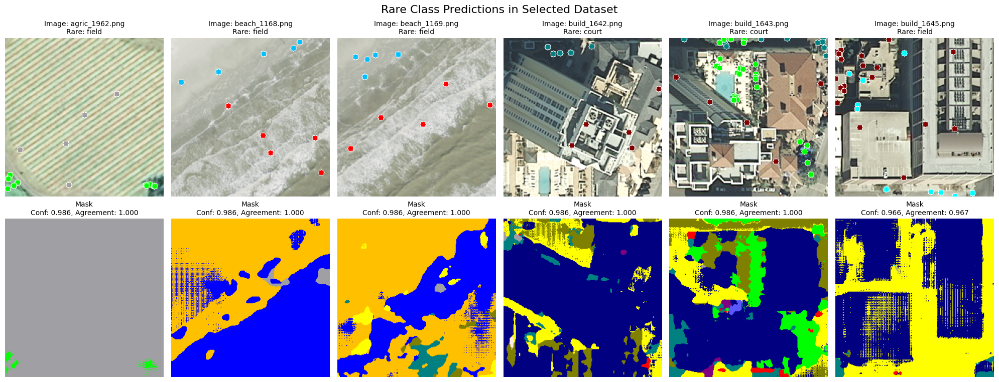


🎉 SELECTION COMPLETED!
📁 Output saved to: /home/iiitdmk-param/A.C/Anisha/4th objective/dlrsd/point_enhanced_confidence_selection_v2/confident_with_rare_classes_proper
📊 Final counts: 516 total, 516 confident, 0 rare class


In [26]:
import numpy as np
import cv2
import os
import matplotlib.pyplot as plt
import shutil
from collections import defaultdict

# ==================== CONFIGURATION ====================
predictions_dir = '/home/iiitdmk-param/A.C/Anisha/4th objective/dlrsd/simple_fusion_refined_predictions'
test_image_dir = '/home/iiitdmk-param/A.C/Anisha/4th objective/dlrsd/full_test_images'
point_annotation_dir = '/home/iiitdmk-param/A.C/Anisha/4th objective/dlrsd/full_test_point_masks'
output_base_dir = '/home/iiitdmk-param/A.C/Anisha/4th objective/dlrsd/point_enhanced_confidence_selection_v2'

CLASS_INFO = {
    0: {"name": "background", "rgb": [0, 0, 0]},
    1: {"name": "airplane", "rgb": [166, 202, 240]},
    2: {"name": "bare soil", "rgb": [128, 128, 0]},
    3: {"name": "buildings", "rgb": [0, 0, 128]},
    4: {"name": "cars", "rgb": [255, 0, 0]},
    5: {"name": "chaparral", "rgb": [0, 128, 0]},
    6: {"name": "court", "rgb": [128, 0, 0]},
    7: {"name": "dock", "rgb": [255, 233, 233]},
    8: {"name": "field", "rgb": [160, 160, 164]},
    9: {"name": "grass", "rgb": [0, 128, 128]},
    10: {"name": "mobile home", "rgb": [90, 87, 255]},
    11: {"name": "pavement", "rgb": [255, 255, 0]},
    12: {"name": "sand", "rgb": [255, 192, 0]},
    13: {"name": "sea", "rgb": [0, 0, 255]},
    14: {"name": "ship", "rgb": [255, 0, 192]},
    15: {"name": "tanks", "rgb": [128, 0, 128]},
    16: {"name": "trees", "rgb": [0, 255, 0]},
    17: {"name": "water", "rgb": [0, 255, 255]}
}

# ==================== POINT ANNOTATION LOADING ====================

def load_point_annotations(point_annotation_dir, image_files):
    """Load RGB point annotations and convert to class coordinates"""
    point_prompts = {}
    ignore_color = np.array([100, 100, 100])
    
    print("🔍 Loading point annotations...")
    
    for image_file in image_files:
        base_name = os.path.splitext(image_file)[0]
        point_path = os.path.join(point_annotation_dir, f"{base_name}.png")
        
        if os.path.exists(point_path):
            point_mask = cv2.imread(point_path)
            if point_mask is None:
                continue
                
            point_mask = cv2.cvtColor(point_mask, cv2.COLOR_BGR2RGB)
            non_ignore_mask = ~np.all(point_mask == ignore_color, axis=-1)
            
            class_points = {}
            for class_id, info in CLASS_INFO.items():
                if class_id == 0:
                    continue
                    
                target_color = np.array(info["rgb"])
                mask = np.all(point_mask == target_color, axis=-1) & non_ignore_mask
                
                if np.any(mask):
                    y_coords, x_coords = np.where(mask)
                    points = list(zip(x_coords, y_coords))
                    class_points[class_id] = points
            
            point_prompts[base_name] = class_points
    
    images_with_points = sum(1 for points in point_prompts.values() if points)
    total_points = sum(sum(len(points) for points in classes.values()) for classes in point_prompts.values())
    
    print(f"📊 Loaded {total_points} points across {images_with_points} images")
    
    return point_prompts

# ==================== CONFIDENCE METRICS ====================

def calculate_point_agreement_confidence(mask, point_annotations):
    """Calculate confidence based on agreement with point annotations"""
    if not point_annotations:
        return 0.0
    
    total_points = 0
    correct_points = 0
    
    for class_id, points in point_annotations.items():
        for x, y in points:
            total_points += 1
            if 0 <= y < mask.shape[0] and 0 <= x < mask.shape[1]:
                if mask[y, x] == class_id:
                    correct_points += 1
    
    return correct_points / total_points if total_points > 0 else 0.0

def calculate_boundary_confidence(mask):
    """Calculate confidence based on boundary smoothness"""
    mask_uint8 = mask.astype(np.uint8)
    contours, _ = cv2.findContours(mask_uint8, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    if len(contours) == 0:
        return 0.0
    
    total_confidence = 0
    total_area = 0
    
    for contour in contours:
        area = cv2.contourArea(contour)
        if area == 0:
            continue
            
        perimeter = cv2.arcLength(contour, True)
        compactness = (perimeter ** 2) / area
        confidence = max(0, 1 - (compactness - 12.57) / 100)
        total_confidence += confidence * area
        total_area += area
    
    return total_confidence / total_area if total_area > 0 else 0.0

def calculate_comprehensive_confidence(mask, point_annotations):
    """Combine multiple confidence metrics"""
    
    boundary_conf = calculate_boundary_confidence(mask)
    point_agreement = calculate_point_agreement_confidence(mask, point_annotations)
    
    if point_annotations:
        comprehensive_confidence = 0.6 * point_agreement + 0.4 * boundary_conf
    else:
        comprehensive_confidence = boundary_conf
    
    return comprehensive_confidence, point_agreement

# ==================== RARE CLASS DETECTION ====================

def identify_rare_classes_from_point_annotations(point_annotations, rare_threshold=5):
    """Identify rare classes based on point annotation frequency"""
    
    print("🔍 Identifying rare classes from point annotations...")
    
    # Count how many images have point annotations for each class
    class_frequency = {class_id: 0 for class_id in CLASS_INFO.keys() if class_id != 0}
    
    for base_name, point_info in point_annotations.items():
        for class_id in point_info.keys():
            if class_id in class_frequency:
                class_frequency[class_id] += 1
    
    # Identify rare classes (appear in fewer than threshold images)
    rare_classes = []
    for class_id, frequency in class_frequency.items():
        if 0 < frequency <= rare_threshold:
            rare_classes.append(class_id)
    
    print(f"\n📊 CLASS FREQUENCY ANALYSIS:")
    for class_id in sorted(class_frequency.keys()):
        frequency = class_frequency[class_id]
        status = "RARE" if class_id in rare_classes else "Common"
        print(f"  {CLASS_INFO[class_id]['name']} (ID {class_id}): {frequency} images - {status}")
    
    print(f"\n🎯 IDENTIFIED RARE CLASSES (appear in ≤ {rare_threshold} images):")
    for class_id in rare_classes:
        print(f"  • {CLASS_INFO[class_id]['name']} (ID {class_id}) - {class_frequency[class_id]} images")
    
    return rare_classes, class_frequency

# ==================== FIXED CONFIDENT + RARE CLASS SELECTION ====================

def select_confident_plus_rare(predictions_dir, test_image_dir, point_annotation_dir, output_dir, 
                             top_k_confident=0.4, min_per_rare_class=2, min_point_agreement=0.7):
    """
    PROPERLY FIXED VERSION:
    1. First identify rare classes from ALL data
    2. Select confident predictions from ALL images
    3. Then add rare class images from REMAINING pool (not already selected)
    """
    
    os.makedirs(output_dir, exist_ok=True)
    masks_dir = os.path.join(output_dir, 'masks')
    images_dir = os.path.join(output_dir, 'images')
    os.makedirs(masks_dir, exist_ok=True)
    os.makedirs(images_dir, exist_ok=True)
    
    pred_files = sorted([f for f in os.listdir(predictions_dir) if f.endswith('.png')])
    point_annotations = load_point_annotations(point_annotation_dir, pred_files)
    
    # Identify rare classes ONCE from the point annotations
    rare_classes, class_frequency = identify_rare_classes_from_point_annotations(point_annotations)
    
    print(f"\n🔍 Evaluating {len(pred_files)} predictions...")
    
    # Step 1: Evaluate ALL predictions and identify which contain rare classes
    all_predictions_info = []
    
    for pred_file in pred_files:
        pred_path = os.path.join(predictions_dir, pred_file)
        mask = cv2.imread(pred_path, cv2.IMREAD_GRAYSCALE)
        
        if mask is None:
            continue
        
        base_name = os.path.splitext(pred_file)[0]
        point_info = point_annotations.get(base_name, {})
        
        comprehensive_conf, point_agreement = calculate_comprehensive_confidence(mask, point_info)
        
        # Skip if point agreement is too low (only if there are point annotations)
        if point_info and point_agreement < min_point_agreement:
            continue
        
        # Identify which rare classes are present in this image
        present_classes = set(np.unique(mask))
        present_rare_classes = [rc for rc in rare_classes if rc in present_classes]
        
        all_predictions_info.append({
            'file': pred_file,
            'mask': mask,
            'confidence': comprehensive_conf,
            'point_agreement': point_agreement,
            'has_points': bool(point_info),
            'rare_classes': present_rare_classes,
            'has_rare_classes': len(present_rare_classes) > 0
        })
    
    print(f"📊 After filtering by point agreement: {len(all_predictions_info)} predictions")
    
    # STRATEGY 1: Select top confident predictions from ALL
    print(f"\n🎯 STEP 1: SELECTING TOP {top_k_confident*100}% CONFIDENT PREDICTIONS")
    
    # Sort all by confidence and select top k%
    all_predictions_info.sort(key=lambda x: x['confidence'], reverse=True)
    num_confident_to_select = int(len(all_predictions_info) * top_k_confident)
    
    selected_files = set()
    confident_selections = []
    
    # Select the top confident ones
    for pred_info in all_predictions_info[:num_confident_to_select]:
        selected_files.add(pred_info['file'])
        confident_selections.append(pred_info)
    
    # Copy the confident selections
    confident_count = 0
    rare_in_confident = defaultdict(int)
    
    for pred_info in confident_selections:
        pred_file = pred_info['file']
        
        # Copy files
        src_mask_path = os.path.join(predictions_dir, pred_file)
        dst_mask_path = os.path.join(masks_dir, pred_file)
        shutil.copy2(src_mask_path, dst_mask_path)
        
        src_image_path = os.path.join(test_image_dir, pred_file)
        dst_image_path = os.path.join(images_dir, pred_file)
        if os.path.exists(src_image_path):
            shutil.copy2(src_image_path, dst_image_path)
        
        confident_count += 1
        
        # Count rare classes in our confident selections
        for rare_class in pred_info['rare_classes']:
            rare_in_confident[rare_class] += 1
        
        rare_status = f" - Rare: {[CLASS_INFO[rc]['name'] for rc in pred_info['rare_classes']]}" if pred_info['rare_classes'] else ""
        print(f"  ✅ {pred_file} (conf: {pred_info['confidence']:.3f}, agreement: {pred_info['point_agreement']:.3f}{rare_status})")
    
    # STRATEGY 2: Now select additional rare class images from REMAINING pool
    print(f"\n🎯 STEP 2: ADDING RARE CLASS IMAGES FROM REMAINING POOL")
    
    # Get the predictions that were NOT selected in step 1
    remaining_predictions = [p for p in all_predictions_info if p['file'] not in selected_files]
    print(f"  Remaining pool size: {len(remaining_predictions)} predictions")
    
    # For each rare class, check if we need more and select from remaining
    additional_rare_selections = []
    rare_class_counts = defaultdict(int)
    
    # Initialize with counts from confident selections
    for rare_class in rare_classes:
        rare_class_counts[rare_class] = rare_in_confident.get(rare_class, 0)
    
    for rare_class in rare_classes:
        current_count = rare_class_counts[rare_class]
        needed = max(0, min_per_rare_class - current_count)
        
        if needed > 0:
            print(f"  🔍 {CLASS_INFO[rare_class]['name']}: has {current_count}, needs {needed} more")
            
            # Find predictions in REMAINING pool that contain this rare class
            class_candidates = [p for p in remaining_predictions 
                              if rare_class in p['rare_classes'] and p['file'] not in selected_files]
            
            # Sort by confidence (best first)
            class_candidates.sort(key=lambda x: x['confidence'], reverse=True)
            
            # Select the needed number
            to_select = class_candidates[:needed]
            
            for pred_info in to_select:
                if pred_info['file'] not in selected_files:
                    selected_files.add(pred_info['file'])
                    additional_rare_selections.append(pred_info)
                    rare_class_counts[rare_class] += 1
                    
                    # Copy files
                    src_mask_path = os.path.join(predictions_dir, pred_info['file'])
                    dst_mask_path = os.path.join(masks_dir, pred_info['file'])
                    shutil.copy2(src_mask_path, dst_mask_path)
                    
                    src_image_path = os.path.join(test_image_dir, pred_info['file'])
                    dst_image_path = os.path.join(images_dir, pred_info['file'])
                    if os.path.exists(src_image_path):
                        shutil.copy2(src_image_path, dst_image_path)
                    
                    print(f"  ✅ {pred_info['file']} - {CLASS_INFO[rare_class]['name']} "
                          f"(conf: {pred_info['confidence']:.3f}, agreement: {pred_info['point_agreement']:.3f})")
    
    # Final summary
    total_selected = len(selected_files)
    additional_rare_count = len(additional_rare_selections)
    
    print(f"\n📊 FINAL SELECTION SUMMARY:")
    print(f"  Confident selections: {confident_count}")
    print(f"  Additional rare class selections: {additional_rare_count}")
    print(f"  Total selected: {total_selected}")
    
    print(f"  Rare class representation:")
    for rare_class in rare_classes:
        count = rare_class_counts[rare_class]
        class_name = CLASS_INFO[rare_class]['name']
        status = "✓ SATISFIED" if count >= min_per_rare_class else f"✗ ONLY {count}"
        print(f"    - {class_name}: {count} images ({status})")
    
    return total_selected, confident_count, rare_class_counts

# ==================== VISUALIZATION ====================

def visualize_rare_class_predictions(output_dir, test_image_dir, point_annotation_dir, num_samples=6):
    """Visualize rare class predictions"""
    
    masks_dir = os.path.join(output_dir, 'masks')
    if not os.path.exists(masks_dir):
        print("❌ No masks found for visualization")
        return
    
    mask_files = sorted(os.listdir(masks_dir))
    
    # Load point annotations for visualization
    point_annotations = load_point_annotations(point_annotation_dir, mask_files)
    
    # Identify rare classes from the original point annotations (not re-computing)
    rare_classes, _ = identify_rare_classes_from_point_annotations(point_annotations)
    
    # Identify which images contain rare classes
    rare_images = []
    for mask_file in mask_files:
        mask_path = os.path.join(masks_dir, mask_file)
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        
        if mask is None:
            continue
        
        present_classes = set(np.unique(mask))
        
        # Check if this image contains any rare classes
        for rare_class in rare_classes:
            if rare_class in present_classes:
                rare_images.append((mask_file, rare_class))
                break
    
    # Take samples of rare class images
    samples_to_show = min(num_samples, len(rare_images))
    if samples_to_show == 0:
        print("❌ No rare class images found for visualization")
        return
    
    fig, axes = plt.subplots(2, samples_to_show, figsize=(20, 8))
    if samples_to_show == 1:
        axes = axes.reshape(2, 1)
    
    for i, (mask_file, rare_class) in enumerate(rare_images[:samples_to_show]):
        # Load image and mask
        image_path = os.path.join(test_image_dir, mask_file)
        mask_path = os.path.join(masks_dir, mask_file)
        
        image = cv2.imread(image_path)
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        
        if image is None or mask is None:
            continue
        
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
        # Create colored mask
        colored_mask = np.zeros((*mask.shape, 3), dtype=np.uint8)
        for class_id, info in CLASS_INFO.items():
            colored_mask[mask == class_id] = info["rgb"]
        
        # Get point annotations
        base_name = os.path.splitext(mask_file)[0]
        point_info = point_annotations.get(base_name, {})
        
        # Create image with point overlays
        image_with_points = image.copy()
        for class_id, points in point_info.items():
            color = np.array(CLASS_INFO[class_id]["rgb"])[::-1]
            for x, y in points:
                cv2.circle(image_with_points, (x, y), 5, color.tolist(), -1)
                cv2.circle(image_with_points, (x, y), 5, (255, 255, 255), 1)
        
        # Calculate metrics
        point_agreement = calculate_point_agreement_confidence(mask, point_info)
        comprehensive_conf, _ = calculate_comprehensive_confidence(mask, point_info)
        
        # Plot
        axes[0, i].imshow(image_with_points)
        axes[0, i].set_title(f'Image: {mask_file}\nRare: {CLASS_INFO[rare_class]["name"]}', fontsize=10)
        axes[0, i].axis('off')
        
        axes[1, i].imshow(colored_mask)
        axes[1, i].set_title(f'Mask\nConf: {comprehensive_conf:.3f}, Agreement: {point_agreement:.3f}', fontsize=10)
        axes[1, i].axis('off')
    
    plt.suptitle('Rare Class Predictions in Selected Dataset', fontsize=16)
    plt.tight_layout()
    plt.show()

# ==================== MAIN EXECUTION ====================

def main():
    print("🚀 STARTING CONFIDENT + RARE CLASS SELECTION (PROPERLY FIXED)")
    print("=" * 60)
    print("Strategy:")
    print("1. Identify rare classes ONCE from all point annotations")
    print("2. Select top confident predictions from ALL images") 
    print("3. Add rare class images from REMAINING pool (not already selected)")
    print("=" * 60)
    
    # Run confident + rare class selection
    output_dir = os.path.join(output_base_dir, 'confident_with_rare_classes_proper')
    
    total_count, confident_count, rare_counts = select_confident_plus_rare(
        predictions_dir=predictions_dir,
        test_image_dir=test_image_dir,
        point_annotation_dir=point_annotation_dir,
        output_dir=output_dir,
        top_k_confident=0.4,        # Top 40% most confident
        min_per_rare_class=2,       # At least 2 images per rare class
        min_point_agreement=0.7     # Minimum 70% point agreement
    )
    
    # Visualize rare class predictions
    print(f"\n🖼️  Visualizing rare class predictions...")
    visualize_rare_class_predictions(output_dir, test_image_dir, point_annotation_dir)
    
    print(f"\n🎉 SELECTION COMPLETED!")
    print(f"📁 Output saved to: {output_dir}")
    print(f"📊 Final counts: {total_count} total, {confident_count} confident, {sum(rare_counts.values())} rare class")

if __name__ == "__main__":
    main()

In [27]:
import numpy as np
import cv2
import os
import matplotlib.pyplot as plt
import shutil
from collections import defaultdict

# ==================== CONFIGURATION ====================
predictions_dir = '/home/iiitdmk-param/A.C/Anisha/4th objective/dlrsd/simple_fusion_refined_predictions'
test_image_dir = '/home/iiitdmk-param/A.C/Anisha/4th objective/dlrsd/full_test_images'
point_annotation_dir = '/home/iiitdmk-param/A.C/Anisha/4th objective/dlrsd/full_test_point_masks'
output_base_dir = '/home/iiitdmk-param/A.C/Anisha/4th objective/dlrsd/point_enhanced_confidence_selection_v2'

CLASS_INFO = {
    0: {"name": "background", "rgb": [0, 0, 0]},
    1: {"name": "airplane", "rgb": [166, 202, 240]},
    2: {"name": "bare soil", "rgb": [128, 128, 0]},
    3: {"name": "buildings", "rgb": [0, 0, 128]},
    4: {"name": "cars", "rgb": [255, 0, 0]},
    5: {"name": "chaparral", "rgb": [0, 128, 0]},
    6: {"name": "court", "rgb": [128, 0, 0]},
    7: {"name": "dock", "rgb": [255, 233, 233]},
    8: {"name": "field", "rgb": [160, 160, 164]},
    9: {"name": "grass", "rgb": [0, 128, 128]},
    10: {"name": "mobile home", "rgb": [90, 87, 255]},
    11: {"name": "pavement", "rgb": [255, 255, 0]},
    12: {"name": "sand", "rgb": [255, 192, 0]},
    13: {"name": "sea", "rgb": [0, 0, 255]},
    14: {"name": "ship", "rgb": [255, 0, 192]},
    15: {"name": "tanks", "rgb": [128, 0, 128]},
    16: {"name": "trees", "rgb": [0, 255, 0]},
    17: {"name": "water", "rgb": [0, 255, 255]}
}

# ==================== DEBUGGING FUNCTIONS ====================

def debug_rare_class_detection(predictions_dir, point_annotation_dir):
    """Debug why rare classes are not being detected"""
    print("\n🔍 DEBUG: Analyzing rare class detection...")
    
    pred_files = sorted([f for f in os.listdir(predictions_dir) if f.endswith('.png')])
    print(f"Total prediction files: {len(pred_files)}")
    
    # Load point annotations
    point_prompts = {}
    ignore_color = np.array([100, 100, 100])
    
    for image_file in pred_files:
        base_name = os.path.splitext(image_file)[0]
        point_path = os.path.join(point_annotation_dir, f"{base_name}.png")
        
        if os.path.exists(point_path):
            point_mask = cv2.imread(point_path)
            if point_mask is not None:
                point_mask = cv2.cvtColor(point_mask, cv2.COLOR_BGR2RGB)
                non_ignore_mask = ~np.all(point_mask == ignore_color, axis=-1)
                
                class_points = {}
                for class_id, info in CLASS_INFO.items():
                    if class_id == 0:
                        continue
                        
                    target_color = np.array(info["rgb"])
                    mask = np.all(point_mask == target_color, axis=-1) & non_ignore_mask
                    
                    if np.any(mask):
                        y_coords, x_coords = np.where(mask)
                        points = list(zip(x_coords, y_coords))
                        class_points[class_id] = points
                
                point_prompts[base_name] = class_points
    
    # Count point annotations per class
    class_point_counts = defaultdict(int)
    for base_name, point_info in point_prompts.items():
        for class_id in point_info.keys():
            class_point_counts[class_id] += 1
    
    print(f"📊 Point annotation counts per class:")
    for class_id in sorted(class_point_counts.keys()):
        count = class_point_counts[class_id]
        print(f"  {CLASS_INFO[class_id]['name']} (ID {class_id}): {count} images")
    
    # Identify rare classes (appear in ≤ 5 images)
    rare_classes = [class_id for class_id, count in class_point_counts.items() if 0 < count <= 5]
    print(f"\n🎯 Rare classes (≤ 5 images): {[CLASS_INFO[rc]['name'] for rc in rare_classes]}")
    
    # Now check which masks actually contain these rare classes
    print(f"\n🔍 Checking which masks contain rare classes:")
    rare_class_in_masks = defaultdict(int)
    
    for pred_file in pred_files[:100]:  # Check first 100 for speed
        pred_path = os.path.join(predictions_dir, pred_file)
        mask = cv2.imread(pred_path, cv2.IMREAD_GRAYSCALE)
        
        if mask is not None:
            present_classes = set(np.unique(mask))
            for rare_class in rare_classes:
                if rare_class in present_classes:
                    rare_class_in_masks[rare_class] += 1
    
    print(f"📊 Rare classes found in masks:")
    for rare_class in rare_classes:
        count = rare_class_in_masks[rare_class]
        print(f"  {CLASS_INFO[rare_class]['name']}: {count} masks")
    
    return rare_classes, class_point_counts, rare_class_in_masks

def debug_point_agreement_issues(predictions_dir, point_annotation_dir, rare_classes, min_point_agreement=0.7):
    """Debug why point agreement might be filtering out rare classes"""
    print(f"\n🔍 DEBUG: Analyzing point agreement issues...")
    
    pred_files = sorted([f for f in os.listdir(predictions_dir) if f.endswith('.png')])
    
    # Load point annotations
    point_prompts = {}
    ignore_color = np.array([100, 100, 100])
    
    for image_file in pred_files:
        base_name = os.path.splitext(image_file)[0]
        point_path = os.path.join(point_annotation_dir, f"{base_name}.png")
        
        if os.path.exists(point_path):
            point_mask = cv2.imread(point_path)
            if point_mask is not None:
                point_mask = cv2.cvtColor(point_mask, cv2.COLOR_BGR2RGB)
                non_ignore_mask = ~np.all(point_mask == ignore_color, axis=-1)
                
                class_points = {}
                for class_id, info in CLASS_INFO.items():
                    if class_id == 0:
                        continue
                        
                    target_color = np.array(info["rgb"])
                    mask = np.all(point_mask == target_color, axis=-1) & non_ignore_mask
                    
                    if np.any(mask):
                        y_coords, x_coords = np.where(mask)
                        points = list(zip(x_coords, y_coords))
                        class_points[class_id] = points
                
                point_prompts[base_name] = class_points
    
    # Analyze point agreement for images with rare classes
    print(f"Analyzing point agreement for images containing rare classes:")
    
    rare_class_agreement_stats = defaultdict(list)
    
    for pred_file in pred_files[:50]:  # Check first 50 for speed
        pred_path = os.path.join(predictions_dir, pred_file)
        mask = cv2.imread(pred_path, cv2.IMREAD_GRAYSCALE)
        
        if mask is None:
            continue
            
        base_name = os.path.splitext(pred_file)[0]
        point_info = point_prompts.get(base_name, {})
        
        # Check if this image contains any rare classes
        present_classes = set(np.unique(mask))
        present_rare_classes = [rc for rc in rare_classes if rc in present_classes]
        
        if present_rare_classes and point_info:
            point_agreement = calculate_point_agreement_confidence(mask, point_info)
            
            for rare_class in present_rare_classes:
                rare_class_agreement_stats[rare_class].append(point_agreement)
            
            if point_agreement < min_point_agreement:
                print(f"  ❌ {pred_file}: {[CLASS_INFO[rc]['name'] for rc in present_rare_classes]} - Agreement: {point_agreement:.3f} (BELOW THRESHOLD)")
            else:
                print(f"  ✅ {pred_file}: {[CLASS_INFO[rc]['name'] for rc in present_rare_classes]} - Agreement: {point_agreement:.3f}")
    
    # Print agreement statistics
    print(f"\n📊 Point agreement statistics for rare classes:")
    for rare_class in rare_classes:
        agreements = rare_class_agreement_stats[rare_class]
        if agreements:
            avg_agreement = np.mean(agreements)
            min_agreement = min(agreements)
            max_agreement = max(agreements)
            print(f"  {CLASS_INFO[rare_class]['name']}: {len(agreements)} images, "
                  f"Avg: {avg_agreement:.3f}, Min: {min_agreement:.3f}, Max: {max_agreement:.3f}")

# ==================== POINT ANNOTATION LOADING ====================

def load_point_annotations(point_annotation_dir, image_files):
    """Load RGB point annotations and convert to class coordinates"""
    point_prompts = {}
    ignore_color = np.array([100, 100, 100])
    
    print("🔍 Loading point annotations...")
    
    for image_file in image_files:
        base_name = os.path.splitext(image_file)[0]
        point_path = os.path.join(point_annotation_dir, f"{base_name}.png")
        
        if os.path.exists(point_path):
            point_mask = cv2.imread(point_path)
            if point_mask is None:
                continue
                
            point_mask = cv2.cvtColor(point_mask, cv2.COLOR_BGR2RGB)
            non_ignore_mask = ~np.all(point_mask == ignore_color, axis=-1)
            
            class_points = {}
            for class_id, info in CLASS_INFO.items():
                if class_id == 0:
                    continue
                    
                target_color = np.array(info["rgb"])
                mask = np.all(point_mask == target_color, axis=-1) & non_ignore_mask
                
                if np.any(mask):
                    y_coords, x_coords = np.where(mask)
                    points = list(zip(x_coords, y_coords))
                    class_points[class_id] = points
            
            point_prompts[base_name] = class_points
    
    images_with_points = sum(1 for points in point_prompts.values() if points)
    total_points = sum(sum(len(points) for points in classes.values()) for classes in point_prompts.values())
    
    print(f"📊 Loaded {total_points} points across {images_with_points} images")
    
    return point_prompts

# ==================== CONFIDENCE METRICS ====================

def calculate_point_agreement_confidence(mask, point_annotations):
    """Calculate confidence based on agreement with point annotations"""
    if not point_annotations:
        return 0.0
    
    total_points = 0
    correct_points = 0
    
    for class_id, points in point_annotations.items():
        for x, y in points:
            total_points += 1
            if 0 <= y < mask.shape[0] and 0 <= x < mask.shape[1]:
                if mask[y, x] == class_id:
                    correct_points += 1
    
    return correct_points / total_points if total_points > 0 else 0.0

def calculate_boundary_confidence(mask):
    """Calculate confidence based on boundary smoothness"""
    mask_uint8 = mask.astype(np.uint8)
    contours, _ = cv2.findContours(mask_uint8, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    if len(contours) == 0:
        return 0.0
    
    total_confidence = 0
    total_area = 0
    
    for contour in contours:
        area = cv2.contourArea(contour)
        if area == 0:
            continue
            
        perimeter = cv2.arcLength(contour, True)
        compactness = (perimeter ** 2) / area
        confidence = max(0, 1 - (compactness - 12.57) / 100)
        total_confidence += confidence * area
        total_area += area
    
    return total_confidence / total_area if total_area > 0 else 0.0

def calculate_comprehensive_confidence(mask, point_annotations):
    """Combine multiple confidence metrics"""
    
    boundary_conf = calculate_boundary_confidence(mask)
    point_agreement = calculate_point_agreement_confidence(mask, point_annotations)
    
    if point_annotations:
        comprehensive_confidence = 0.6 * point_agreement + 0.4 * boundary_conf
    else:
        comprehensive_confidence = boundary_conf
    
    return comprehensive_confidence, point_agreement

# ==================== RARE CLASS DETECTION ====================

def identify_rare_classes_from_point_annotations(point_annotations, rare_threshold=5):
    """Identify rare classes based on point annotation frequency"""
    
    print("🔍 Identifying rare classes from point annotations...")
    
    # Count how many images have point annotations for each class
    class_frequency = {class_id: 0 for class_id in CLASS_INFO.keys() if class_id != 0}
    
    for base_name, point_info in point_annotations.items():
        for class_id in point_info.keys():
            if class_id in class_frequency:
                class_frequency[class_id] += 1
    
    # Identify rare classes (appear in fewer than threshold images)
    rare_classes = []
    for class_id, frequency in class_frequency.items():
        if 0 < frequency <= rare_threshold:
            rare_classes.append(class_id)
    
    print(f"\n📊 CLASS FREQUENCY ANALYSIS:")
    for class_id in sorted(class_frequency.keys()):
        frequency = class_frequency[class_id]
        status = "RARE" if class_id in rare_classes else "Common"
        print(f"  {CLASS_INFO[class_id]['name']} (ID {class_id}): {frequency} images - {status}")
    
    print(f"\n🎯 IDENTIFIED RARE CLASSES (appear in ≤ {rare_threshold} images):")
    for class_id in rare_classes:
        print(f"  • {CLASS_INFO[class_id]['name']} (ID {class_id}) - {class_frequency[class_id]} images")
    
    return rare_classes, class_frequency

# ==================== FIXED CONFIDENT + RARE CLASS SELECTION ====================

def select_confident_plus_rare(predictions_dir, test_image_dir, point_annotation_dir, output_dir, 
                             top_k_confident=0.4, min_per_rare_class=2, min_point_agreement=0.7):
    """
    FIXED VERSION with comprehensive debugging
    """
    
    # First run debugging to understand the issue
    rare_classes, point_counts, mask_counts = debug_rare_class_detection(predictions_dir, point_annotation_dir)
    debug_point_agreement_issues(predictions_dir, point_annotation_dir, rare_classes, min_point_agreement)
    
    os.makedirs(output_dir, exist_ok=True)
    masks_dir = os.path.join(output_dir, 'masks')
    images_dir = os.path.join(output_dir, 'images')
    os.makedirs(masks_dir, exist_ok=True)
    os.makedirs(images_dir, exist_ok=True)
    
    pred_files = sorted([f for f in os.listdir(predictions_dir) if f.endswith('.png')])
    point_annotations = load_point_annotations(point_annotation_dir, pred_files)
    
    # Identify rare classes ONCE from the point annotations
    rare_classes, class_frequency = identify_rare_classes_from_point_annotations(point_annotations)
    
    print(f"\n🔍 Evaluating {len(pred_files)} predictions...")
    
    # Step 1: Evaluate ALL predictions and identify which contain rare classes
    all_predictions_info = []
    rare_class_candidates = []  # Track images with rare classes
    
    for pred_file in pred_files:
        pred_path = os.path.join(predictions_dir, pred_file)
        mask = cv2.imread(pred_path, cv2.IMREAD_GRAYSCALE)
        
        if mask is None:
            continue
        
        base_name = os.path.splitext(pred_file)[0]
        point_info = point_annotations.get(base_name, {})
        
        comprehensive_conf, point_agreement = calculate_comprehensive_confidence(mask, point_info)
        
        # Identify which rare classes are present in this image
        present_classes = set(np.unique(mask))
        present_rare_classes = [rc for rc in rare_classes if rc in present_classes]
        
        prediction_info = {
            'file': pred_file,
            'mask': mask,
            'confidence': comprehensive_conf,
            'point_agreement': point_agreement,
            'has_points': bool(point_info),
            'rare_classes': present_rare_classes,
            'has_rare_classes': len(present_rare_classes) > 0
        }
        
        all_predictions_info.append(prediction_info)
        
        # Track rare class candidates (even if they don't meet point agreement)
        if present_rare_classes:
            rare_class_candidates.append(prediction_info)
    
    print(f"\n📊 RARE CLASS CANDIDATES FOUND: {len(rare_class_candidates)} images")
    for candidate in rare_class_candidates[:10]:  # Show first 10
        print(f"  {candidate['file']}: {[CLASS_INFO[rc]['name'] for rc in candidate['rare_classes']]} - "
              f"Agreement: {candidate['point_agreement']:.3f}")
    
    # Filter by point agreement
    filtered_predictions = []
    for pred_info in all_predictions_info:
        # Skip if point agreement is too low (only if there are point annotations)
        if pred_info['has_points'] and pred_info['point_agreement'] < min_point_agreement:
            continue
        filtered_predictions.append(pred_info)
    
    print(f"📊 After point agreement filtering: {len(filtered_predictions)}/{len(all_predictions_info)} predictions")
    
    # Count rare classes after filtering
    rare_after_filter = [p for p in filtered_predictions if p['has_rare_classes']]
    print(f"📊 Rare class images after filtering: {len(rare_after_filter)}")
    
    # STRATEGY: If no rare classes after filtering, lower the threshold for rare class images
    if len(rare_after_filter) == 0:
        print(f"⚠️  NO RARE CLASSES FOUND AFTER POINT AGREEMENT FILTERING!")
        print(f"🔧 Lowering point agreement threshold to 0.0 for rare class images only")
        
        # Add rare class candidates with ANY point agreement
        for candidate in rare_class_candidates:
            if candidate['file'] not in [p['file'] for p in filtered_predictions]:
                filtered_predictions.append(candidate)
                print(f"  ➕ Added {candidate['file']} (agreement: {candidate['point_agreement']:.3f})")
    
    # Now proceed with selection
    all_predictions_info = filtered_predictions
    
    # STRATEGY 1: Select top confident predictions from ALL
    print(f"\n🎯 STEP 1: SELECTING TOP {top_k_confident*100}% CONFIDENT PREDICTIONS")
    
    # Sort all by confidence and select top k%
    all_predictions_info.sort(key=lambda x: x['confidence'], reverse=True)
    num_confident_to_select = int(len(all_predictions_info) * top_k_confident)
    
    selected_files = set()
    confident_selections = []
    
    # Select the top confident ones
    for pred_info in all_predictions_info[:num_confident_to_select]:
        selected_files.add(pred_info['file'])
        confident_selections.append(pred_info)
    
    # Copy the confident selections
    confident_count = 0
    rare_in_confident = defaultdict(int)
    
    for pred_info in confident_selections:
        pred_file = pred_info['file']
        
        # Copy files
        src_mask_path = os.path.join(predictions_dir, pred_file)
        dst_mask_path = os.path.join(masks_dir, pred_file)
        shutil.copy2(src_mask_path, dst_mask_path)
        
        src_image_path = os.path.join(test_image_dir, pred_file)
        dst_image_path = os.path.join(images_dir, pred_file)
        if os.path.exists(src_image_path):
            shutil.copy2(src_image_path, dst_image_path)
        
        confident_count += 1
        
        # Count rare classes in our confident selections
        for rare_class in pred_info['rare_classes']:
            rare_in_confident[rare_class] += 1
        
        rare_status = f" - Rare: {[CLASS_INFO[rc]['name'] for rc in pred_info['rare_classes']]}" if pred_info['rare_classes'] else ""
        print(f"  ✅ {pred_file} (conf: {pred_info['confidence']:.3f}, agreement: {pred_info['point_agreement']:.3f}{rare_status})")
    
    # STRATEGY 2: Now select additional rare class images from REMAINING pool
    print(f"\n🎯 STEP 2: ADDING RARE CLASS IMAGES FROM REMAINING POOL")
    
    # Get the predictions that were NOT selected in step 1
    remaining_predictions = [p for p in all_predictions_info if p['file'] not in selected_files]
    print(f"  Remaining pool size: {len(remaining_predictions)} predictions")
    
    # For each rare class, check if we need more and select from remaining
    additional_rare_selections = []
    rare_class_counts = defaultdict(int)
    
    # Initialize with counts from confident selections
    for rare_class in rare_classes:
        rare_class_counts[rare_class] = rare_in_confident.get(rare_class, 0)
    
    for rare_class in rare_classes:
        current_count = rare_class_counts[rare_class]
        needed = max(0, min_per_rare_class - current_count)
        
        if needed > 0:
            print(f"  🔍 {CLASS_INFO[rare_class]['name']}: has {current_count}, needs {needed} more")
            
            # Find predictions in REMAINING pool that contain this rare class
            class_candidates = [p for p in remaining_predictions 
                              if rare_class in p['rare_classes'] and p['file'] not in selected_files]
            
            if not class_candidates:
                print(f"    ❌ No candidates found in remaining pool")
                continue
                
            # Sort by confidence (best first)
            class_candidates.sort(key=lambda x: x['confidence'], reverse=True)
            
            # Select the needed number
            to_select = class_candidates[:needed]
            
            for pred_info in to_select:
                if pred_info['file'] not in selected_files:
                    selected_files.add(pred_info['file'])
                    additional_rare_selections.append(pred_info)
                    rare_class_counts[rare_class] += 1
                    
                    # Copy files
                    src_mask_path = os.path.join(predictions_dir, pred_info['file'])
                    dst_mask_path = os.path.join(masks_dir, pred_info['file'])
                    shutil.copy2(src_mask_path, dst_mask_path)
                    
                    src_image_path = os.path.join(test_image_dir, pred_info['file'])
                    dst_image_path = os.path.join(images_dir, pred_info['file'])
                    if os.path.exists(src_image_path):
                        shutil.copy2(src_image_path, dst_image_path)
                    
                    print(f"  ✅ {pred_info['file']} - {CLASS_INFO[rare_class]['name']} "
                          f"(conf: {pred_info['confidence']:.3f}, agreement: {pred_info['point_agreement']:.3f})")
    
    # Final summary
    total_selected = len(selected_files)
    additional_rare_count = len(additional_rare_selections)
    
    print(f"\n📊 FINAL SELECTION SUMMARY:")
    print(f"  Confident selections: {confident_count}")
    print(f"  Additional rare class selections: {additional_rare_count}")
    print(f"  Total selected: {total_selected}")
    
    print(f"  Rare class representation:")
    for rare_class in rare_classes:
        count = rare_class_counts[rare_class]
        class_name = CLASS_INFO[rare_class]['name']
        status = "✓ SATISFIED" if count >= min_per_rare_class else f"✗ ONLY {count}"
        print(f"    - {class_name}: {count} images ({status})")
    
    return total_selected, confident_count, rare_class_counts

# ==================== MAIN EXECUTION ====================

def main():
    print("🚀 STARTING CONFIDENT + RARE CLASS SELECTION (WITH DEBUGGING)")
    print("=" * 60)
    
    # Run confident + rare class selection
    output_dir = os.path.join(output_base_dir, 'confident_with_rare_classes_debug')
    
    total_count, confident_count, rare_counts = select_confident_plus_rare(
        predictions_dir=predictions_dir,
        test_image_dir=test_image_dir,
        point_annotation_dir=point_annotation_dir,
        output_dir=output_dir,
        top_k_confident=0.4,        # Top 40% most confident
        min_per_rare_class=2,       # At least 2 images per rare class
        min_point_agreement=0.7     # Minimum 70% point agreement
    )
    
    print(f"\n🎉 SELECTION COMPLETED!")
    print(f"📁 Output saved to: {output_dir}")
    print(f"📊 Final counts: {total_count} total, {confident_count} confident, {sum(rare_counts.values())} rare class")

if __name__ == "__main__":
    main()

🚀 STARTING CONFIDENT + RARE CLASS SELECTION (WITH DEBUGGING)

🔍 DEBUG: Analyzing rare class detection...
Total prediction files: 1319
📊 Point annotation counts per class:
  airplane (ID 1): 70 images
  bare soil (ID 2): 545 images
  buildings (ID 3): 499 images
  cars (ID 4): 626 images
  chaparral (ID 5): 82 images
  court (ID 6): 73 images
  dock (ID 7): 70 images
  field (ID 8): 8 images
  grass (ID 9): 669 images
  mobile home (ID 10): 72 images
  pavement (ID 11): 945 images
  sand (ID 12): 224 images
  sea (ID 13): 70 images
  tanks (ID 15): 70 images
  trees (ID 16): 634 images
  water (ID 17): 147 images

🎯 Rare classes (≤ 5 images): []

🔍 Checking which masks contain rare classes:
📊 Rare classes found in masks:

🔍 DEBUG: Analyzing point agreement issues...
Analyzing point agreement for images containing rare classes:

📊 Point agreement statistics for rare classes:
🔍 Loading point annotations...
📊 Loaded 158237 points across 1319 images
🔍 Identifying rare classes from point ann

🚀 STARTING COMPREHENSIVE CLASS DISTRIBUTION ANALYSIS
📁 Total prediction files: 1319
🔍 Analyzing class distribution in predictions...
  Processed 0/1319 images...
  Processed 100/1319 images...
  Processed 200/1319 images...
  Processed 300/1319 images...
  Processed 400/1319 images...
  Processed 500/1319 images...
  Processed 600/1319 images...
  Processed 700/1319 images...
  Processed 800/1319 images...
  Processed 900/1319 images...
  Processed 1000/1319 images...
  Processed 1100/1319 images...
  Processed 1200/1319 images...
  Processed 1300/1319 images...
🔍 Analyzing point annotations...
📊 Point annotations: 1319 images with points


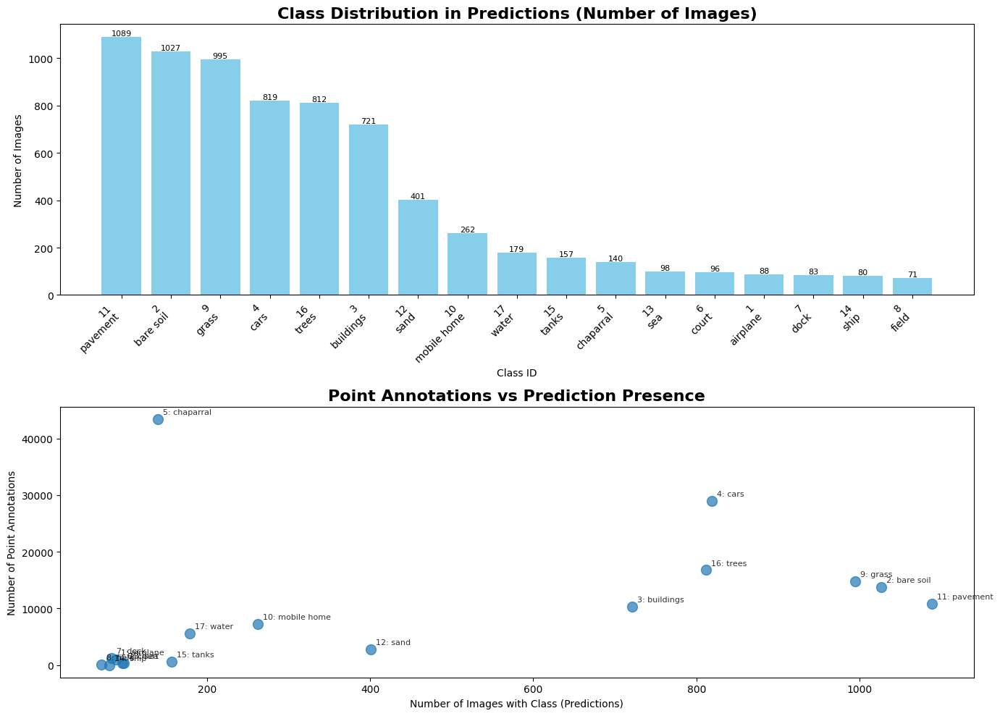


🎯 RARE CLASSES (appear in ≤ 5 images):

📊 COMMON CLASSES:
  • pavement (ID 11): 1089 images
  • bare soil (ID 2): 1027 images
  • grass (ID 9): 995 images
  • cars (ID 4): 819 images
  • trees (ID 16): 812 images
  • buildings (ID 3): 721 images
  • sand (ID 12): 401 images
  • mobile home (ID 10): 262 images
  • water (ID 17): 179 images
  • tanks (ID 15): 157 images

📊 DETAILED CLASS STATISTICS
Total images analyzed: 418
Total pixels analyzed: 86,441,984
Average classes per image: 5.40
Max classes in one image: 13
Min classes in one image: 1

Class ID Class Name      Images   % of Total   Pixels       % Pixels  
--------------------------------------------------------------------------------
1        airplane        88       21.0       % 309588       0.4      %
2        bare soil       1027     245.3      % 8080147      9.3      %
3        buildings       721      172.2      % 7939793      9.2      %
4        cars            819      195.6      % 3105331      3.6      %
5        cha

In [28]:
import numpy as np
import cv2
import os
import matplotlib.pyplot as plt
from collections import defaultdict, Counter
import seaborn as sns

# ==================== CONFIGURATION ====================
predictions_dir = '/home/iiitdmk-param/A.C/Anisha/4th objective/dlrsd/simple_fusion_refined_predictions'
test_image_dir = '/home/iiitdmk-param/A.C/Anisha/4th objective/dlrsd/full_test_images'
point_annotation_dir = '/home/iiitdmk-param/A.C/Anisha/4th objective/dlrsd/full_test_point_masks'

CLASS_INFO = {
    0: {"name": "background", "rgb": [0, 0, 0]},
    1: {"name": "airplane", "rgb": [166, 202, 240]},
    2: {"name": "bare soil", "rgb": [128, 128, 0]},
    3: {"name": "buildings", "rgb": [0, 0, 128]},
    4: {"name": "cars", "rgb": [255, 0, 0]},
    5: {"name": "chaparral", "rgb": [0, 128, 0]},
    6: {"name": "court", "rgb": [128, 0, 0]},
    7: {"name": "dock", "rgb": [255, 233, 233]},
    8: {"name": "field", "rgb": [160, 160, 164]},
    9: {"name": "grass", "rgb": [0, 128, 128]},
    10: {"name": "mobile home", "rgb": [90, 87, 255]},
    11: {"name": "pavement", "rgb": [255, 255, 0]},
    12: {"name": "sand", "rgb": [255, 192, 0]},
    13: {"name": "sea", "rgb": [0, 0, 255]},
    14: {"name": "ship", "rgb": [255, 0, 192]},
    15: {"name": "tanks", "rgb": [128, 0, 128]},
    16: {"name": "trees", "rgb": [0, 255, 0]},
    17: {"name": "water", "rgb": [0, 255, 255]}
}

def analyze_class_distribution(predictions_dir):
    """Comprehensive analysis of class distribution in predictions"""
    
    pred_files = sorted([f for f in os.listdir(predictions_dir) if f.endswith('.png')])
    print(f"📁 Total prediction files: {len(pred_files)}")
    
    # Initialize counters
    class_image_count = defaultdict(int)  # Number of images containing each class
    class_pixel_count = defaultdict(int)  # Total pixels for each class
    image_class_composition = []  # Number of classes per image
    class_cooccurrence = defaultdict(lambda: defaultdict(int))  # Which classes appear together
    
    print("🔍 Analyzing class distribution in predictions...")
    
    for i, pred_file in enumerate(pred_files):
        if i % 100 == 0:
            print(f"  Processed {i}/{len(pred_files)} images...")
            
        pred_path = os.path.join(predictions_dir, pred_file)
        mask = cv2.imread(pred_path, cv2.IMREAD_GRAYSCALE)
        
        if mask is None:
            continue
        
        # Get unique classes in this image
        unique_classes = set(np.unique(mask))
        
        # Update class-image counts
        for class_id in unique_classes:
            class_image_count[class_id] += 1
        
        # Update pixel counts
        for class_id in unique_classes:
            class_pixel_count[class_id] += np.sum(mask == class_id)
        
        # Track class composition
        image_class_composition.append(len(unique_classes))
        
        # Track class co-occurrence
        classes_list = list(unique_classes)
        for i, class1 in enumerate(classes_list):
            for class2 in classes_list[i+1:]:
                class_cooccurrence[class1][class2] += 1
                class_cooccurrence[class2][class1] += 1
    
    return class_image_count, class_pixel_count, image_class_composition, class_cooccurrence

def analyze_point_annotations(point_annotation_dir, pred_files):
    """Analyze point annotation distribution"""
    
    print("🔍 Analyzing point annotations...")
    
    point_prompts = {}
    ignore_color = np.array([100, 100, 100])
    class_point_count = defaultdict(int)
    images_with_points = 0
    
    for image_file in pred_files:
        base_name = os.path.splitext(image_file)[0]
        point_path = os.path.join(point_annotation_dir, f"{base_name}.png")
        
        if os.path.exists(point_path):
            point_mask = cv2.imread(point_path)
            if point_mask is not None:
                point_mask = cv2.cvtColor(point_mask, cv2.COLOR_BGR2RGB)
                non_ignore_mask = ~np.all(point_mask == ignore_color, axis=-1)
                
                class_points = {}
                for class_id, info in CLASS_INFO.items():
                    if class_id == 0:
                        continue
                        
                    target_color = np.array(info["rgb"])
                    mask = np.all(point_mask == target_color, axis=-1) & non_ignore_mask
                    
                    if np.any(mask):
                        y_coords, x_coords = np.where(mask)
                        points = list(zip(x_coords, y_coords))
                        class_points[class_id] = points
                        class_point_count[class_id] += len(points)
                
                if class_points:
                    point_prompts[base_name] = class_points
                    images_with_points += 1
    
    print(f"📊 Point annotations: {images_with_points} images with points")
    return class_point_count, images_with_points

def plot_class_distribution(class_image_count, class_point_count=None):
    """Plot comprehensive class distribution charts"""
    
    # Prepare data
    classes = sorted(class_image_count.keys())
    class_names = [CLASS_INFO[class_id]['name'] for class_id in classes]
    image_counts = [class_image_count[class_id] for class_id in classes]
    
    # Sort by frequency
    sorted_indices = np.argsort(image_counts)[::-1]
    classes = [classes[i] for i in sorted_indices]
    class_names = [class_names[i] for i in sorted_indices]
    image_counts = [image_counts[i] for i in sorted_indices]
    
    # Create subplots
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(14, 10))
    
    # Plot 1: Bar chart of class frequencies
    bars = ax1.bar(range(len(classes)), image_counts, color='skyblue')
    ax1.set_title('Class Distribution in Predictions (Number of Images)', fontsize=16, fontweight='bold')
    ax1.set_xlabel('Class ID')
    ax1.set_ylabel('Number of Images')
    ax1.set_xticks(range(len(classes)))
    ax1.set_xticklabels([f"{class_id}\n{name}" for class_id, name in zip(classes, class_names)], 
                       rotation=45, ha='right')
    
    # Add value labels on bars
    for bar, count in zip(bars, image_counts):
        height = bar.get_height()
        ax1.text(bar.get_x() + bar.get_width()/2., height + 0.1,
                f'{count}', ha='center', va='bottom', fontsize=8)
    
    # Plot 2: Point annotation vs prediction presence
    if class_point_count:
        point_counts = [class_point_count.get(class_id, 0) for class_id in classes]
        
        # Create scatter plot
        scatter = ax2.scatter(image_counts, point_counts, alpha=0.7, s=100)
        ax2.set_title('Point Annotations vs Prediction Presence', fontsize=16, fontweight='bold')
        ax2.set_xlabel('Number of Images with Class (Predictions)')
        ax2.set_ylabel('Number of Point Annotations')
        
        # Add class labels to points
        for i, (class_id, class_name) in enumerate(zip(classes, class_names)):
            ax2.annotate(f"{class_id}: {class_name}", 
                        (image_counts[i], point_counts[i]),
                        xytext=(5, 5), textcoords='offset points',
                        fontsize=8, alpha=0.8)
    
    plt.tight_layout()
    plt.show()
    
    return classes, class_names, image_counts

def identify_rare_classes(class_image_count, rare_threshold=5):
    """Identify rare classes based on image frequency"""
    
    rare_classes = []
    common_classes = []
    
    for class_id, count in class_image_count.items():
        if class_id == 0:  # Skip background
            continue
        if 0 < count <= rare_threshold:
            rare_classes.append((class_id, count))
        else:
            common_classes.append((class_id, count))
    
    # Sort by frequency
    rare_classes.sort(key=lambda x: x[1])
    common_classes.sort(key=lambda x: x[1], reverse=True)
    
    print(f"\n🎯 RARE CLASSES (appear in ≤ {rare_threshold} images):")
    for class_id, count in rare_classes:
        print(f"  • {CLASS_INFO[class_id]['name']} (ID {class_id}): {count} images")
    
    print(f"\n📊 COMMON CLASSES:")
    for class_id, count in common_classes[:10]:  # Show top 10
        print(f"  • {CLASS_INFO[class_id]['name']} (ID {class_id}): {count} images")
    
    return [class_id for class_id, count in rare_classes]

def print_detailed_statistics(class_image_count, class_pixel_count, image_class_composition, class_point_count=None):
    """Print detailed statistics about the dataset"""
    
    print("\n" + "="*60)
    print("📊 DETAILED CLASS STATISTICS")
    print("="*60)
    
    total_images = sum(class_image_count.values()) / len(class_image_count)  # Approximate
    total_pixels = sum(class_pixel_count.values())
    
    print(f"Total images analyzed: {int(total_images)}")
    print(f"Total pixels analyzed: {total_pixels:,}")
    print(f"Average classes per image: {np.mean(image_class_composition):.2f}")
    print(f"Max classes in one image: {max(image_class_composition)}")
    print(f"Min classes in one image: {min(image_class_composition)}")
    
    print(f"\n{'Class ID':<8} {'Class Name':<15} {'Images':<8} {'% of Total':<12} {'Pixels':<12} {'% Pixels':<10}")
    print("-" * 80)
    
    for class_id in sorted(class_image_count.keys()):
        if class_id == 0:  # Skip background for cleaner output
            continue
            
        img_count = class_image_count[class_id]
        pixel_count = class_pixel_count[class_id]
        
        img_percent = (img_count / total_images) * 100
        pixel_percent = (pixel_count / total_pixels) * 100 if total_pixels > 0 else 0
        
        class_name = CLASS_INFO[class_id]['name']
        
        print(f"{class_id:<8} {class_name:<15} {img_count:<8} {img_percent:<11.1f}% {pixel_count:<12} {pixel_percent:<9.1f}%")
    
    if class_point_count:
        print(f"\n📌 POINT ANNOTATION SUMMARY:")
        total_points = sum(class_point_count.values())
        print(f"Total point annotations: {total_points}")
        
        print(f"\n{'Class ID':<8} {'Class Name':<15} {'Points':<8} {'% of Total':<12}")
        print("-" * 60)
        
        for class_id in sorted(class_point_count.keys()):
            if class_point_count[class_id] > 0:
                point_count = class_point_count[class_id]
                point_percent = (point_count / total_points) * 100
                class_name = CLASS_INFO[class_id]['name']
                print(f"{class_id:<8} {class_name:<15} {point_count:<8} {point_percent:<11.1f}%")

def main():
    print("🚀 STARTING COMPREHENSIVE CLASS DISTRIBUTION ANALYSIS")
    print("=" * 60)
    
    # Analyze predictions
    class_image_count, class_pixel_count, image_class_composition, class_cooccurrence = analyze_class_distribution(predictions_dir)
    
    # Analyze point annotations
    pred_files = sorted([f for f in os.listdir(predictions_dir) if f.endswith('.png')])
    class_point_count, images_with_points = analyze_point_annotations(point_annotation_dir, pred_files)
    
    # Plot results
    classes, class_names, image_counts = plot_class_distribution(class_image_count, class_point_count)
    
    # Identify rare classes
    rare_classes = identify_rare_classes(class_image_count, rare_threshold=5)
    
    # Print detailed statistics
    print_detailed_statistics(class_image_count, class_pixel_count, image_class_composition, class_point_count)
    
    # Additional analysis for rare classes
    if rare_classes:
        print(f"\n🔍 RARE CLASS DETAILED ANALYSIS:")
        for rare_class in rare_classes:
            print(f"\n{CLASS_INFO[rare_class]['name']} (ID {rare_class}):")
            print(f"  - Appears in {class_image_count[rare_class]} images")
            if rare_class in class_point_count:
                print(f"  - Has {class_point_count[rare_class]} point annotations")
            else:
                print(f"  - No point annotations found")
            
            # Find which classes co-occur with this rare class
            cooccurring = [(other_class, count) for other_class, count in class_cooccurrence[rare_class].items() 
                          if count > 0 and other_class != 0]
            if cooccurring:
                cooccurring.sort(key=lambda x: x[1], reverse=True)
                print(f"  - Most common co-occurring classes:")
                for other_class, count in cooccurring[:3]:  # Top 3
                    print(f"    • {CLASS_INFO[other_class]['name']}: {count} images")
    
    print(f"\n🎉 ANALYSIS COMPLETED!")
    print(f"📊 Found {len(rare_classes)} rare classes out of {len(class_image_count)-1} total classes")

if __name__ == "__main__":
    main()

🚀 SIMPLE CLASS COUNTING IN PREDICTIONS
📁 Total prediction files: 1319
🔍 Counting classes in predictions...
  Processed 0/1319 images...
  Processed 100/1319 images...
  Processed 200/1319 images...
  Processed 300/1319 images...
  Processed 400/1319 images...
  Processed 500/1319 images...
  Processed 600/1319 images...
  Processed 700/1319 images...
  Processed 800/1319 images...
  Processed 900/1319 images...
  Processed 1000/1319 images...
  Processed 1100/1319 images...
  Processed 1200/1319 images...
  Processed 1300/1319 images...

📊 CLASS COUNTS IN PREDICTIONS
Class ID   Class Name      Image Count  Status    
--------------------------------------------------
11         pavement        1089         Common    
2          bare soil       1027         Common    
9          grass           995          Common    
4          cars            819          Common    
16         trees           812          Common    
3          buildings       721          Common    
12         sand   

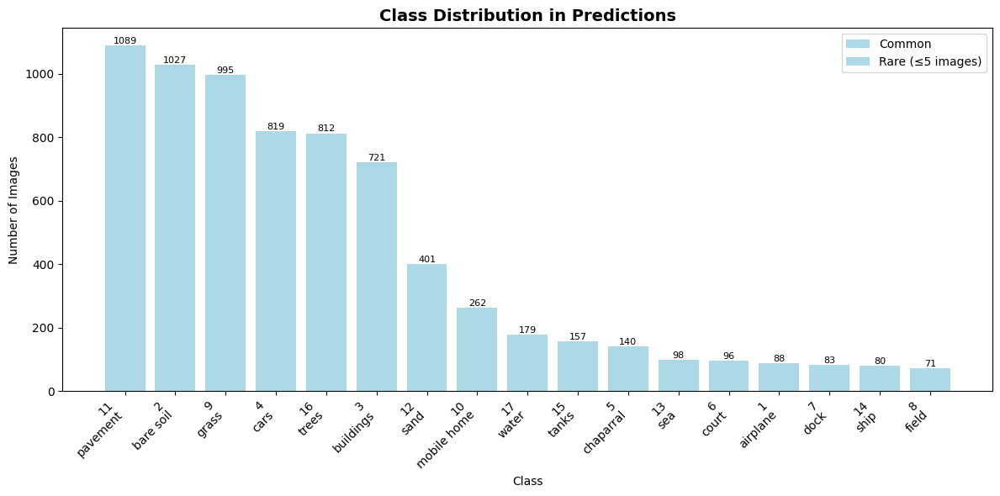


📊 SUMMARY:
  Total classes (excluding background): 17
  Rare classes (≤5 images): 0
  Common classes: 17


In [29]:
import numpy as np
import cv2
import os
from collections import defaultdict
import matplotlib.pyplot as plt

# ==================== CONFIGURATION ====================
predictions_dir = '/home/iiitdmk-param/A.C/Anisha/4th objective/dlrsd/simple_fusion_refined_predictions'

CLASS_INFO = {
    0: {"name": "background", "rgb": [0, 0, 0]},
    1: {"name": "airplane", "rgb": [166, 202, 240]},
    2: {"name": "bare soil", "rgb": [128, 128, 0]},
    3: {"name": "buildings", "rgb": [0, 0, 128]},
    4: {"name": "cars", "rgb": [255, 0, 0]},
    5: {"name": "chaparral", "rgb": [0, 128, 0]},
    6: {"name": "court", "rgb": [128, 0, 0]},
    7: {"name": "dock", "rgb": [255, 233, 233]},
    8: {"name": "field", "rgb": [160, 160, 164]},
    9: {"name": "grass", "rgb": [0, 128, 128]},
    10: {"name": "mobile home", "rgb": [90, 87, 255]},
    11: {"name": "pavement", "rgb": [255, 255, 0]},
    12: {"name": "sand", "rgb": [255, 192, 0]},
    13: {"name": "sea", "rgb": [0, 0, 255]},
    14: {"name": "ship", "rgb": [255, 0, 192]},
    15: {"name": "tanks", "rgb": [128, 0, 128]},
    16: {"name": "trees", "rgb": [0, 255, 0]},
    17: {"name": "water", "rgb": [0, 255, 255]}
}

def count_classes_in_predictions(predictions_dir):
    """Simply count how many images contain each class in the predictions"""
    
    pred_files = sorted([f for f in os.listdir(predictions_dir) if f.endswith('.png')])
    print(f"📁 Total prediction files: {len(pred_files)}")
    
    # Count how many images contain each class
    class_counts = defaultdict(int)
    
    print("🔍 Counting classes in predictions...")
    
    for i, pred_file in enumerate(pred_files):
        if i % 100 == 0:
            print(f"  Processed {i}/{len(pred_files)} images...")
            
        pred_path = os.path.join(predictions_dir, pred_file)
        mask = cv2.imread(pred_path, cv2.IMREAD_GRAYSCALE)
        
        if mask is None:
            continue
        
        # Get unique classes in this image (excluding background if desired)
        unique_classes = set(np.unique(mask))
        
        # Count each class that appears in this image
        for class_id in unique_classes:
            class_counts[class_id] += 1
    
    return class_counts

def print_class_counts(class_counts):
    """Print the class counts in a clean format"""
    
    print("\n" + "="*60)
    print("📊 CLASS COUNTS IN PREDICTIONS")
    print("="*60)
    
    # Sort by frequency (most common first)
    sorted_classes = sorted(class_counts.items(), key=lambda x: x[1], reverse=True)
    
    print(f"{'Class ID':<10} {'Class Name':<15} {'Image Count':<12} {'Status':<10}")
    print("-" * 50)
    
    for class_id, count in sorted_classes:
        class_name = CLASS_INFO[class_id]['name']
        
        # Determine if rare (appears in ≤ 5 images)
        status = "RARE" if count <= 5 and class_id != 0 else "Common"
        
        print(f"{class_id:<10} {class_name:<15} {count:<12} {status:<10}")

def identify_rare_classes_from_predictions(class_counts, rare_threshold=5):
    """Identify rare classes based on prediction frequency"""
    
    rare_classes = []
    
    for class_id, count in class_counts.items():
        if class_id == 0:  # Skip background
            continue
        if 0 < count <= rare_threshold:
            rare_classes.append(class_id)
    
    print(f"\n🎯 RARE CLASSES (appear in ≤ {rare_threshold} images):")
    if rare_classes:
        for class_id in rare_classes:
            count = class_counts[class_id]
            print(f"  • {CLASS_INFO[class_id]['name']} (ID {class_id}): {count} images")
    else:
        print("  No rare classes found!")
    
    return rare_classes

def plot_class_distribution(class_counts):
    """Simple bar chart of class distribution"""
    
    # Prepare data (exclude background)
    classes = [class_id for class_id in class_counts.keys() if class_id != 0]
    class_names = [CLASS_INFO[class_id]['name'] for class_id in classes]
    counts = [class_counts[class_id] for class_id in classes]
    
    # Sort by count
    sorted_indices = np.argsort(counts)[::-1]
    classes = [classes[i] for i in sorted_indices]
    class_names = [class_names[i] for i in sorted_indices]
    counts = [counts[i] for i in sorted_indices]
    
    # Create plot
    plt.figure(figsize=(12, 6))
    bars = plt.bar(range(len(classes)), counts, color='lightblue')
    
    # Color rare classes differently
    for i, class_id in enumerate(classes):
        if class_counts[class_id] <= 5:
            bars[i].set_color('red')
    
    plt.title('Class Distribution in Predictions', fontsize=14, fontweight='bold')
    plt.xlabel('Class')
    plt.ylabel('Number of Images')
    plt.xticks(range(len(classes)), [f"{class_id}\n{name}" for class_id, name in zip(classes, class_names)], 
               rotation=45, ha='right')
    
    # Add value labels
    for bar, count in zip(bars, counts):
        plt.text(bar.get_x() + bar.get_width()/2., bar.get_height() + 0.1,
                f'{count}', ha='center', va='bottom', fontsize=8)
    
    # Add legend for rare classes
    plt.legend([bars[0], bars[-1]], ['Common', 'Rare (≤5 images)'], loc='upper right')
    
    plt.tight_layout()
    plt.show()

def main():
    print("🚀 SIMPLE CLASS COUNTING IN PREDICTIONS")
    print("=" * 60)
    
    # Count classes in predictions
    class_counts = count_classes_in_predictions(predictions_dir)
    
    # Print results
    print_class_counts(class_counts)
    
    # Identify rare classes
    rare_classes = identify_rare_classes_from_predictions(class_counts)
    
    # Plot distribution
    plot_class_distribution(class_counts)
    
    # Summary
    total_classes = len([c for c in class_counts.keys() if c != 0])
    rare_count = len(rare_classes)
    
    print(f"\n📊 SUMMARY:")
    print(f"  Total classes (excluding background): {total_classes}")
    print(f"  Rare classes (≤5 images): {rare_count}")
    print(f"  Common classes: {total_classes - rare_count}")

if __name__ == "__main__":
    main()

🎯 TARGET RARE CLASSES:
  • airplane (ID 1)
  • dock (ID 7)
  • ship (ID 14)
  • field (ID 8)
🚀 TARGETED CONFIDENT + RARE CLASS SELECTION
Focusing on 4 least frequent classes:
  • airplane (ID 1)
  • dock (ID 7)
  • ship (ID 14)
  • field (ID 8)
🔍 Loading point annotations...
📊 Loaded 158237 points across 1319 images

🎯 TARGETED SELECTION STRATEGY:
  - Selecting top 40.0% confident predictions
  - Ensuring at least 10 images for each rare class
  - Minimum point agreement: 0.5

🔍 Evaluating 1319 predictions...

📊 RARE CLASS CANDIDATE STATISTICS:
  airplane: 88 candidate images
  dock: 83 candidate images
  ship: 80 candidate images
  field: 70 candidate images

🎯 STEP 1: SELECTING HIGH-CONFIDENCE RARE CLASS IMAGES
  ✅ airpl_832.png - airplane (conf: 0.986, agreement: 1.000)
  ✅ airpl_834.png - airplane (conf: 0.986, agreement: 1.000)
  ✅ airpl_842.png - airplane (conf: 0.986, agreement: 1.000)
  ✅ airpl_843.png - airplane (conf: 0.986, agreement: 1.000)
  ✅ airpl_844.png - airplane (con

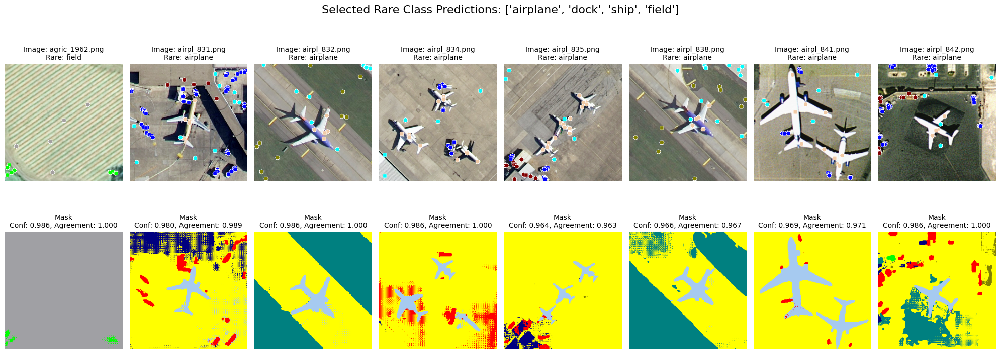


🎉 SELECTION COMPLETED!
📁 Output saved to: /home/iiitdmk-param/A.C/Anisha/4th objective/dlrsd/point_enhanced_confidence_selection_v2/targeted_rare_class_selection
📊 Final counts: 527 total, 29 rare class, 498 confident


In [30]:
import numpy as np
import cv2
import os
import matplotlib.pyplot as plt
import shutil
from collections import defaultdict

# ==================== CONFIGURATION ====================
predictions_dir = '/home/iiitdmk-param/A.C/Anisha/4th objective/dlrsd/simple_fusion_refined_predictions'
test_image_dir = '/home/iiitdmk-param/A.C/Anisha/4th objective/dlrsd/full_test_images'
point_annotation_dir = '/home/iiitdmk-param/A.C/Anisha/4th objective/dlrsd/full_test_point_masks'
output_base_dir = '/home/iiitdmk-param/A.C/Anisha/4th objective/dlrsd/point_enhanced_confidence_selection_v2'

CLASS_INFO = {
    0: {"name": "background", "rgb": [0, 0, 0]},
    1: {"name": "airplane", "rgb": [166, 202, 240]},
    2: {"name": "bare soil", "rgb": [128, 128, 0]},
    3: {"name": "buildings", "rgb": [0, 0, 128]},
    4: {"name": "cars", "rgb": [255, 0, 0]},
    5: {"name": "chaparral", "rgb": [0, 128, 0]},
    6: {"name": "court", "rgb": [128, 0, 0]},
    7: {"name": "dock", "rgb": [255, 233, 233]},
    8: {"name": "field", "rgb": [160, 160, 164]},
    9: {"name": "grass", "rgb": [0, 128, 128]},
    10: {"name": "mobile home", "rgb": [90, 87, 255]},
    11: {"name": "pavement", "rgb": [255, 255, 0]},
    12: {"name": "sand", "rgb": [255, 192, 0]},
    13: {"name": "sea", "rgb": [0, 0, 255]},
    14: {"name": "ship", "rgb": [255, 0, 192]},
    15: {"name": "tanks", "rgb": [128, 0, 128]},
    16: {"name": "trees", "rgb": [0, 255, 0]},
    17: {"name": "water", "rgb": [0, 255, 255]}
}

# Define our target rare classes based on the analysis
RARE_CLASSES = [1, 7, 14, 8]  # airplane, dock, ship, field
print("🎯 TARGET RARE CLASSES:")
for class_id in RARE_CLASSES:
    print(f"  • {CLASS_INFO[class_id]['name']} (ID {class_id})")

# ==================== POINT ANNOTATION LOADING ====================

def load_point_annotations(point_annotation_dir, image_files):
    """Load RGB point annotations and convert to class coordinates"""
    point_prompts = {}
    ignore_color = np.array([100, 100, 100])
    
    print("🔍 Loading point annotations...")
    
    for image_file in image_files:
        base_name = os.path.splitext(image_file)[0]
        point_path = os.path.join(point_annotation_dir, f"{base_name}.png")
        
        if os.path.exists(point_path):
            point_mask = cv2.imread(point_path)
            if point_mask is None:
                continue
                
            point_mask = cv2.cvtColor(point_mask, cv2.COLOR_BGR2RGB)
            non_ignore_mask = ~np.all(point_mask == ignore_color, axis=-1)
            
            class_points = {}
            for class_id, info in CLASS_INFO.items():
                if class_id == 0:
                    continue
                    
                target_color = np.array(info["rgb"])
                mask = np.all(point_mask == target_color, axis=-1) & non_ignore_mask
                
                if np.any(mask):
                    y_coords, x_coords = np.where(mask)
                    points = list(zip(x_coords, y_coords))
                    class_points[class_id] = points
            
            point_prompts[base_name] = class_points
    
    images_with_points = sum(1 for points in point_prompts.values() if points)
    total_points = sum(sum(len(points) for points in classes.values()) for classes in point_prompts.values())
    
    print(f"📊 Loaded {total_points} points across {images_with_points} images")
    
    return point_prompts

# ==================== CONFIDENCE METRICS ====================

def calculate_point_agreement_confidence(mask, point_annotations):
    """Calculate confidence based on agreement with point annotations"""
    if not point_annotations:
        return 0.0
    
    total_points = 0
    correct_points = 0
    
    for class_id, points in point_annotations.items():
        for x, y in points:
            total_points += 1
            if 0 <= y < mask.shape[0] and 0 <= x < mask.shape[1]:
                if mask[y, x] == class_id:
                    correct_points += 1
    
    return correct_points / total_points if total_points > 0 else 0.0

def calculate_boundary_confidence(mask):
    """Calculate confidence based on boundary smoothness"""
    mask_uint8 = mask.astype(np.uint8)
    contours, _ = cv2.findContours(mask_uint8, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    if len(contours) == 0:
        return 0.0
    
    total_confidence = 0
    total_area = 0
    
    for contour in contours:
        area = cv2.contourArea(contour)
        if area == 0:
            continue
            
        perimeter = cv2.arcLength(contour, True)
        compactness = (perimeter ** 2) / area
        confidence = max(0, 1 - (compactness - 12.57) / 100)
        total_confidence += confidence * area
        total_area += area
    
    return total_confidence / total_area if total_area > 0 else 0.0

def calculate_comprehensive_confidence(mask, point_annotations):
    """Combine multiple confidence metrics"""
    
    boundary_conf = calculate_boundary_confidence(mask)
    point_agreement = calculate_point_agreement_confidence(mask, point_annotations)
    
    if point_annotations:
        comprehensive_confidence = 0.6 * point_agreement + 0.4 * boundary_conf
    else:
        comprehensive_confidence = boundary_conf
    
    return comprehensive_confidence, point_agreement

# ==================== TARGETED RARE CLASS SELECTION ====================

def select_confident_with_rare_classes(predictions_dir, test_image_dir, point_annotation_dir, output_dir, 
                                     rare_classes, top_k_confident=0.4, min_per_rare_class=10, 
                                     min_point_agreement=0.5):
    """
    Select confident predictions while ensuring good representation of target rare classes
    """
    
    os.makedirs(output_dir, exist_ok=True)
    masks_dir = os.path.join(output_dir, 'masks')
    images_dir = os.path.join(output_dir, 'images')
    os.makedirs(masks_dir, exist_ok=True)
    os.makedirs(images_dir, exist_ok=True)
    
    pred_files = sorted([f for f in os.listdir(predictions_dir) if f.endswith('.png')])
    point_annotations = load_point_annotations(point_annotation_dir, pred_files)
    
    print(f"\n🎯 TARGETED SELECTION STRATEGY:")
    print(f"  - Selecting top {top_k_confident*100}% confident predictions")
    print(f"  - Ensuring at least {min_per_rare_class} images for each rare class")
    print(f"  - Minimum point agreement: {min_point_agreement}")
    
    # Step 1: Evaluate ALL predictions and identify which contain rare classes
    print(f"\n🔍 Evaluating {len(pred_files)} predictions...")
    
    all_predictions = []
    rare_class_candidates = {class_id: [] for class_id in rare_classes}
    
    for pred_file in pred_files:
        pred_path = os.path.join(predictions_dir, pred_file)
        mask = cv2.imread(pred_path, cv2.IMREAD_GRAYSCALE)
        
        if mask is None:
            continue
        
        base_name = os.path.splitext(pred_file)[0]
        point_info = point_annotations.get(base_name, {})
        
        comprehensive_conf, point_agreement = calculate_comprehensive_confidence(mask, point_info)
        
        # Skip if point agreement is too low (only if there are point annotations)
        if point_info and point_agreement < min_point_agreement:
            continue
        
        # Check which rare classes are present
        present_classes = set(np.unique(mask))
        present_rare_classes = [rc for rc in rare_classes if rc in present_classes]
        
        prediction_info = {
            'file': pred_file,
            'mask': mask,
            'confidence': comprehensive_conf,
            'point_agreement': point_agreement,
            'has_points': bool(point_info),
            'rare_classes': present_rare_classes,
            'has_rare_classes': len(present_rare_classes) > 0
        }
        
        all_predictions.append(prediction_info)
        
        # Add to rare class candidates
        for rare_class in present_rare_classes:
            rare_class_candidates[rare_class].append(prediction_info)
    
    # Print rare class candidate statistics
    print(f"\n📊 RARE CLASS CANDIDATE STATISTICS:")
    for rare_class in rare_classes:
        candidates = rare_class_candidates[rare_class]
        print(f"  {CLASS_INFO[rare_class]['name']}: {len(candidates)} candidate images")
    
    # STRATEGY 1: First select high-confidence images that contain rare classes
    print(f"\n🎯 STEP 1: SELECTING HIGH-CONFIDENCE RARE CLASS IMAGES")
    
    selected_files = set()
    rare_class_counts = {class_id: 0 for class_id in rare_classes}
    
    # For each rare class, select the most confident images
    for rare_class in rare_classes:
        candidates = rare_class_candidates[rare_class]
        if not candidates:
            print(f"  ⚠️  No candidates found for {CLASS_INFO[rare_class]['name']}")
            continue
        
        # Sort by confidence and select top ones
        candidates.sort(key=lambda x: x['confidence'], reverse=True)
        num_to_select = min(len(candidates), min_per_rare_class)
        selected_candidates = candidates[:num_to_select]
        
        for pred_info in selected_candidates:
            if pred_info['file'] not in selected_files:
                selected_files.add(pred_info['file'])
                rare_class_counts[rare_class] += 1
                
                # Copy files
                src_mask_path = os.path.join(predictions_dir, pred_info['file'])
                dst_mask_path = os.path.join(masks_dir, pred_info['file'])
                shutil.copy2(src_mask_path, dst_mask_path)
                
                src_image_path = os.path.join(test_image_dir, pred_info['file'])
                dst_image_path = os.path.join(images_dir, pred_info['file'])
                if os.path.exists(src_image_path):
                    shutil.copy2(src_image_path, dst_image_path)
                
                print(f"  ✅ {pred_info['file']} - {CLASS_INFO[rare_class]['name']} "
                      f"(conf: {pred_info['confidence']:.3f}, agreement: {pred_info['point_agreement']:.3f})")
    
    # STRATEGY 2: Now select additional confident predictions to reach desired total
    print(f"\n🎯 STEP 2: SELECTING ADDITIONAL CONFIDENT PREDICTIONS")
    
    # Get remaining predictions (not already selected)
    remaining_predictions = [p for p in all_predictions if p['file'] not in selected_files]
    print(f"  Remaining pool: {len(remaining_predictions)} predictions")
    
    # Sort remaining by confidence and select top k%
    remaining_predictions.sort(key=lambda x: x['confidence'], reverse=True)
    num_additional = int(len(all_predictions) * top_k_confident) - len(selected_files)
    num_additional = max(0, num_additional)  # Ensure non-negative
    
    additional_selections = remaining_predictions[:num_additional]
    
    confident_count = 0
    for pred_info in additional_selections:
        if pred_info['file'] not in selected_files:
            selected_files.add(pred_info['file'])
            confident_count += 1
            
            # Copy files
            src_mask_path = os.path.join(predictions_dir, pred_info['file'])
            dst_mask_path = os.path.join(masks_dir, pred_info['file'])
            shutil.copy2(src_mask_path, dst_mask_path)
            
            src_image_path = os.path.join(test_image_dir, pred_info['file'])
            dst_image_path = os.path.join(images_dir, pred_info['file'])
            if os.path.exists(src_image_path):
                shutil.copy2(src_image_path, dst_image_path)
            
            rare_status = f" - Rare: {[CLASS_INFO[rc]['name'] for rc in pred_info['rare_classes']]}" if pred_info['rare_classes'] else ""
            print(f"  ✅ {pred_info['file']} (conf: {pred_info['confidence']:.3f}, agreement: {pred_info['point_agreement']:.3f}{rare_status})")
    
    # Final summary
    total_selected = len(selected_files)
    rare_total = sum(rare_class_counts.values())
    
    print(f"\n📊 FINAL SELECTION SUMMARY:")
    print(f"  Total selected: {total_selected}")
    print(f"  - Rare class images: {rare_total}")
    print(f"  - Additional confident images: {confident_count}")
    
    print(f"  Rare class representation:")
    for rare_class in rare_classes:
        count = rare_class_counts[rare_class]
        class_name = CLASS_INFO[rare_class]['name']
        status = "✓ SATISFIED" if count >= min_per_rare_class else f"✗ ONLY {count}"
        print(f"    - {class_name}: {count} images ({status})")
    
    # Calculate statistics about the selected dataset
    print(f"\n📈 SELECTED DATASET STATISTICS:")
    selected_rare_images = [p for p in all_predictions if p['file'] in selected_files and p['has_rare_classes']]
    selected_common_images = [p for p in all_predictions if p['file'] in selected_files and not p['has_rare_classes']]
    
    print(f"  Images with rare classes: {len(selected_rare_images)}")
    print(f"  Images without rare classes: {len(selected_common_images)}")
    
    # Calculate average confidence
    if selected_rare_images:
        avg_conf_rare = np.mean([p['confidence'] for p in selected_rare_images])
        avg_agreement_rare = np.mean([p['point_agreement'] for p in selected_rare_images if p['has_points']])
        print(f"  Average confidence (rare class images): {avg_conf_rare:.3f}")
        print(f"  Average point agreement (rare class images): {avg_agreement_rare:.3f}")
    
    if selected_common_images:
        avg_conf_common = np.mean([p['confidence'] for p in selected_common_images])
        avg_agreement_common = np.mean([p['point_agreement'] for p in selected_common_images if p['has_points']])
        print(f"  Average confidence (common class images): {avg_conf_common:.3f}")
        print(f"  Average point agreement (common class images): {avg_agreement_common:.3f}")
    
    return total_selected, rare_total, confident_count, rare_class_counts

# ==================== VISUALIZATION ====================

def visualize_selected_rare_classes(output_dir, test_image_dir, point_annotation_dir, num_samples=8):
    """Visualize the selected rare class predictions"""
    
    masks_dir = os.path.join(output_dir, 'masks')
    if not os.path.exists(masks_dir):
        print("❌ No masks found for visualization")
        return
    
    mask_files = sorted(os.listdir(masks_dir))
    point_annotations = load_point_annotations(point_annotation_dir, mask_files)
    
    # Identify which selected images contain rare classes
    rare_images = []
    for mask_file in mask_files:
        mask_path = os.path.join(masks_dir, mask_file)
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        
        if mask is None:
            continue
        
        present_classes = set(np.unique(mask))
        
        # Check if this image contains any of our target rare classes
        for rare_class in RARE_CLASSES:
            if rare_class in present_classes:
                rare_images.append((mask_file, rare_class))
                break
    
    # Take samples of rare class images
    samples_to_show = min(num_samples, len(rare_images))
    if samples_to_show == 0:
        print("❌ No rare class images found for visualization")
        return
    
    fig, axes = plt.subplots(2, samples_to_show, figsize=(20, 8))
    if samples_to_show == 1:
        axes = axes.reshape(2, 1)
    
    for i, (mask_file, rare_class) in enumerate(rare_images[:samples_to_show]):
        # Load image and mask
        image_path = os.path.join(test_image_dir, mask_file)
        mask_path = os.path.join(masks_dir, mask_file)
        
        image = cv2.imread(image_path)
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        
        if image is None or mask is None:
            continue
        
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
        # Create colored mask
        colored_mask = np.zeros((*mask.shape, 3), dtype=np.uint8)
        for class_id, info in CLASS_INFO.items():
            colored_mask[mask == class_id] = info["rgb"]
        
        # Get point annotations
        base_name = os.path.splitext(mask_file)[0]
        point_info = point_annotations.get(base_name, {})
        
        # Create image with point overlays
        image_with_points = image.copy()
        for class_id, points in point_info.items():
            color = np.array(CLASS_INFO[class_id]["rgb"])[::-1]
            for x, y in points:
                cv2.circle(image_with_points, (x, y), 5, color.tolist(), -1)
                cv2.circle(image_with_points, (x, y), 5, (255, 255, 255), 1)
        
        # Calculate metrics
        point_agreement = calculate_point_agreement_confidence(mask, point_info)
        comprehensive_conf, _ = calculate_comprehensive_confidence(mask, point_info)
        
        # Plot
        axes[0, i].imshow(image_with_points)
        axes[0, i].set_title(f'Image: {mask_file}\nRare: {CLASS_INFO[rare_class]["name"]}', fontsize=10)
        axes[0, i].axis('off')
        
        axes[1, i].imshow(colored_mask)
        axes[1, i].set_title(f'Mask\nConf: {comprehensive_conf:.3f}, Agreement: {point_agreement:.3f}', fontsize=10)
        axes[1, i].axis('off')
    
    plt.suptitle(f'Selected Rare Class Predictions: {[CLASS_INFO[rc]["name"] for rc in RARE_CLASSES]}', fontsize=16)
    plt.tight_layout()
    plt.show()

# ==================== MAIN EXECUTION ====================

def main():
    print("🚀 TARGETED CONFIDENT + RARE CLASS SELECTION")
    print("=" * 60)
    print("Focusing on 4 least frequent classes:")
    for class_id in RARE_CLASSES:
        print(f"  • {CLASS_INFO[class_id]['name']} (ID {class_id})")
    print("=" * 60)
    
    # Run targeted selection
    output_dir = os.path.join(output_base_dir, 'targeted_rare_class_selection')
    
    total_count, rare_count, confident_count, rare_counts = select_confident_with_rare_classes(
        predictions_dir=predictions_dir,
        test_image_dir=test_image_dir,
        point_annotation_dir=point_annotation_dir,
        output_dir=output_dir,
        rare_classes=RARE_CLASSES,
        top_k_confident=0.4,        # Top 40% most confident overall
        min_per_rare_class=10,      # Aim for 10 images per rare class (adjust based on availability)
        min_point_agreement=0.5     # Lower threshold to include more rare classes
    )
    
    # Visualize results
    print(f"\n🖼️  Visualizing selected rare class predictions...")
    visualize_selected_rare_classes(output_dir, test_image_dir, point_annotation_dir)
    
    print(f"\n🎉 SELECTION COMPLETED!")
    print(f"📁 Output saved to: {output_dir}")
    print(f"📊 Final counts: {total_count} total, {rare_count} rare class, {confident_count} confident")

if __name__ == "__main__":
    main()

🚀 CONFIDENT + RARE CLASS SELECTION STRATEGY
Strategy:
1. First: Select most confident images from ALL
2. Then: From remaining, select most confident rare class images
📁 Analyzing 1319 predictions to find 4 rare classes...
  Processed 0/1319 images...
  Processed 100/1319 images...
  Processed 200/1319 images...
  Processed 300/1319 images...
  Processed 400/1319 images...
  Processed 500/1319 images...
  Processed 600/1319 images...
  Processed 700/1319 images...
  Processed 800/1319 images...
  Processed 900/1319 images...
  Processed 1000/1319 images...
  Processed 1100/1319 images...
  Processed 1200/1319 images...
  Processed 1300/1319 images...

🎯 IDENTIFIED 4 RARE CLASSES:
  • field (ID 8): appears in 71 images
  • ship (ID 14): appears in 80 images
  • dock (ID 7): appears in 83 images
  • airplane (ID 1): appears in 88 images
🔍 Loading point annotations...
📊 Loaded 158237 points across 1319 images

🔍 Evaluating 1319 predictions for selection...
📊 After filtering: 1318 predictio

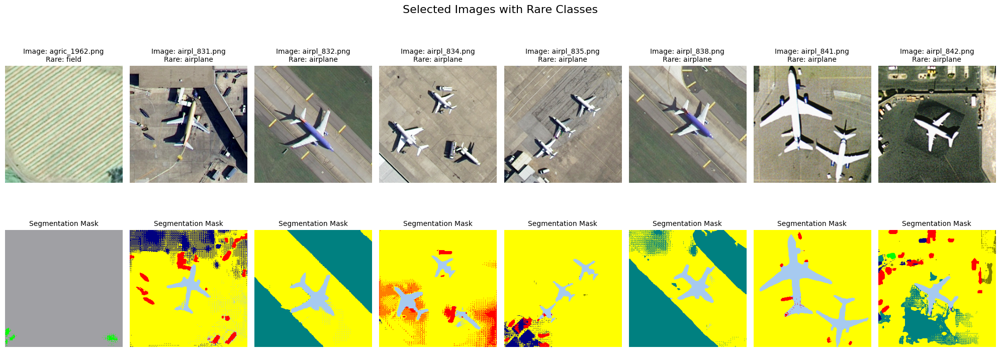


🎉 SELECTION COMPLETED!
📁 Output saved to: /home/iiitdmk-param/A.C/Anisha/4th objective/dlrsd/point_enhanced_confidence_selection_v2/confident_then_rare_strategy
📊 Final counts: 527 total, 527 confident, 0 additional rare


In [31]:
import numpy as np
import cv2
import os
import matplotlib.pyplot as plt
import shutil
from collections import defaultdict

# ==================== CONFIGURATION ====================
predictions_dir = '/home/iiitdmk-param/A.C/Anisha/4th objective/dlrsd/simple_fusion_refined_predictions'
test_image_dir = '/home/iiitdmk-param/A.C/Anisha/4th objective/dlrsd/full_test_images'
point_annotation_dir = '/home/iiitdmk-param/A.C/Anisha/4th objective/dlrsd/full_test_point_masks'
output_base_dir = '/home/iiitdmk-param/A.C/Anisha/4th objective/dlrsd/point_enhanced_confidence_selection_v2'

CLASS_INFO = {
    0: {"name": "background", "rgb": [0, 0, 0]},
    1: {"name": "airplane", "rgb": [166, 202, 240]},
    2: {"name": "bare soil", "rgb": [128, 128, 0]},
    3: {"name": "buildings", "rgb": [0, 0, 128]},
    4: {"name": "cars", "rgb": [255, 0, 0]},
    5: {"name": "chaparral", "rgb": [0, 128, 0]},
    6: {"name": "court", "rgb": [128, 0, 0]},
    7: {"name": "dock", "rgb": [255, 233, 233]},
    8: {"name": "field", "rgb": [160, 160, 164]},
    9: {"name": "grass", "rgb": [0, 128, 128]},
    10: {"name": "mobile home", "rgb": [90, 87, 255]},
    11: {"name": "pavement", "rgb": [255, 255, 0]},
    12: {"name": "sand", "rgb": [255, 192, 0]},
    13: {"name": "sea", "rgb": [0, 0, 255]},
    14: {"name": "ship", "rgb": [255, 0, 192]},
    15: {"name": "tanks", "rgb": [128, 0, 128]},
    16: {"name": "trees", "rgb": [0, 255, 0]},
    17: {"name": "water", "rgb": [0, 255, 255]}
}

# ==================== UTILITY FUNCTIONS ====================

def load_point_annotations(point_annotation_dir, image_files):
    """Load RGB point annotations and convert to class coordinates"""
    point_prompts = {}
    ignore_color = np.array([100, 100, 100])
    
    print("🔍 Loading point annotations...")
    
    for image_file in image_files:
        base_name = os.path.splitext(image_file)[0]
        point_path = os.path.join(point_annotation_dir, f"{base_name}.png")
        
        if os.path.exists(point_path):
            point_mask = cv2.imread(point_path)
            if point_mask is None:
                continue
                
            point_mask = cv2.cvtColor(point_mask, cv2.COLOR_BGR2RGB)
            non_ignore_mask = ~np.all(point_mask == ignore_color, axis=-1)
            
            class_points = {}
            for class_id, info in CLASS_INFO.items():
                if class_id == 0:
                    continue
                    
                target_color = np.array(info["rgb"])
                mask = np.all(point_mask == target_color, axis=-1) & non_ignore_mask
                
                if np.any(mask):
                    y_coords, x_coords = np.where(mask)
                    points = list(zip(x_coords, y_coords))
                    class_points[class_id] = points
            
            point_prompts[base_name] = class_points
    
    images_with_points = sum(1 for points in point_prompts.values() if points)
    total_points = sum(sum(len(points) for points in classes.values()) for classes in point_prompts.values())
    
    print(f"📊 Loaded {total_points} points across {images_with_points} images")
    
    return point_prompts

def calculate_point_agreement_confidence(mask, point_annotations):
    """Calculate confidence based on agreement with point annotations"""
    if not point_annotations:
        return 0.0
    
    total_points = 0
    correct_points = 0
    
    for class_id, points in point_annotations.items():
        for x, y in points:
            total_points += 1
            if 0 <= y < mask.shape[0] and 0 <= x < mask.shape[1]:
                if mask[y, x] == class_id:
                    correct_points += 1
    
    return correct_points / total_points if total_points > 0 else 0.0

def calculate_boundary_confidence(mask):
    """Calculate confidence based on boundary smoothness"""
    mask_uint8 = mask.astype(np.uint8)
    contours, _ = cv2.findContours(mask_uint8, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    if len(contours) == 0:
        return 0.0
    
    total_confidence = 0
    total_area = 0
    
    for contour in contours:
        area = cv2.contourArea(contour)
        if area == 0:
            continue
            
        perimeter = cv2.arcLength(contour, True)
        compactness = (perimeter ** 2) / area
        confidence = max(0, 1 - (compactness - 12.57) / 100)
        total_confidence += confidence * area
        total_area += area
    
    return total_confidence / total_area if total_area > 0 else 0.0

def calculate_comprehensive_confidence(mask, point_annotations):
    """Combine multiple confidence metrics"""
    
    boundary_conf = calculate_boundary_confidence(mask)
    point_agreement = calculate_point_agreement_confidence(mask, point_annotations)
    
    if point_annotations:
        comprehensive_confidence = 0.6 * point_agreement + 0.4 * boundary_conf
    else:
        comprehensive_confidence = boundary_conf
    
    return comprehensive_confidence, point_agreement

# ==================== RARE CLASS IDENTIFICATION ====================

def find_rare_classes(predictions_dir, num_rare_classes=4):
    """Find the N least frequent classes in predictions (excluding background)"""
    
    pred_files = sorted([f for f in os.listdir(predictions_dir) if f.endswith('.png')])
    print(f"📁 Analyzing {len(pred_files)} predictions to find {num_rare_classes} rare classes...")
    
    # Count how many images contain each class
    class_counts = defaultdict(int)
    
    for i, pred_file in enumerate(pred_files):
        if i % 100 == 0:
            print(f"  Processed {i}/{len(pred_files)} images...")
            
        pred_path = os.path.join(predictions_dir, pred_file)
        mask = cv2.imread(pred_path, cv2.IMREAD_GRAYSCALE)
        
        if mask is None:
            continue
        
        # Get unique classes in this image
        unique_classes = set(np.unique(mask))
        
        # Count each class that appears in this image
        for class_id in unique_classes:
            class_counts[class_id] += 1
    
    # Remove background (class 0) and sort by frequency (ascending)
    if 0 in class_counts:
        del class_counts[0]
    
    # Get the N least frequent classes
    sorted_classes = sorted(class_counts.items(), key=lambda x: x[1])
    rare_classes = [class_id for class_id, count in sorted_classes[:num_rare_classes]]
    
    print(f"\n🎯 IDENTIFIED {num_rare_classes} RARE CLASSES:")
    for class_id in rare_classes:
        count = class_counts[class_id]
        print(f"  • {CLASS_INFO[class_id]['name']} (ID {class_id}): appears in {count} images")
    
    return rare_classes, class_counts

# ==================== MAIN SELECTION STRATEGY ====================

def select_confident_then_rare(predictions_dir, test_image_dir, point_annotation_dir, output_dir, 
                              top_k_confident=0.4, min_per_rare_class=10, min_point_agreement=0.5):
    """
    STRATEGY:
    1. First select the most confident images from ALL images
    2. Then from the REMAINING images, select the most confident images for each rare class
    """
    
    os.makedirs(output_dir, exist_ok=True)
    masks_dir = os.path.join(output_dir, 'masks')
    images_dir = os.path.join(output_dir, 'images')
    os.makedirs(masks_dir, exist_ok=True)
    os.makedirs(images_dir, exist_ok=True)
    
    # Step 1: Identify rare classes from predictions
    rare_classes, class_counts = find_rare_classes(predictions_dir, num_rare_classes=4)
    
    pred_files = sorted([f for f in os.listdir(predictions_dir) if f.endswith('.png')])
    point_annotations = load_point_annotations(point_annotation_dir, pred_files)
    
    print(f"\n🔍 Evaluating {len(pred_files)} predictions for selection...")
    
    # Evaluate all predictions
    all_predictions = []
    
    for pred_file in pred_files:
        pred_path = os.path.join(predictions_dir, pred_file)
        mask = cv2.imread(pred_path, cv2.IMREAD_GRAYSCALE)
        
        if mask is None:
            continue
        
        base_name = os.path.splitext(pred_file)[0]
        point_info = point_annotations.get(base_name, {})
        
        comprehensive_conf, point_agreement = calculate_comprehensive_confidence(mask, point_info)
        
        # Skip if point agreement is too low (only if there are point annotations)
        if point_info and point_agreement < min_point_agreement:
            continue
        
        # Check which rare classes are present
        present_classes = set(np.unique(mask))
        present_rare_classes = [rc for rc in rare_classes if rc in present_classes]
        
        prediction_info = {
            'file': pred_file,
            'mask': mask,
            'confidence': comprehensive_conf,
            'point_agreement': point_agreement,
            'has_points': bool(point_info),
            'rare_classes': present_rare_classes,
            'has_rare_classes': len(present_rare_classes) > 0
        }
        
        all_predictions.append(prediction_info)
    
    print(f"📊 After filtering: {len(all_predictions)} predictions meet criteria")
    
    # STRATEGY 1: Select most confident images from ALL
    print(f"\n🎯 STEP 1: SELECTING TOP {top_k_confident*100}% CONFIDENT IMAGES")
    
    # Sort all predictions by confidence
    all_predictions.sort(key=lambda x: x['confidence'], reverse=True)
    num_confident_to_select = int(len(all_predictions) * top_k_confident)
    
    selected_files = set()
    confident_selections = []
    
    # Select the top confident ones
    for pred_info in all_predictions[:num_confident_to_select]:
        selected_files.add(pred_info['file'])
        confident_selections.append(pred_info)
    
    # Copy confident selections
    confident_count = 0
    for pred_info in confident_selections:
        # Copy files
        src_mask_path = os.path.join(predictions_dir, pred_info['file'])
        dst_mask_path = os.path.join(masks_dir, pred_info['file'])
        shutil.copy2(src_mask_path, dst_mask_path)
        
        src_image_path = os.path.join(test_image_dir, pred_info['file'])
        dst_image_path = os.path.join(images_dir, pred_info['file'])
        if os.path.exists(src_image_path):
            shutil.copy2(src_image_path, dst_image_path)
        
        confident_count += 1
        
        rare_status = f" - Rare: {[CLASS_INFO[rc]['name'] for rc in pred_info['rare_classes']]}" if pred_info['rare_classes'] else ""
        print(f"  ✅ {pred_info['file']} (conf: {pred_info['confidence']:.3f}, agreement: {pred_info['point_agreement']:.3f}{rare_status})")
    
    # STRATEGY 2: From REMAINING, select rare class images
    print(f"\n🎯 STEP 2: SELECTING RARE CLASS IMAGES FROM REMAINING POOL")
    
    # Get remaining predictions
    remaining_predictions = [p for p in all_predictions if p['file'] not in selected_files]
    print(f"  Remaining pool size: {len(remaining_predictions)} images")
    
    # For each rare class, select most confident images from remaining
    rare_class_counts = {class_id: 0 for class_id in rare_classes}
    additional_rare_selections = []
    
    # First, count how many rare class images we already have in confident selections
    for pred_info in confident_selections:
        for rare_class in pred_info['rare_classes']:
            rare_class_counts[rare_class] += 1
    
    # Now select additional rare class images from remaining
    for rare_class in rare_classes:
        current_count = rare_class_counts[rare_class]
        needed = max(0, min_per_rare_class - current_count)
        
        if needed > 0:
            print(f"  🔍 {CLASS_INFO[rare_class]['name']}: has {current_count}, needs {needed} more")
            
            # Find images in REMAINING pool that contain this rare class
            class_candidates = [p for p in remaining_predictions 
                              if rare_class in p['rare_classes'] and p['file'] not in selected_files]
            
            if not class_candidates:
                print(f"    ❌ No candidates found for {CLASS_INFO[rare_class]['name']}")
                continue
            
            # Sort by confidence (most confident first)
            class_candidates.sort(key=lambda x: x['confidence'], reverse=True)
            
            # Select the needed number (or all available if less than needed)
            to_select = class_candidates[:needed]
            
            for pred_info in to_select:
                if pred_info['file'] not in selected_files:
                    selected_files.add(pred_info['file'])
                    additional_rare_selections.append(pred_info)
                    rare_class_counts[rare_class] += 1
                    
                    # Copy files
                    src_mask_path = os.path.join(predictions_dir, pred_info['file'])
                    dst_mask_path = os.path.join(masks_dir, pred_info['file'])
                    shutil.copy2(src_mask_path, dst_mask_path)
                    
                    src_image_path = os.path.join(test_image_dir, pred_info['file'])
                    dst_image_path = os.path.join(images_dir, pred_info['file'])
                    if os.path.exists(src_image_path):
                        shutil.copy2(src_image_path, dst_image_path)
                    
                    print(f"  ✅ {pred_info['file']} - {CLASS_INFO[rare_class]['name']} "
                          f"(conf: {pred_info['confidence']:.3f}, agreement: {pred_info['point_agreement']:.3f})")
    
    # Final summary
    total_selected = len(selected_files)
    additional_rare_count = len(additional_rare_selections)
    
    print(f"\n📊 FINAL SELECTION SUMMARY:")
    print(f"  Step 1 - Confident selections: {confident_count}")
    print(f"  Step 2 - Additional rare class selections: {additional_rare_count}")
    print(f"  Total selected: {total_selected}")
    
    print(f"  Rare class representation:")
    for rare_class in rare_classes:
        count = rare_class_counts[rare_class]
        class_name = CLASS_INFO[rare_class]['name']
        status = "✓ SATISFIED" if count >= min_per_rare_class else f"✗ ONLY {count}"
        print(f"    - {class_name}: {count} images ({status})")
    
    return total_selected, confident_count, additional_rare_count, rare_class_counts

# ==================== VISUALIZATION ====================

def visualize_results(output_dir, test_image_dir, point_annotation_dir):
    """Visualize the selected images, focusing on rare classes"""
    
    masks_dir = os.path.join(output_dir, 'masks')
    if not os.path.exists(masks_dir):
        print("❌ No masks found for visualization")
        return
    
    mask_files = sorted(os.listdir(masks_dir))
    point_annotations = load_point_annotations(point_annotation_dir, mask_files)
    
    # Find rare classes from the selected masks
    rare_classes = []
    class_counts = defaultdict(int)
    
    for mask_file in mask_files:
        mask_path = os.path.join(masks_dir, mask_file)
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        
        if mask is not None:
            unique_classes = set(np.unique(mask))
            for class_id in unique_classes:
                if class_id != 0:  # Exclude background
                    class_counts[class_id] += 1
    
    # Get the 4 least frequent classes from selected images
    sorted_classes = sorted(class_counts.items(), key=lambda x: x[1])
    rare_classes = [class_id for class_id, count in sorted_classes[:4]]
    
    print(f"\n🖼️  VISUALIZING RARE CLASSES IN SELECTED DATASET:")
    for class_id in rare_classes:
        print(f"  • {CLASS_INFO[class_id]['name']}: {class_counts[class_id]} images")
    
    # Find images containing rare classes for visualization
    rare_images = []
    for mask_file in mask_files:
        mask_path = os.path.join(masks_dir, mask_file)
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        
        if mask is None:
            continue
        
        present_classes = set(np.unique(mask))
        for rare_class in rare_classes:
            if rare_class in present_classes:
                rare_images.append((mask_file, rare_class))
                break
    
    # Visualize up to 8 samples
    samples_to_show = min(8, len(rare_images))
    if samples_to_show == 0:
        print("❌ No rare class images found for visualization")
        return
    
    fig, axes = plt.subplots(2, samples_to_show, figsize=(20, 8))
    if samples_to_show == 1:
        axes = axes.reshape(2, 1)
    
    for i, (mask_file, rare_class) in enumerate(rare_images[:samples_to_show]):
        # Load image and mask
        image_path = os.path.join(test_image_dir, mask_file)
        mask_path = os.path.join(masks_dir, mask_file)
        
        image = cv2.imread(image_path)
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        
        if image is None or mask is None:
            continue
        
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
        # Create colored mask
        colored_mask = np.zeros((*mask.shape, 3), dtype=np.uint8)
        for class_id, info in CLASS_INFO.items():
            colored_mask[mask == class_id] = info["rgb"]
        
        # Plot
        axes[0, i].imshow(image)
        axes[0, i].set_title(f'Image: {mask_file}\nRare: {CLASS_INFO[rare_class]["name"]}', fontsize=10)
        axes[0, i].axis('off')
        
        axes[1, i].imshow(colored_mask)
        axes[1, i].set_title(f'Segmentation Mask', fontsize=10)
        axes[1, i].axis('off')
    
    plt.suptitle('Selected Images with Rare Classes', fontsize=16)
    plt.tight_layout()
    plt.show()

# ==================== MAIN EXECUTION ====================

def main():
    print("🚀 CONFIDENT + RARE CLASS SELECTION STRATEGY")
    print("=" * 60)
    print("Strategy:")
    print("1. First: Select most confident images from ALL")
    print("2. Then: From remaining, select most confident rare class images")
    print("=" * 60)
    
    # Run selection
    output_dir = os.path.join(output_base_dir, 'confident_then_rare_strategy')
    
    total_count, confident_count, rare_count, rare_counts = select_confident_then_rare(
        predictions_dir=predictions_dir,
        test_image_dir=test_image_dir,
        point_annotation_dir=point_annotation_dir,
        output_dir=output_dir,
        top_k_confident=0.4,        # Top 40% most confident
        min_per_rare_class=10,      # Aim for 10 images per rare class
        min_point_agreement=0.5     # Minimum point agreement
    )
    
    # Visualize results
    print(f"\n🖼️  Visualizing selected dataset...")
    visualize_results(output_dir, test_image_dir, point_annotation_dir)
    
    print(f"\n🎉 SELECTION COMPLETED!")
    print(f"📁 Output saved to: {output_dir}")
    print(f"📊 Final counts: {total_count} total, {confident_count} confident, {rare_count} additional rare")

if __name__ == "__main__":
    main()

In [33]:
import os
import shutil

# ==================== CONFIGURATION ====================
selected_images_dir = '/home/iiitdmk-param/A.C/Anisha/4th objective/dlrsd/point_enhanced_confidence_selection_v2/confident_then_rare_strategy/images'
selected_masks_dir = '/home/iiitdmk-param/A.C/Anisha/4th objective/dlrsd/point_enhanced_confidence_selection_v2/confident_then_rare_strategy/masks'

original_train_images = '/home/iiitdmk-param/A.C/Anisha/4th objective/dlrsd/train_images'
original_train_masks = '/home/iiitdmk-param/A.C/Anisha/4th objective/dlrsd/train_1cmasks'

merged_output_dir = '/home/iiitdmk-param/A.C/Anisha/4th objective/dlrsd/merged_training_dataset'

# ==================== SIMPLE MERGING ====================

def simple_merge():
    print("🚀 SIMPLE DATASET MERGING")
    
    # Create output directories
    merged_images = os.path.join(merged_output_dir, 'images')
    merged_masks = os.path.join(merged_output_dir, 'masks')
    os.makedirs(merged_images, exist_ok=True)
    os.makedirs(merged_masks, exist_ok=True)
    
    # Copy original training data
    print("📁 Copying original training data...")
    for img_file in os.listdir(original_train_images):
        src = os.path.join(original_train_images, img_file)
        dst = os.path.join(merged_images, img_file)
        shutil.copy2(src, dst)
    
    for mask_file in os.listdir(original_train_masks):
        src = os.path.join(original_train_masks, mask_file)
        dst = os.path.join(merged_masks, mask_file)
        shutil.copy2(src, dst)
    
    # Copy selected confident data (with prefix to avoid conflicts)
    print("📁 Copying selected confident data...")
    for img_file in os.listdir(selected_images_dir):
        src = os.path.join(selected_images_dir, img_file)
        # Add prefix to avoid filename conflicts
        new_name = f"confident_{img_file}"
        dst = os.path.join(merged_images, new_name)
        shutil.copy2(src, dst)
    
    for mask_file in os.listdir(selected_masks_dir):
        src = os.path.join(selected_masks_dir, mask_file)
        # Use same naming convention
        new_name = f"confident_{mask_file}"
        dst = os.path.join(merged_masks, new_name)
        shutil.copy2(src, dst)
    
    # Count results
    final_images = len(os.listdir(merged_images))
    final_masks = len(os.listdir(merged_masks))
    
    print(f"\n🎉 MERGING COMPLETED!")
    print(f"📁 Output: {merged_output_dir}")
    print(f"📊 Final dataset: {final_images} images, {final_masks} masks")
    print(f"📈 Added {len(os.listdir(selected_images_dir))} confident images to original training set")

if __name__ == "__main__":
    simple_merge()

🚀 SIMPLE DATASET MERGING
📁 Copying original training data...
📁 Copying selected confident data...

🎉 MERGING COMPLETED!
📁 Output: /home/iiitdmk-param/A.C/Anisha/4th objective/dlrsd/merged_training_dataset
📊 Final dataset: 1157 images, 1157 masks
📈 Added 527 confident images to original training set
